<a href="https://colab.research.google.com/github/Ankit7Das/Automatic-Detection-of-Schizophrenia-using-Spectrograms-from-EEG-Signals/blob/main/ankit_Sz_mhrc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from tqdm import tqdm
import glob
import numpy as np
import pickle
import matplotlib.pyplot as plt
import os
import os.path as path
!pip install mne datasets transformers torch

import pandas as pd

from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from matplotlib.figure import Figure

import seaborn as sns
import math
import cv2
import pywt
from PIL import Image

import scipy.stats as stats
from scipy.fftpack import fft, ifft
from scipy import signal
from scipy.signal import butter, sosfilt, sosfreqz

from sklearn.model_selection import GroupKFold, LeaveOneGroupOut, KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.utils import shuffle
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score

import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Conv1D, BatchNormalization, LeakyReLU, ReLU, MaxPool2D, MaxPool1D, GlobalAveragePooling2D, Dense, Dropout, AveragePooling2D,\
Flatten, Input, concatenate, Activation, LSTM, TimeDistributed
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.backend import clear_session
from tensorflow.keras.optimizers.legacy import Adam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import Sequential

np.random.seed(1)
plt.style.use('seaborn-poster')
%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 45.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.6/474.6 kB 44.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 76.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 66.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 25.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 99.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━

<ipython-input-1-57370b256ccc>:45: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-poster')


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
base_dir = 'drive/MyDrive/Ankit/Dataset/'

In [ ]:
normalfiles=os.listdir(base_dir + 'norm/')
healthy=[]
healthy_labels=[]
r=0
with tqdm(total=len(normalfiles)) as pbar:
    for file in normalfiles:
        feats=[]
        filename=base_dir + "norm/"+file
        f = open(filename, 'r')     #opening file
        x = f.readline()
        sublist=[]
        i=0
        while x:
            if i<=7679:                     #getting features per channels
                sublist.append(float(x))
            else:
                i=0
                sublist=np.array(sublist)
                feats.append(sublist)
                sublist=[]
                sublist.append(float(x))
            i+=1
            x=f.readline()
        sublist=np.array(sublist)
        feats.append(sublist)
        feats=np.array(feats)
        healthy.append(feats)
        healthy_labels.append(0)      #1,0 for nomal
        pbar.update(1)

healthy=np.array(healthy)
print(healthy.shape)

# with open('normal_features', 'wb') as fp:
#     pickle.dump(features, fp)

healthy_labels=np.array(healthy_labels)
print(healthy_labels.shape)

# with open('normal_labels', 'wb') as fp:
#     pickle.dump(labels, fp)



illfiles=os.listdir(base_dir + 'sch/')
patient=[]
patient_labels=[]
r=0
with tqdm(total=len(illfiles)) as pbar:
    for file in illfiles:
        feats=[]
        filename=base_dir + "sch/"+file
        f = open(filename, 'r')     #opening file
        x = f.readline()
        sublist=[]
        i=0
        while x:
            if i<=7679:                     #getting features per channels
                sublist.append(float(x))
            else:
                i=0
                sublist=np.array(sublist)
                feats.append(sublist)
                sublist=[]
                sublist.append(float(x))
            i+=1
            x=f.readline()
        sublist=np.array(sublist)
        feats.append(sublist)
        feats=np.array(feats)
        patient.append(feats)
        patient_labels.append(1)      #1,0 for nomal
        pbar.update(1)

patient=np.array(patient)
print(patient.shape)

# with open('ill_features', 'wb') as fp:
#     pickle.dump(features, fp)

patient_labels=np.array(patient_labels)
print(patient_labels.shape)

100%|██████████| 39/39 [00:34<00:00,  1.11it/s]


(39, 16, 7680)
(39,)


100%|██████████| 45/45 [00:31<00:00,  1.43it/s]

(45, 16, 7680)
(45,)


In [ ]:
for file in normalfiles:
    filename=base_dir + "norm/"+file
    print(filename)
    break;

drive/MyDrive/Ankit/Dataset/norm/S42W1.eea


In [ ]:
healthy[0]

array([[-154.12, -112.09, -154.12, ..., -252.19, -112.09,  -93.4 ],
       [ 177.47,  135.44, -294.23, ..., -714.55, -373.62, -373.62],
       [  56.04,  -42.03, -382.96, ..., -574.44,  -70.05,    9.34],
       ...,
       [ 196.15,   56.04, -270.87, ...,   98.08,  177.47,  158.79],
       [ 135.44,    0.  , -294.23, ...,  -23.35,   79.39,  -23.35],
       [ 158.79,   18.68, -653.83, ...,  177.47,  317.58,  126.1 ]])

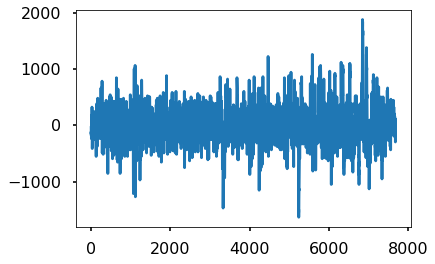

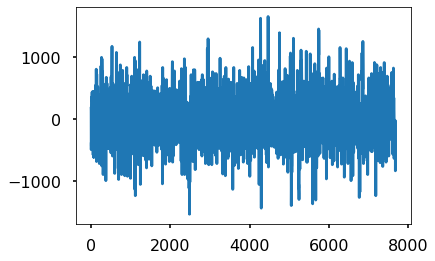

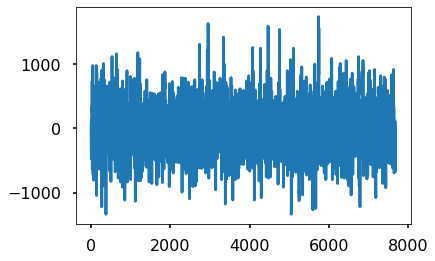

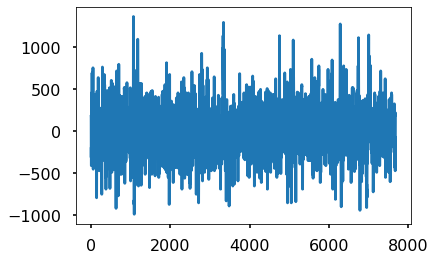

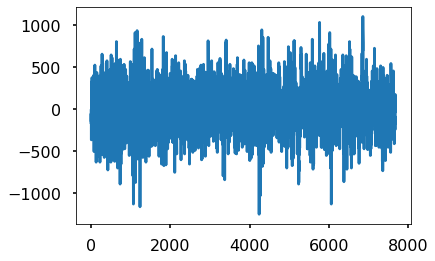

...

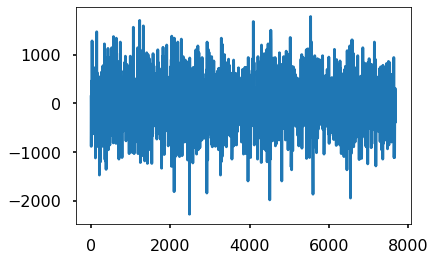

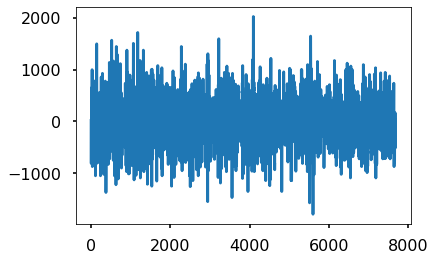

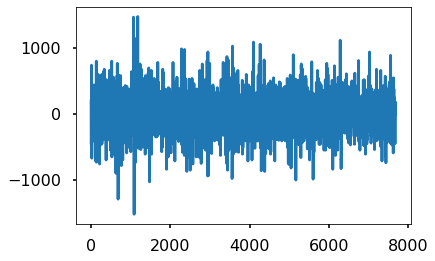

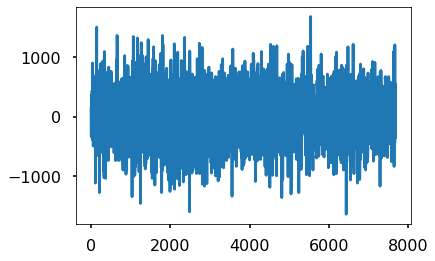

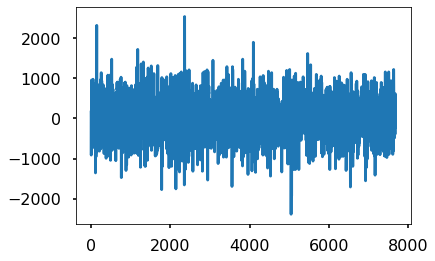

In [ ]:
for x in healthy[0]:
    plt.plot(x)
    plt.show()

In [ ]:
for x in healthy:
    print(np.min(x), np.max(x))

for x in patient:
    print(np.min(x), np.max(x))

In [ ]:
!pip install pyedflib
import pyedflib
import os

In [ ]:
channels = ['F7', 'F3', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4', 'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']

In [ ]:
for i, x in enumerate(healthy):
    file_name = os.path.join('drive/MyDrive/Ankit/mhrc', 'healthy'+str(i)+'.edf')
    f = pyedflib.EdfWriter(file_name, 16)
    channel_info = []
    data_list = []

    for j, ch in enumerate(channels):
        l = np.min(x[j])
        h = np.max(x[j])
        ch_dict = {'label': ch, 'dimension': 'uV', 'sample_rate': 1250.0, 'sample_frequency': 1250.0, 'physical_max': h, 'physical_min': l, 'digital_max': 32767, 'digital_min': -32767}
        channel_info.append(ch_dict)
        data_list.append(x[j])

    f.setSignalHeaders(channel_info)
    f.writeSamples(data_list)
    f.close()
    del f

for i, x in enumerate(patient):
    file_name = os.path.join('drive/MyDrive/Ankit/mhrc', 'patient'+str(i)+'.edf')
    f = pyedflib.EdfWriter(file_name, 16)
    channel_info = []
    data_list = []

    for j, ch in enumerate(channels):
        l = np.min(x[j])
        h = np.max(x[j])
        ch_dict = {'label': ch, 'dimension': 'uV', 'sample_rate': 128.0, 'sample_frequency': 128.0, 'physical_max': h, 'physical_min': l, 'digital_max': 32767, 'digital_min': -32767}
        channel_info.append(ch_dict)
        data_list.append(x[j])

    f.setSignalHeaders(channel_info)
    f.writeSamples(data_list)
    f.close()
    del f

In [ ]:
# Baseline removal function

def calc_baseline(signal):
    """
    Calculate the baseline of signal.
    Args:
        signal (numpy 1d array): signal whose baseline should be calculated
    Returns:
        baseline (numpy 1d array with same size as signal): baseline of the signal
    """
    ssds = np.zeros((3))

    cur_lp = np.copy(signal)
    iterations = 0
    while True:
        # Decompose 1 level
        lp, hp = pywt.dwt(cur_lp, "db4")

        # Shift and calculate the energy of detail/high pass coefficient
        ssds = np.concatenate(([np.sum(hp ** 2)], ssds[:-1]))

        # Check if we are in the local minimum of energy function of high-pass signal
        if ssds[2] > ssds[1] and ssds[1] < ssds[0]:
            break

        cur_lp = lp[:]
        iterations += 1

    # Reconstruct the baseline from this level low pass signal up to the original length
    baseline = cur_lp[:]
    for _ in range(iterations):
        baseline = pywt.idwt(baseline, np.zeros((len(baseline))), "db4")

    return baseline[: len(signal)]

In [ ]:
# Baseline Removal for each signal

bsr_healthy = [[y-calc_baseline(y) for y in x] for x in healthy]
bsr_patient = [[y-calc_baseline(y) for y in x] for x in patient]

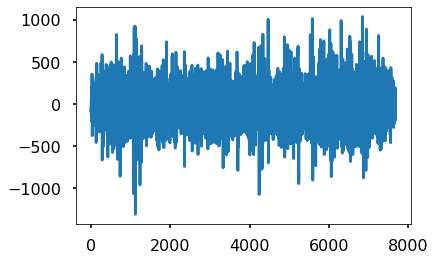

In [ ]:
plt.plot(bsr_healthy[0][0])
plt.show()

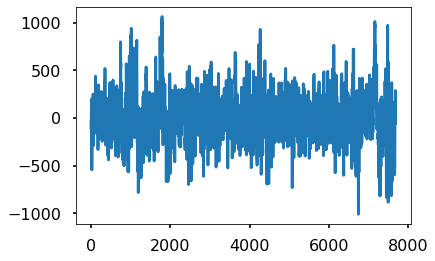

In [ ]:
plt.plot(bsr_patient[0][0])
plt.show()

In [ ]:
len(bsr_healthy), len(bsr_healthy[0]), len(bsr_healthy[0][0])

(39, 16, 7680)

In [ ]:
samp_freq = 128  # Sample frequency (Hz)
notch_freq = 50.0  # Frequency to be removed from signal (Hz)
quality_factor = 20.0  # Quality factor

# Design a notch filter using signal.iirnotch
b_notch, a_notch = signal.iirnotch(notch_freq, quality_factor, samp_freq)

In [ ]:
# Filtering each signal

notched_healthy = [[signal.filtfilt(b_notch, a_notch, y) for y in x] for x in bsr_healthy]
notched_patient = [[signal.filtfilt(b_notch, a_notch, y) for y in x] for x in bsr_patient]

In [ ]:
len(notched_healthy[0]), len(notched_healthy[0][0])

(16, 7680)

In [ ]:
# filter

lowcut = 4
highcut = 45
nyquistFreq = 64
order = 5

low  = lowcut / nyquistFreq
high = highcut / nyquistFreq

sos  = butter(order, [low, high], btype='bandpass', output='sos')

In [ ]:
# Filtering each signal

filtered_healthy = [[sosfilt(sos, y) for y in x] for x in notched_healthy]
filtered_patient = [[sosfilt(sos, y) for y in x] for x in notched_patient]

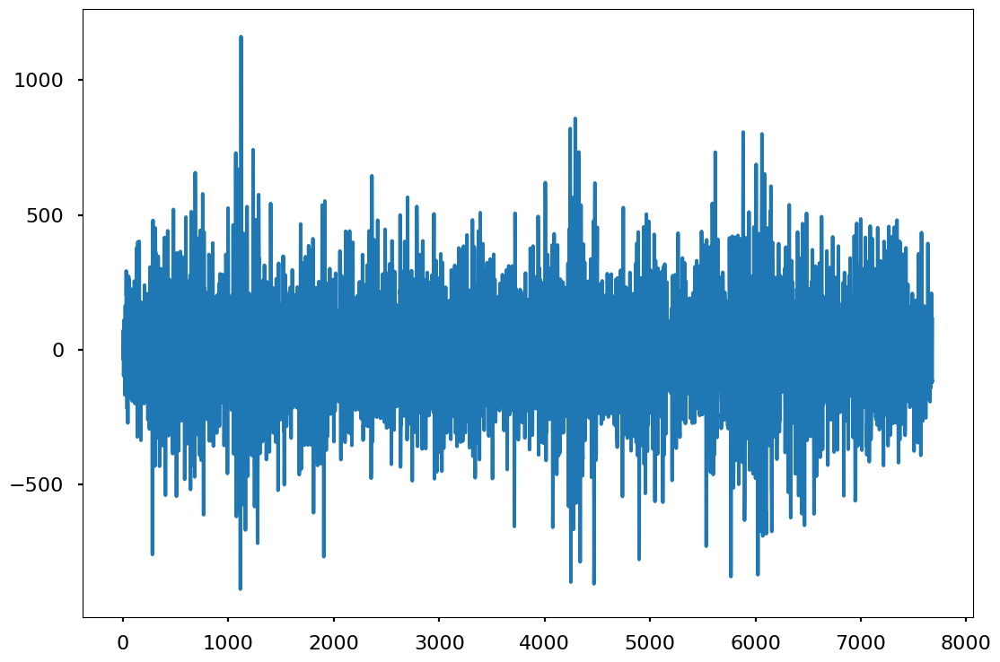

In [ ]:
plt.plot(filtered_healthy[0][0])
plt.show()

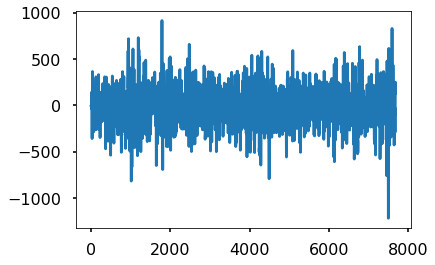

In [ ]:
plt.plot(filtered_patient[0][0])
plt.show()

In [ ]:
len(filtered_healthy[0]), len(filtered_healthy[0][0])

(16, 7680)

In [ ]:
# Splitting each signal

seg_healthy = [np.split(np.array(x), 3, axis=1) for x in filtered_healthy]
seg_patient = [np.split(np.array(x), 3, axis=1) for x in filtered_patient]

In [ ]:
len(seg_healthy), len(seg_healthy[0]), len(seg_healthy[0][0]), len(seg_healthy[0][0][0])

(39, 3, 16, 2560)

In [ ]:
# Converting data to np.array

seg_healthy = [np.array(x).reshape(48, 2560) for x in seg_healthy]
seg_patient = [np.array(x).reshape(48, 2560) for x in seg_patient]

In [ ]:
seg_healthy[0].shape

(48, 2560)

In [ ]:
# L2 normalization
from scipy import stats

# norm_healthy = [np.array([(y-np.min(y))/(np.max(y)-np.min(y)) for y in x]) for x in seg_healthy]
# norm_patient = [np.array([(y-np.min(y))/(np.max(y)-np.min(y)) for y in x]) for x in seg_patient]

norm_healthy = [np.array([stats.zscore(y) for y in x]) for x in seg_healthy]
norm_patient = [np.array([stats.zscore(y) for y in x]) for x in seg_patient]

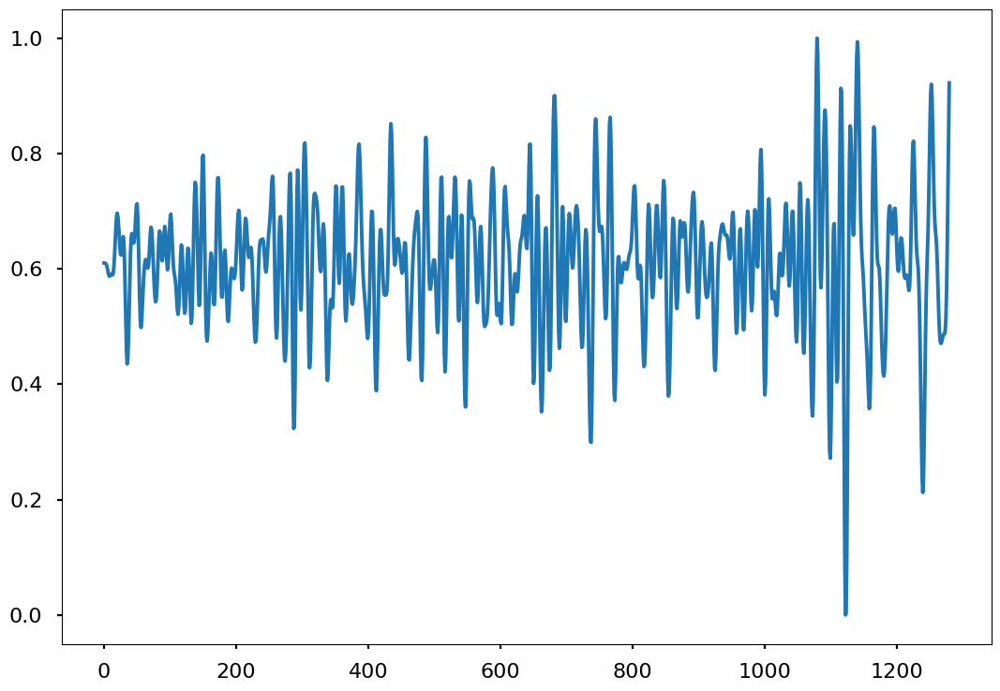

In [ ]:
plt.plot(norm_healthy[0][0])
plt.show()

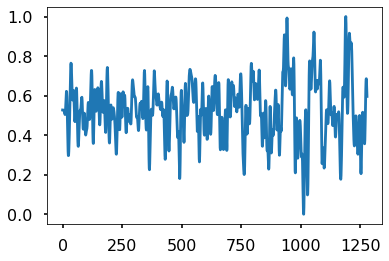

In [ ]:
plt.plot(norm_patient[0][0])
plt.show()

In [ ]:
norm_healthy[0].shape, norm_patient[0].shape

((48, 2560), (48, 2560))

In [ ]:
# Stacking healthy and patient data

healthy_data = np.vstack(norm_healthy)
patient_data = np.vstack(norm_patient)

In [ ]:
healthy_data.shape, patient_data.shape

((1872, 2560), (2160, 2560))

(129, 9)

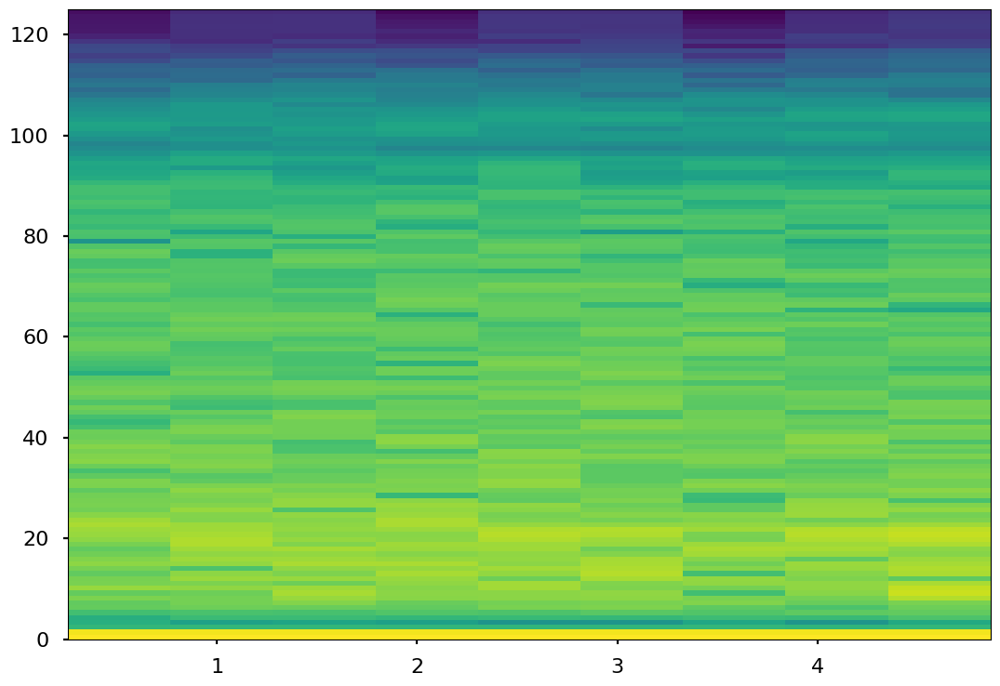

In [ ]:
sxx, _, _, im = plt.specgram(healthy_data[0], Fs=250)
sxx.shape

In [ ]:
# Producing Spectrogram and resizing

spec_data_healthy = []

i = 0
for data in healthy_data:
    fig = Figure()
    fig.set_figheight(1.12)
    fig.set_figwidth(1.12)
    canvas = FigureCanvas(fig)
    ax = fig.gca()
    ax.axis('off')
    ax.margins(0,0)
    _, _, _, _ = ax.specgram(data, Fs=128)
    fig.tight_layout()
    canvas.draw()
    width, height = fig.get_size_inches() * fig.get_dpi()
    image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8').reshape(int(height), int(width), 3)
    spec_data_healthy.append(image)
    i += 1

print(i)

i = 0
spec_data_patient = []
for data in patient_data:
    fig = Figure()
    fig.set_figheight(1.12)
    fig.set_figwidth(1.12)
    canvas = FigureCanvas(fig)
    ax = fig.gca()
    ax.axis('off')
    ax.margins(0,0)
    _, _, _, _ = ax.specgram(data, Fs=128)
    fig.tight_layout()
    canvas.draw()
    width, height = fig.get_size_inches() * fig.get_dpi()
    image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8').reshape(int(height), int(width), 3)
    spec_data_patient.append(image)
    i += 1

print(i)
spec_data_healthy[0].shape, spec_data_patient[0].shape

1872
2160


((112, 112, 3), (112, 112, 3))

In [ ]:
# Producing Scalogram and resizing

# spec_data = []
spec_data_healthy = []
# base_dir = "drive/MyDrive/Ankit/scalogram/"

i = 0
for data in healthy_data:
    mel_spec=librosa.feature.melspectrogram( y=data, sr=128, n_mels=64, n_fft=256, win_length=256, window='hann')
    log_spectrogram = librosa.amplitude_to_db(mel_spec)
    norm=(log_spectrogram-np.min(log_spectrogram))/(np.max(log_spectrogram)-np.min(log_spectrogram))
    img = norm
    img = cv2.resize(img, dsize=(112,112), interpolation=cv2.INTER_CUBIC)
    cmap = plt.get_cmap('jet')
    rgba_img = cmap(img)
    rgb_img = np.delete(rgba_img, 3, 2)
    clip_rgb = np.flip(rgb_img, 0)
    spec_data_healthy.append(clip_rgb)
    i += 1

print(i)

i = 0
spec_data_patient = []
for data in patient_data:
    mel_spec=librosa.feature.melspectrogram( y=data, sr=128, n_mels=64, n_fft=256, win_length=256, window='hann')
    log_spectrogram = librosa.amplitude_to_db(mel_spec)
    norm=(log_spectrogram-np.min(log_spectrogram))/(np.max(log_spectrogram)-np.min(log_spectrogram))
    img = norm
    img = cv2.resize(img, dsize=(112,112), interpolation=cv2.INTER_CUBIC)
    cmap = plt.get_cmap('jet')
    rgba_img = cmap(img)
    rgb_img = np.delete(rgba_img, 3, 2)
    clip_rgb = np.flip(rgb_img, 0)
    spec_data_patient.append(clip_rgb)
    i += 1

print(i)
# spec_data[0].shape
spec_data_healthy[0].shape, spec_data_patient[0].shape

1872
2160


((112, 112, 3), (112, 112, 3))

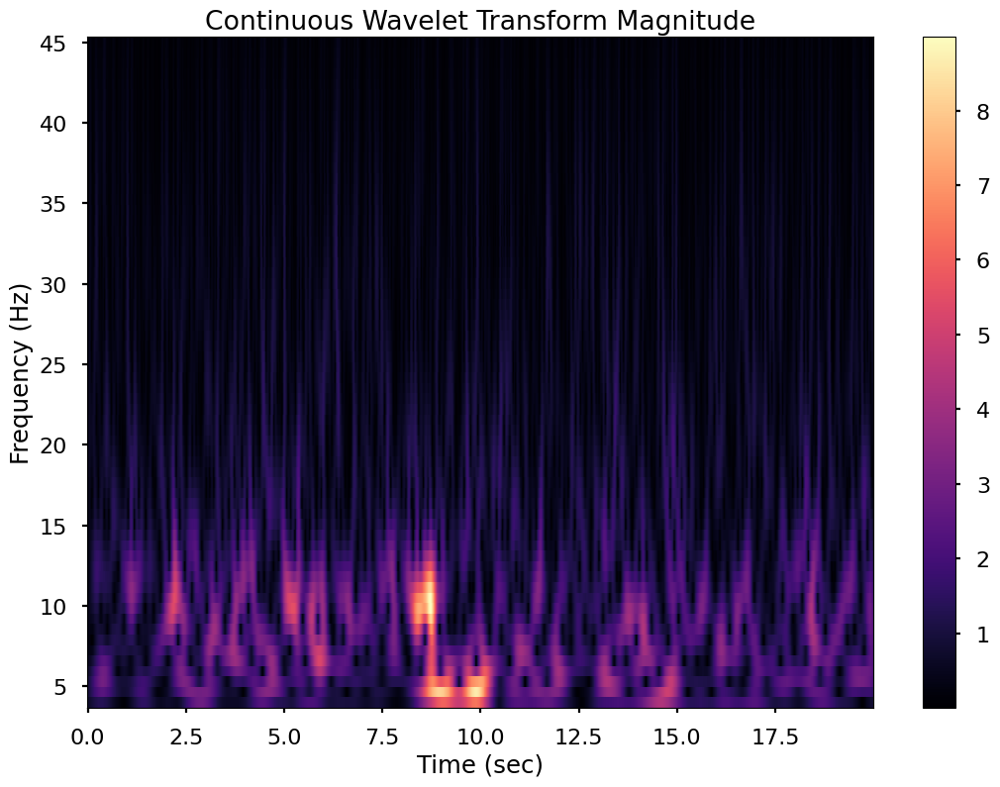

In [ ]:
f, t, cwtm = nk.signal_timefrequency(healthy_data[0],
                                     128,
                                     min_frequency=4,
                                     max_frequency=45,
                                     method="cwt",
                                     show=True)

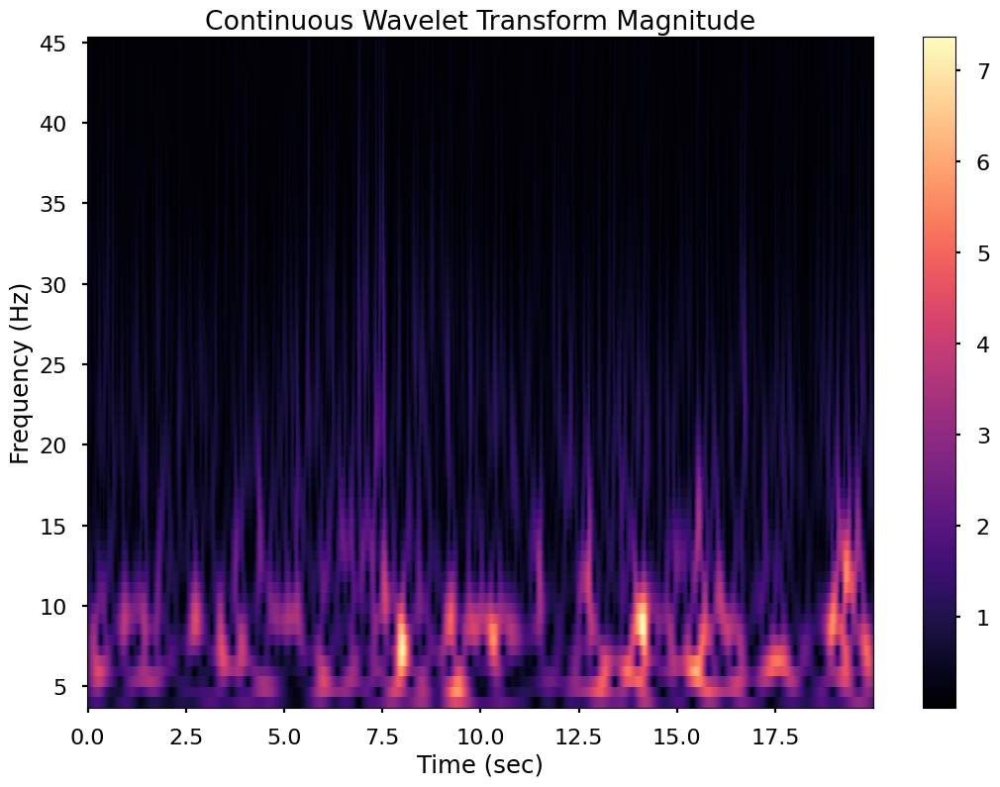

In [ ]:
f, t, cwtm = nk.signal_timefrequency(patient_data[0],
                                     128,
                                     min_frequency=4,
                                     max_frequency=45,
                                     method="cwt",
                                     show=True)

In [ ]:
# Producing Scalogram and resizing

# spec_data = []
spec_data_healthy = []
# base_dir = "drive/MyDrive/Ankit/scalogram/"

i = 0
for data in healthy_data:
    _, _, cwt = nk.signal_timefrequency(data, 128, min_frequency=4, max_frequency=45, method="cwt", show=False)
    log_cwt = librosa.amplitude_to_db(cwt)
    norm = (log_cwt-np.min(log_cwt))/(np.max(log_cwt)-np.min(log_cwt))
    img = norm
    img = cv2.resize(img, dsize=(112,112), interpolation=cv2.INTER_CUBIC)
    cmap = plt.get_cmap('jet')
    rgba_img = cmap(img)
    rgb_img = np.delete(rgba_img, 3, 2)
    clip_rgb = np.flip(rgb_img, 0)
    spec_data_healthy.append(clip_rgb)
    i += 1

print(i)

i = 0
spec_data_patient = []
for data in patient_data:
    _, _, cwt = nk.signal_timefrequency(data, 128, min_frequency=4, max_frequency=45, method="cwt", show=False)
    log_cwt = librosa.amplitude_to_db(cwt)
    norm = (log_cwt-np.min(log_cwt))/(np.max(log_cwt)-np.min(log_cwt))
    img = norm
    img = cv2.resize(img, dsize=(112,112), interpolation=cv2.INTER_CUBIC)
    cmap = plt.get_cmap('jet')
    rgba_img = cmap(img)
    rgb_img = np.delete(rgba_img, 3, 2)
    clip_rgb = np.flip(rgb_img, 0)
    spec_data_patient.append(clip_rgb)
    i += 1

print(i)
# spec_data[0].shape
spec_data_healthy[0].shape, spec_data_patient[0].shape

1872
2160


((112, 112, 3), (112, 112, 3))

In [ ]:
!pip install neurokit2
import neurokit2 as nk
import librosa

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 57.4 MB/s eta 0:00:00


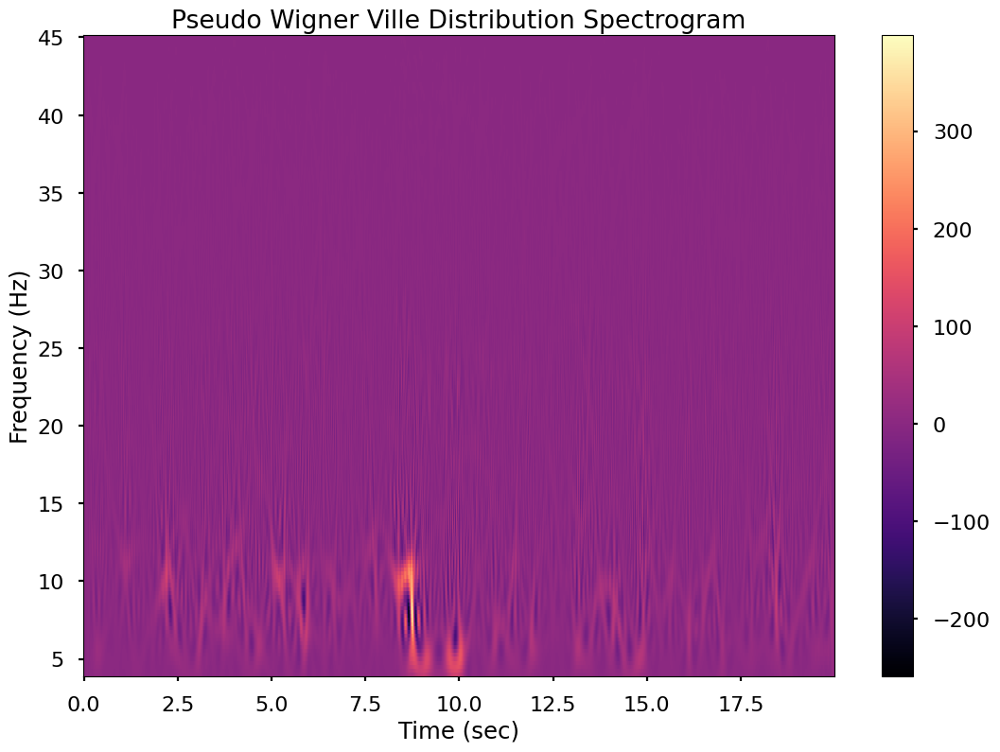

In [ ]:

f, t, pwvd = nk.signal_timefrequency(healthy_data[0],
                                     128,
                                     min_frequency=4,
                                     max_frequency=45,
                                     method="pwvd",
                                     show=True)
# plt.pcolormesh(t, f, pwvd, shading='gouraud')
# plt.imshow(pwvd, aspect='auto')
# plt.show()
# fig.tight_layout()
# canvas.draw()
# width, height = fig.get_size_inches() * fig.get_dpi()
# image = np.frombuffer(canvas.tostring_rgb(), dtype='uint8').reshape(int(height), int(width), 3)
# plt.close(fig)

# image.shape

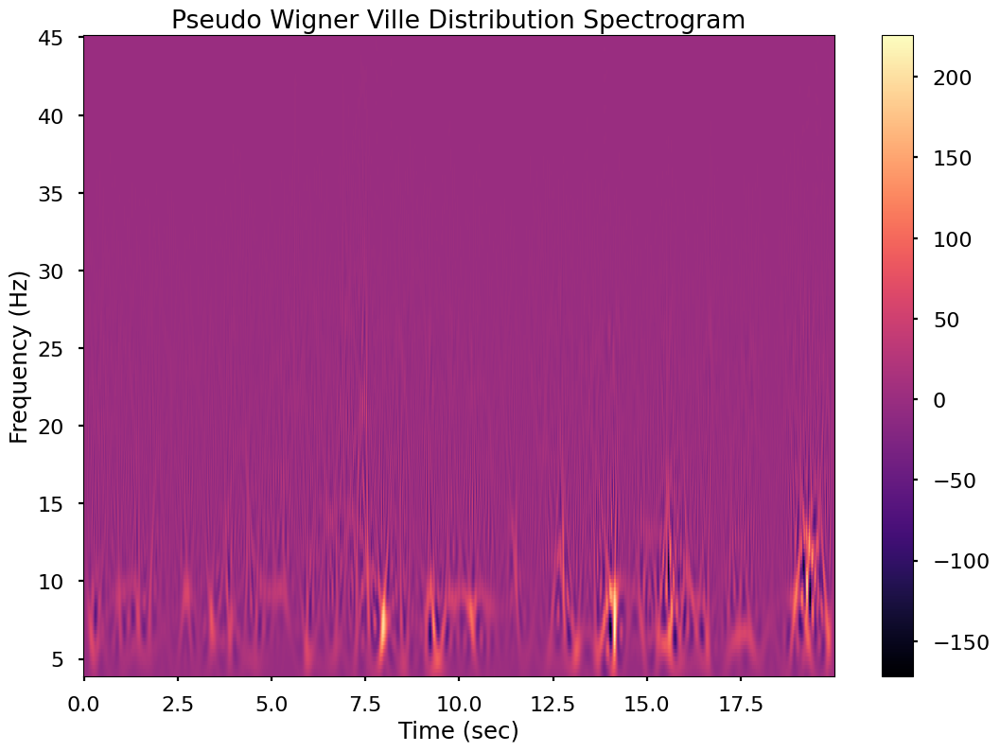

In [ ]:
f, t, pwvd = nk.signal_timefrequency(patient_data[0],
                                     128,
                                     min_frequency=4,
                                     max_frequency=45,
                                     method="pwvd",
                                     show=True)

In [ ]:
# Producing SPWVD and resizing

# spec_data = []
spec_data_healthy = []
# base_dir = "drive/MyDrive/Ankit/scalogram/"

i = 0
for data in healthy_data:
    _, _, pwvd = nk.signal_timefrequency(data, 128, min_frequency=4, max_frequency=45, method="pwvd", show=False)
    log_pwvd = librosa.amplitude_to_db(pwvd)
    norm = (log_pwvd-np.min(log_pwvd))/(np.max(log_pwvd)-np.min(log_pwvd))
    img = norm
    img = cv2.resize(img, dsize=(112,112), interpolation=cv2.INTER_CUBIC)
    cmap = plt.get_cmap('jet')
    rgba_img = cmap(img)
    rgb_img = np.delete(rgba_img, 3, 2)
    clip_rgb = np.flip(rgb_img, 0)
    spec_data_healthy.append(clip_rgb)
    i += 1

print(i)

i = 0
spec_data_patient = []
for data in patient_data:
    _, _, pwvd = nk.signal_timefrequency(data, 128, min_frequency=4, max_frequency=45, method="pwvd", show=False)
    log_pwvd = librosa.amplitude_to_db(pwvd)
    norm = (log_pwvd-np.min(log_pwvd))/(np.max(log_pwvd)-np.min(log_pwvd))
    img = norm
    img = cv2.resize(img, dsize=(112,112), interpolation=cv2.INTER_CUBIC)
    cmap = plt.get_cmap('jet')
    rgba_img = cmap(img)
    rgb_img = np.delete(rgba_img, 3, 2)
    clip_rgb = np.flip(rgb_img, 0)
    spec_data_patient.append(clip_rgb)
    i += 1

print(i)
# spec_data[0].shape
spec_data_healthy[0].shape, spec_data_patient[0].shape

1872
2160


((112, 112, 3), (112, 112, 3))

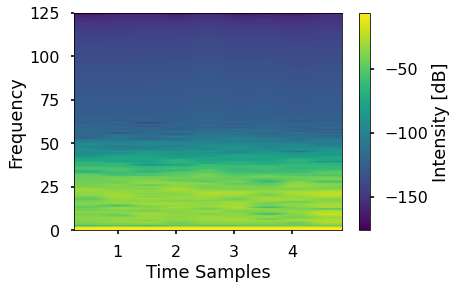

In [ ]:
Pxx, f, t, im = plt.specgram(healthy_data[0], Fs=250)
plt.colorbar(im).set_label('Intensity [dB]')
plt.xlabel("Time Samples")
plt.ylabel("Frequency")
plt.show()

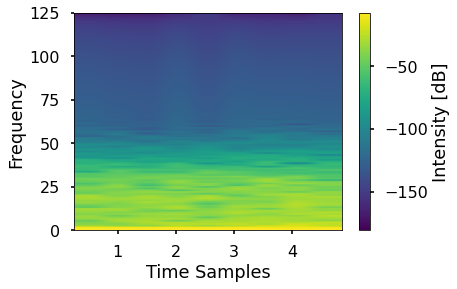

In [ ]:
Pxx, f, t, im = plt.specgram(patient_data[0], Fs=250)
plt.colorbar(im).set_label('Intensity [dB]')
plt.xlabel("Time Samples")
plt.ylabel("Frequency")
plt.show()

In [ ]:
nspec_data_healthy_array = np.array(spec_data_healthy)
nspec_data_patient_array = np.array(spec_data_patient)
nspec_data_healthy_array.shape, nspec_data_patient_array.shape

((1872, 112, 112, 3), (2160, 112, 112, 3))

In [ ]:
nsize = (112, 112)
nspec_data_healthy = []

for data in spec_data_healthy:
    S_im = Image.fromarray(data)
    S_res = S_im.resize(nsize)
    S_np = np.array(S_res)
    nspec_data_healthy.append(S_np)

nspec_data_patient = []

for data in spec_data_patient:
    S_im = Image.fromarray(data)
    S_res = S_im.resize(nsize)
    S_np = np.array(S_res)
    nspec_data_patient.append(S_np)

In [ ]:
nspec_data_healthy_array = np.array(nspec_data_healthy)
nspec_data_patient_array = np.array(nspec_data_patient)
nspec_data_healthy_array.shape, nspec_data_patient_array.shape

((1872, 112, 112, 3), (2160, 112, 112, 3))

In [ ]:
nspec_data_array = np.concatenate((nspec_data_healthy_array, nspec_data_patient_array))
nspec_data_array.shape

(4032, 112, 112, 3)

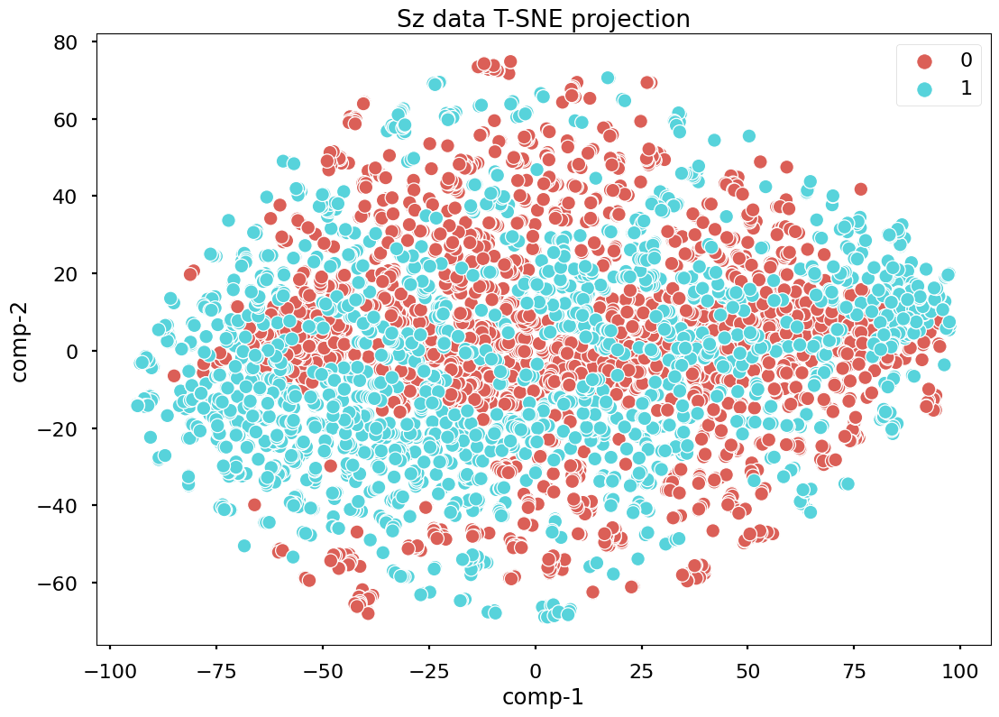

In [ ]:
# SPWVD

tsne = TSNE(n_components=2)

if len(nspec_data_array.shape)==4:
    z = tsne.fit_transform(nspec_data_array.reshape(nspec_data_array.shape[0], nspec_data_array.shape[1]*nspec_data_array.shape[2]*nspec_data_array.shape[3]))
elif len(nspec_data_array.shape)==3:
    z = tsne.fit_transform(nspec_data_array.reshape(nspec_data_array.shape[0], nspec_data_array.shape[1]*nspec_data_array.shape[2]))
else:
    z = tsne.fit_transform(nspec_data_array.reshape(nspec_data_array.shape[0], nspec_data_array.shape[1]))
df = pd.DataFrame()
df["y"] = labels_array
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
        palette=sns.color_palette("hls", 2),
        data=df).set(title="Sz data T-SNE projection")
plt.show()

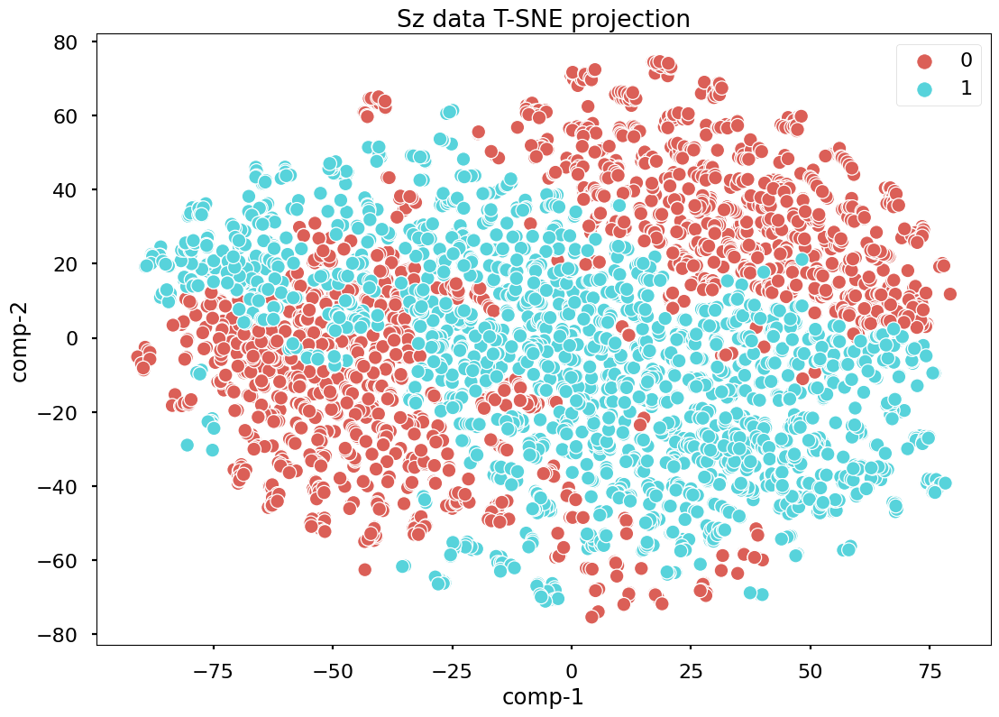

In [ ]:
# Scalogran

tsne = TSNE(n_components=2)

if len(nspec_data_array.shape)==4:
    z = tsne.fit_transform(nspec_data_array.reshape(nspec_data_array.shape[0], nspec_data_array.shape[1]*nspec_data_array.shape[2]*nspec_data_array.shape[3]))
elif len(nspec_data_array.shape)==3:
    z = tsne.fit_transform(nspec_data_array.reshape(nspec_data_array.shape[0], nspec_data_array.shape[1]*nspec_data_array.shape[2]))
else:
    z = tsne.fit_transform(nspec_data_array.reshape(nspec_data_array.shape[0], nspec_data_array.shape[1]))
df = pd.DataFrame()
df["y"] = labels_array
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
        palette=sns.color_palette("hls", 2),
        data=df).set(title="Sz data T-SNE projection")
plt.show()

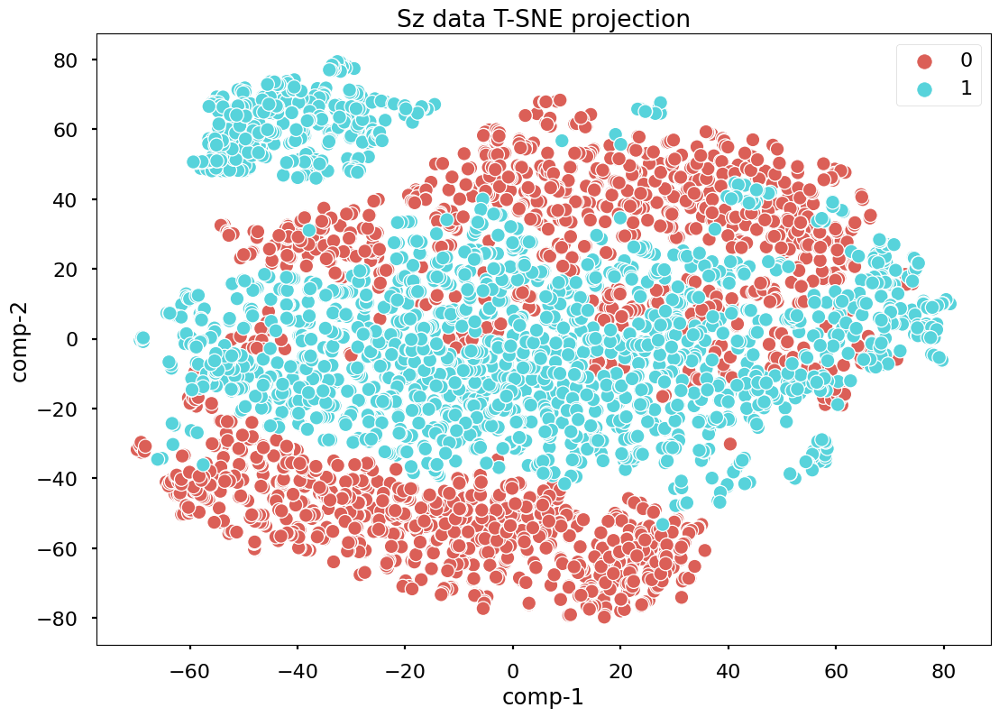

In [ ]:
# Spectrograms

tsne = TSNE(n_components=2)

if len(nspec_data_array.shape)==4:
    z = tsne.fit_transform(nspec_data_array.reshape(nspec_data_array.shape[0], nspec_data_array.shape[1]*nspec_data_array.shape[2]*nspec_data_array.shape[3]))
elif len(nspec_data_array.shape)==3:
    z = tsne.fit_transform(nspec_data_array.reshape(nspec_data_array.shape[0], nspec_data_array.shape[1]*nspec_data_array.shape[2]))
else:
    z = tsne.fit_transform(nspec_data_array.reshape(nspec_data_array.shape[0], nspec_data_array.shape[1]))
df = pd.DataFrame()
df["y"] = labels_array
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]

sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
        palette=sns.color_palette("hls", 2),
        data=df).set(title="Sz data T-SNE projection")
plt.show()

In [ ]:
# labels

labels_healthy_array = np.array(int(nspec_data_healthy_array.shape[0])*[0])
labels_patient_array = np.array(int(nspec_data_patient_array.shape[0])*[1])

labels_array = np.concatenate((labels_healthy_array, labels_patient_array))

labels_healthy_array.shape, labels_patient_array.shape

((1872,), (2160,))

In [ ]:
# Train, Validation, Test split (60, 20, 20)

X_healthy_train, X_healthy_test, y_healthy_train, y_healthy_test = train_test_split(nspec_data_healthy_array, labels_healthy_array, test_size=0.2, random_state=1)
X_healthy_train, X_healthy_val, y_healthy_train, y_healthy_val = train_test_split(X_healthy_train, y_healthy_train, test_size=0.25, random_state=1)

X_patient_train, X_patient_test, y_patient_train, y_patient_test = train_test_split(nspec_data_patient_array, labels_patient_array, test_size=0.2, random_state=1)
X_patient_train, X_patient_val, y_patient_train, y_patient_val = train_test_split(X_patient_train, y_patient_train, test_size=0.25, random_state=1)

In [ ]:
X_healthy_train.shape, X_healthy_val.shape, X_healthy_test.shape

((1122, 112, 112, 3), (375, 112, 112, 3), (375, 112, 112, 3))

In [ ]:
X_patient_train.shape, X_patient_val.shape, X_patient_test.shape

((1296, 112, 112, 3), (432, 112, 112, 3), (432, 112, 112, 3))

In [ ]:
# Concatenate healthy and patient data

X_train = np.concatenate((X_healthy_train, X_patient_train))
X_val = np.concatenate((X_healthy_val, X_patient_val))
X_test = np.concatenate((X_healthy_test, X_patient_test))

y_train = np.concatenate((y_healthy_train, y_patient_train))
y_val = np.concatenate((y_healthy_val, y_patient_val))
y_test = np.concatenate((y_healthy_test, y_patient_test))

X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((2418, 112, 112, 3),
 (807, 112, 112, 3),
 (807, 112, 112, 3),
 (2418,),
 (807,),
 (807,))

In [ ]:
# Shuffle

X_train_shuffled, y_train_shuffled = shuffle(X_train, y_train)
X_val_shuffled, y_val_shuffled = shuffle(X_val, y_val)
X_test_shuffled, y_test_shuffled = shuffle(X_test, y_test)

In [ ]:
# VGG16

def Vgg16_model(input_shape):
    # model = Sequential()
    # # model.add(MobileNetV3Small(include_top=False,
    # #                     pooling='max',
    # #                     input_shape=input_shape))
    # model.add(TimeDistributed(Conv2D(8, kernel_size=(3, 3), activation='relu', padding="same", input_shape=input_shape)))
    # model.add(TimeDistributed(MaxPool2D(pool_size=(2, 2))))
    # model.add(TimeDistributed(Conv2D(8, kernel_size=(3, 3), activation='relu', padding="same")))
    # model.add(TimeDistributed(MaxPool2D(pool_size=(2, 2))))
    # model.add(TimeDistributed(Conv2D(8, kernel_size=(3, 3), activation='relu', padding="same")))
    # model.add(TimeDistributed(Flatten()))
    # model.add(LSTM(8, activation='relu'))
    # model.add(Dense(128, activation='relu'))
    # model.add(Dense(32, activation='relu'))
    # model.add(Dense(1, activation='sigmoid'))

    # model = Sequential()
    # model.add(Conv2D(input_shape=input_shape,filters=64,kernel_size=(3,3),padding="same", activation="relu"))
    # model.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu"))
    # model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # # model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # model.add(Flatten())
    # model.add(Dense(units=1024,activation="relu"))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=256,activation="relu"))
    # model.add(Dropout(0.5))
    # model.add(Dense(units=1, activation="sigmoid"))

    inputs = Input(shape=input_shape)
    x = Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu")(inputs)
    x = Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu")(x)
    x = MaxPool2D(pool_size=(2,2),strides=(2,2))(x)
    x = Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu")(x)
    x = Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu")(x)
    x = MaxPool2D(pool_size=(2,2),strides=(2,2))(x)
    x = Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu")(x)
    x = Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu")(x)
    x = MaxPool2D(pool_size=(2,2),strides=(2,2))(x)
    x = Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu")(x)
    x = Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu")(x)
    x = MaxPool2D(pool_size=(2,2),strides=(2,2))(x)
    x = Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu")(x)
    x = Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu")(x)
    mid = MaxPool2D(pool_size=(2,2),strides=(2,2))(x)
    x = Flatten()(mid)
    x = Dense(units=1024,activation="relu")(x)
    x = Dropout(0.5)(x)
    x = Dense(units=256,activation="relu")(x)
    x = Dropout(0.5)(x)
    outputs = Dense(units=1,activation="sigmoid")(x)

    model = Model(inputs=inputs, outputs=outputs)
    tmod = Model(inputs=inputs, outputs=mid)

    return model, tmod

model = Vgg16_model((112, 112, 3))
tmod = model[1]
model = model[0]
model.summary(), tmod.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 112, 112, 3)]     0         
                                                                 
 conv2d_30 (Conv2D)          (None, 112, 112, 64)      1792      
                                                                 
 conv2d_31 (Conv2D)          (None, 112, 112, 64)      36928     
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 56, 56, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_32 (Conv2D)          (None, 56, 56, 128)       73856     
                                                                 
 conv2d_33 (Conv2D)          (None, 56, 56, 128)       147584    
                                                             

(None, None)

In [ ]:
def CNN2D(input_shape):
    model = Sequential()
    model.add(Conv2D(input_shape=input_shape,filters=4,kernel_size=(3,3),padding="same", activation="relu"))
    # model.add(Conv2D(filters=64,kernel_size=(3,3),padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # model.add(BatchNormalization())

    # model.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=8, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # model.add(BatchNormalization())

    # model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=256, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # model.add(BatchNormalization())

    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", activation="relu"))
    model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # model.add(BatchNormalization())

    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(Conv2D(filters=512, kernel_size=(3,3), padding="same", activation="relu"))
    # model.add(MaxPool2D(pool_size=(2,2),strides=(2,2)))
    # model.add(BatchNormalization())

    model.add(Flatten())
    # model.add(Dense(units=512,activation="relu"))
    # model.add(Dropout(0.5))
    model.add(Dense(units=64,activation="relu"))
    model.add(Dropout(0.5))
    model.add(Dense(units=1, activation="sigmoid"))

    return model

model = CNN2D((112, 112, 3))
model.summary()

Model: "sequential_74"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_351 (Conv2D)         (None, 112, 112, 4)       112       
                                                                 
 max_pooling2d_253 (MaxPooli  (None, 56, 56, 4)        0         
 ng2D)                                                           
                                                                 
 conv2d_352 (Conv2D)         (None, 56, 56, 8)         296       
                                                                 
 max_pooling2d_254 (MaxPooli  (None, 28, 28, 8)        0         
 ng2D)                                                           
                                                                 
 conv2d_353 (Conv2D)         (None, 28, 28, 16)        1168      
                                                                 
 max_pooling2d_255 (MaxPooli  (None, 14, 14, 16)     

In [ ]:
from keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def specificity(y_true, y_pred):
    neg_y_true = 1 - y_true
    neg_y_pred = 1 - y_pred
    fp = K.sum(neg_y_true * y_pred)
    tn = K.sum(neg_y_true * neg_y_pred)
    specificity = tn / (tn + fp + K.epsilon())
    return specificity

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [ ]:
import itertools
from sklearn.metrics import confusion_matrix

Epoch 1/50
19/19 [==============================] - 12s 390ms/step - loss: 0.8336 - binary_accuracy: 0.5033 - precision_6: 0.5342 - recall_6: 0.5725 - specificity: 0.4698 - f1_m: 0.5177 - val_loss: 0.6919 - val_binary_accuracy: 0.5366 - val_precision_6: 0.9833 - val_recall_6: 0.1366 - val_specificity: 0.5041 - val_f1_m: 0.2362
Epoch 2/50
19/19 [==============================] - 7s 361ms/step - loss: 0.6954 - binary_accuracy: 0.5128 - precision_6: 0.5306 - recall_6: 0.7886 - specificity: 0.4685 - f1_m: 0.6316 - val_loss: 0.6885 - val_binary_accuracy: 0.5353 - val_precision_6: 0.5353 - val_recall_6: 1.0000 - val_specificity: 0.4589 - val_f1_m: 0.6995
Epoch 3/50
19/19 [==============================] - 7s 365ms/step - loss: 0.6905 - binary_accuracy: 0.5397 - precision_6: 0.5430 - recall_6: 0.8920 - specificity: 0.4618 - f1_m: 0.6739 - val_loss: 0.6871 - val_binary_accuracy: 0.5353 - val_precision_6: 0.5353 - val_recall_6: 1.0000 - val_specificity: 0.4788 - val_f1_m: 0.6995
Epoch 4/50
19/1

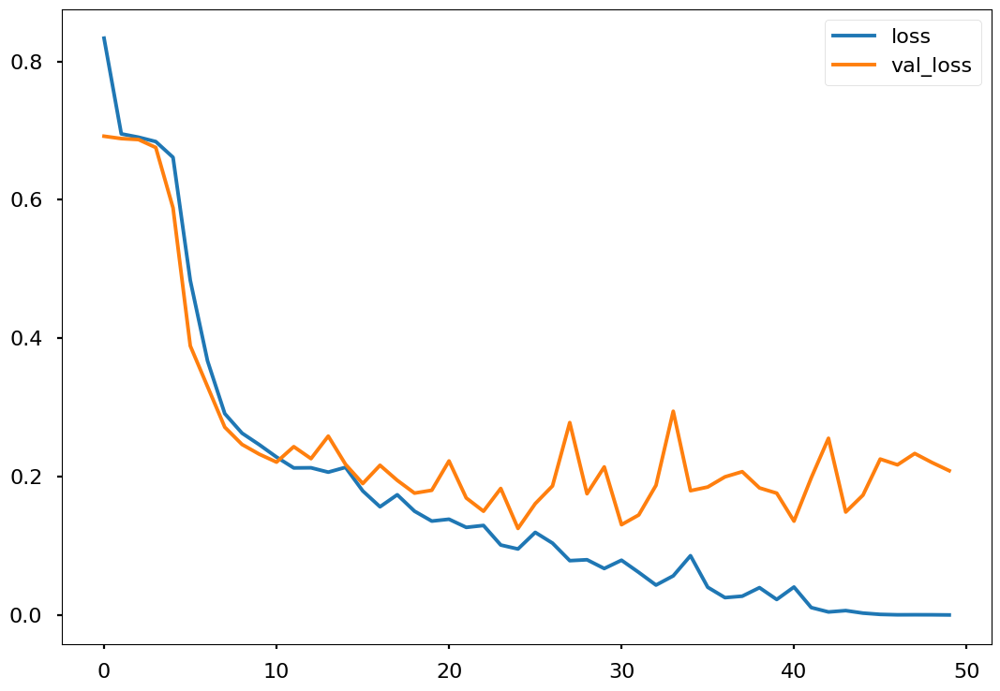

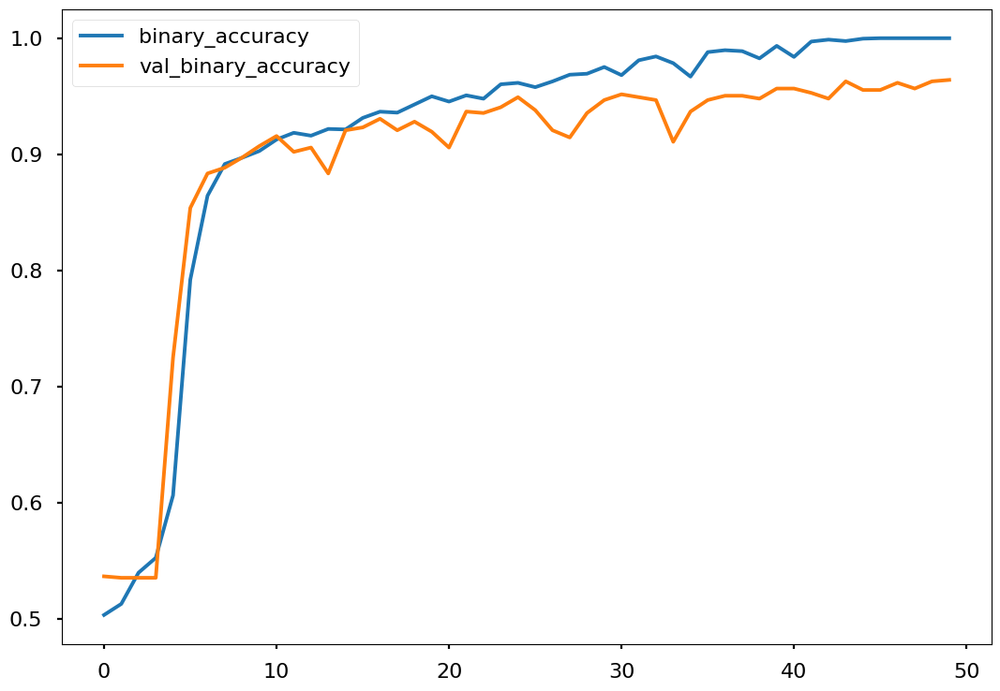

26/26 [==============================] - 1s 25ms/step


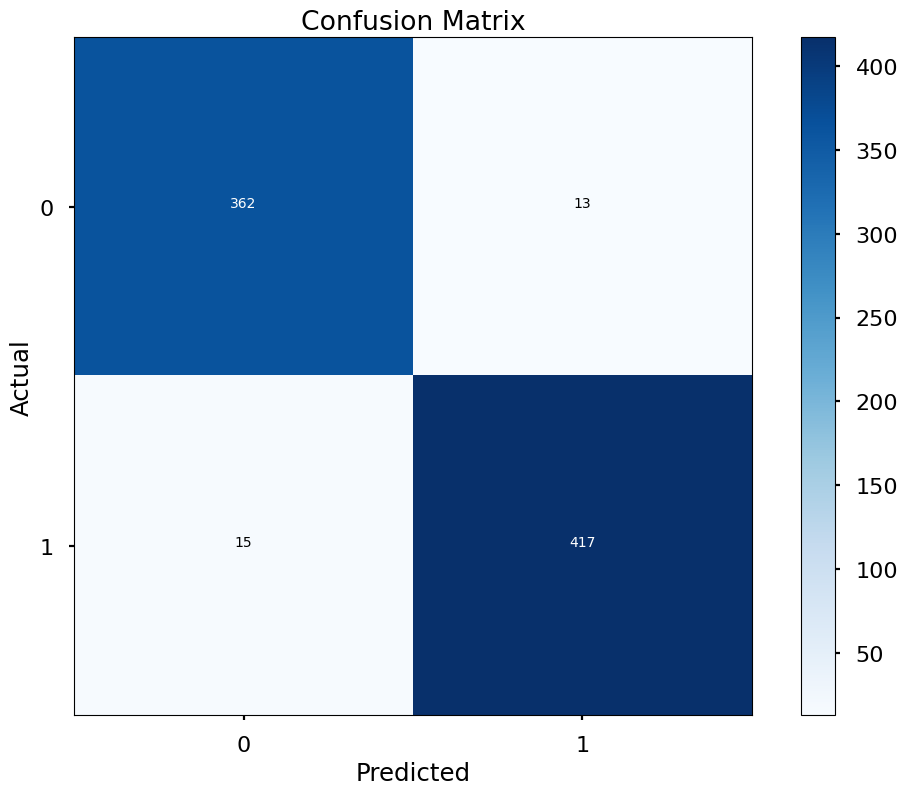

In [ ]:
# Spectrogram

optimizer1 = Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.0001)
optimizer3 = SGD(learning_rate=0.0001)
optimizer4 = Adafactor(learning_rate=0.0001)
optimizer5 = AdamW(learning_rate=0.0001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m, precision_m, recall_m])

early_stopping = EarlyStopping(
    monitor='val_binary_accuracy',
    min_delta = 0.001, # minimium amount of change to count as an improvement
    patience = 30, # how many epochs to wait before stopping
    restore_best_weights = True,
)

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 50,
    batch_size = 128,
    validation_data = (X_val_shuffled, y_val_shuffled),
    callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

y_pred = model.predict(X_test_shuffled)
y_test = y_test_shuffled.astype(int).tolist()
y_pred = np.round(y_pred).tolist()

cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_test))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cm.max() / 2.
for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
    plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
plt.show();

Epoch 1/50
19/19 [==============================] - 13s 393ms/step - loss: 0.6905 - binary_accuracy: 0.5339 - precision_32: 0.5360 - recall_32: 0.9707 - specificity: 0.4622 - f1_m: 0.6877 - val_loss: 0.6919 - val_binary_accuracy: 0.5353 - val_precision_32: 0.5353 - val_recall_32: 1.0000 - val_specificity: 0.4939 - val_f1_m: 0.6991
Epoch 2/50
19/19 [==============================] - 7s 354ms/step - loss: 0.6916 - binary_accuracy: 0.5310 - precision_32: 0.5376 - recall_32: 0.8935 - specificity: 0.4872 - f1_m: 0.6684 - val_loss: 0.6881 - val_binary_accuracy: 0.5353 - val_precision_32: 0.5353 - val_recall_32: 1.0000 - val_specificity: 0.4629 - val_f1_m: 0.6991
Epoch 3/50
19/19 [==============================] - 7s 358ms/step - loss: 0.6850 - binary_accuracy: 0.5368 - precision_32: 0.5365 - recall_32: 0.9977 - specificity: 0.4614 - f1_m: 0.6969 - val_loss: 0.6631 - val_binary_accuracy: 0.5353 - val_precision_32: 0.5353 - val_recall_32: 1.0000 - val_specificity: 0.4403 - val_f1_m: 0.6991
Epo

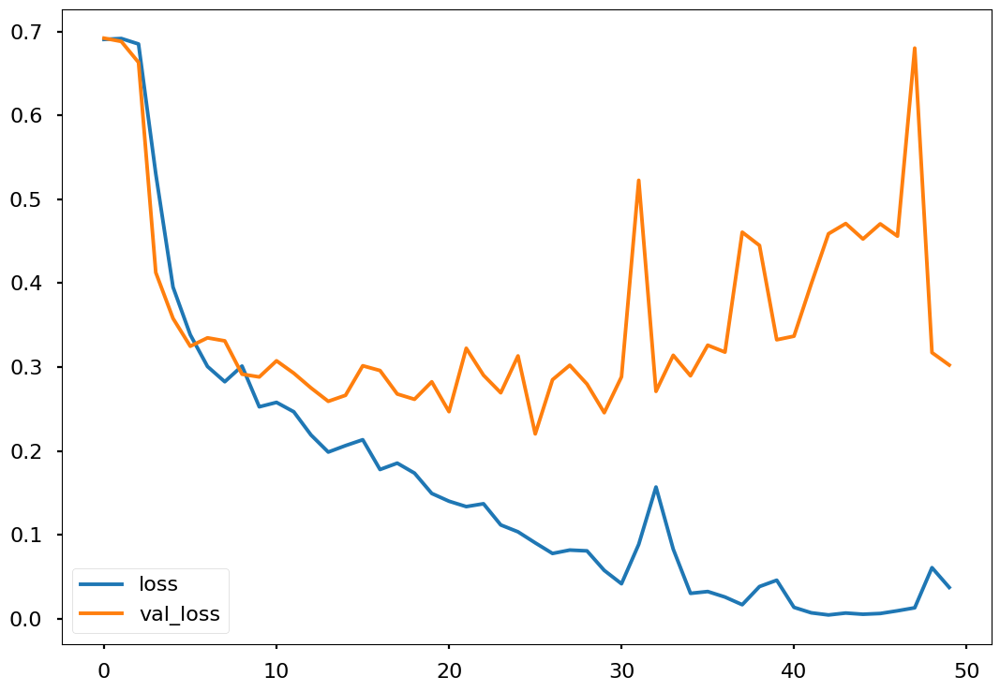

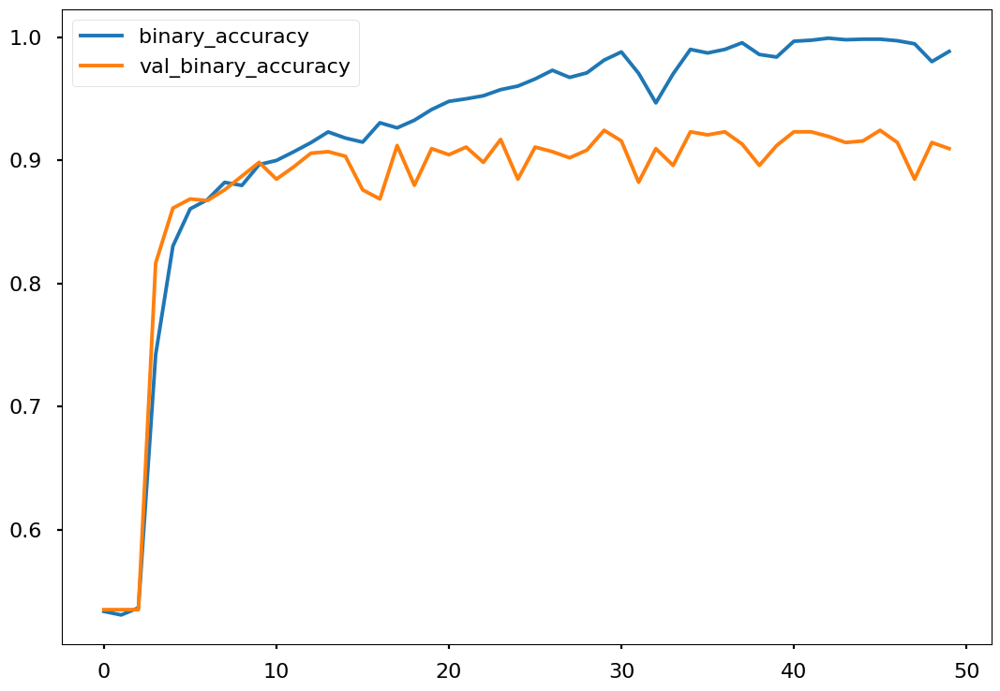

26/26 [==============================] - 1s 26ms/step


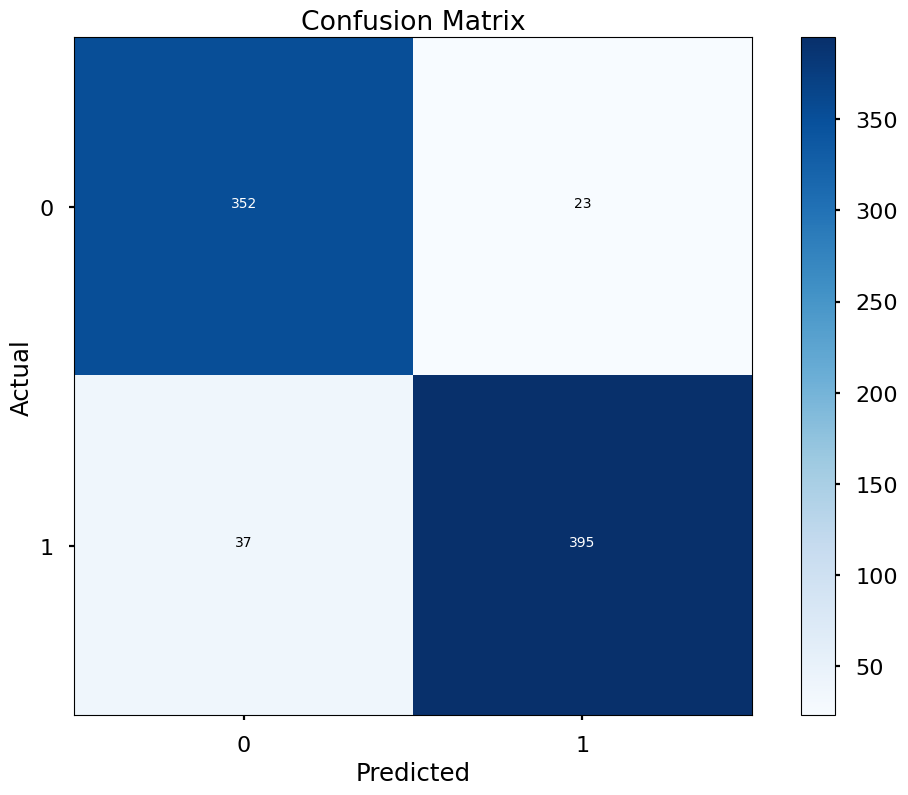

In [ ]:
# mel Spectrogram

optimizer1 = Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.0001)
optimizer3 = SGD(learning_rate=0.0001)
optimizer4 = Adafactor(learning_rate=0.0001)
optimizer5 = AdamW(learning_rate=0.0001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

early_stopping = EarlyStopping(
    monitor='val_binary_accuracy',
    min_delta = 0.001, # minimium amount of change to count as an improvement
    patience = 30, # how many epochs to wait before stopping
    restore_best_weights = True,
)

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 50,
    batch_size = 128,
    validation_data = (X_val_shuffled, y_val_shuffled),
    callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

y_pred = model.predict(X_test_shuffled)
y_test = y_test_shuffled.astype(int).tolist()
y_pred = np.round(y_pred).tolist()

cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_test))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cm.max() / 2.
for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
    plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
plt.show();

Epoch 1/50
19/19 [==============================] - 12s 406ms/step - loss: 0.6905 - binary_accuracy: 0.5182 - precision_13: 0.5341 - recall_13: 0.7917 - specificity: 0.4723 - f1_m: 0.5994 - val_loss: 0.6907 - val_binary_accuracy: 0.5353 - val_precision_13: 0.5353 - val_recall_13: 1.0000 - val_specificity: 0.4732 - val_f1_m: 0.6817
Epoch 2/50
19/19 [==============================] - 7s 372ms/step - loss: 0.6935 - binary_accuracy: 0.5368 - precision_13: 0.5391 - recall_13: 0.9367 - specificity: 0.4705 - f1_m: 0.6834 - val_loss: 0.6925 - val_binary_accuracy: 0.5353 - val_precision_13: 0.5353 - val_recall_13: 1.0000 - val_specificity: 0.4957 - val_f1_m: 0.6817
Epoch 3/50
19/19 [==============================] - 7s 375ms/step - loss: 0.6927 - binary_accuracy: 0.5318 - precision_13: 0.5345 - recall_13: 0.9799 - specificity: 0.4864 - f1_m: 0.6899 - val_loss: 0.6913 - val_binary_accuracy: 0.5353 - val_precision_13: 0.5353 - val_recall_13: 1.0000 - val_specificity: 0.4863 - val_f1_m: 0.6817
Epo

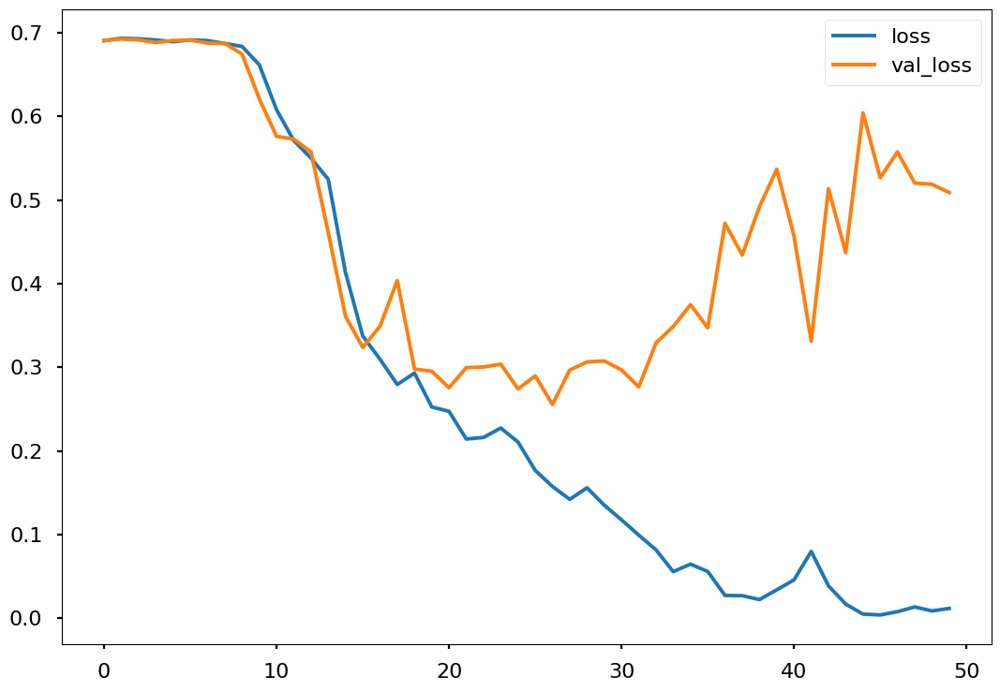

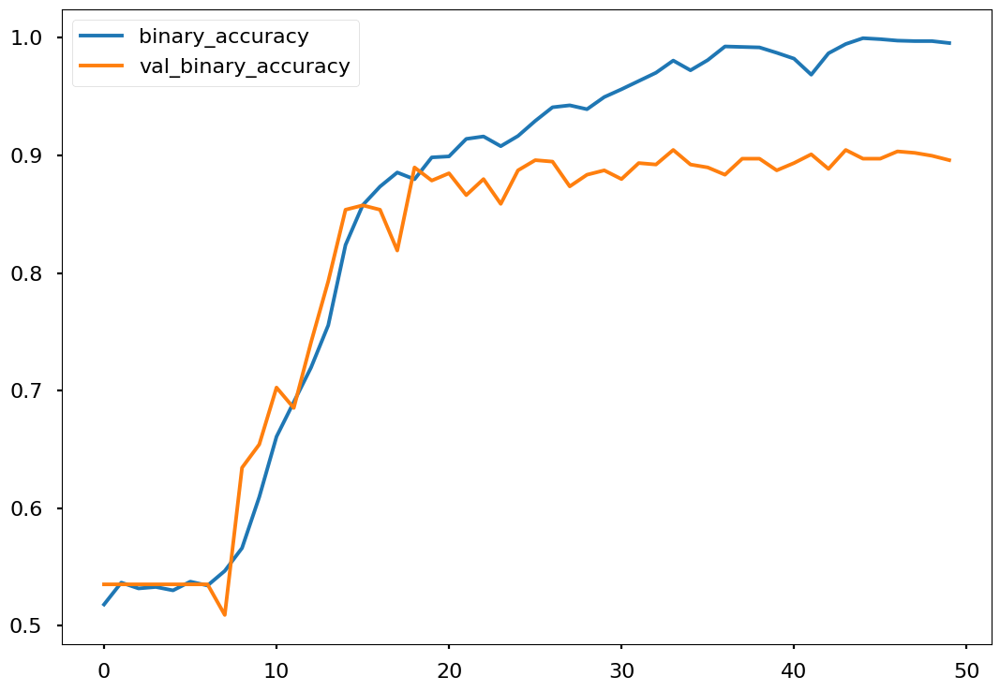

26/26 [==============================] - 1s 26ms/step


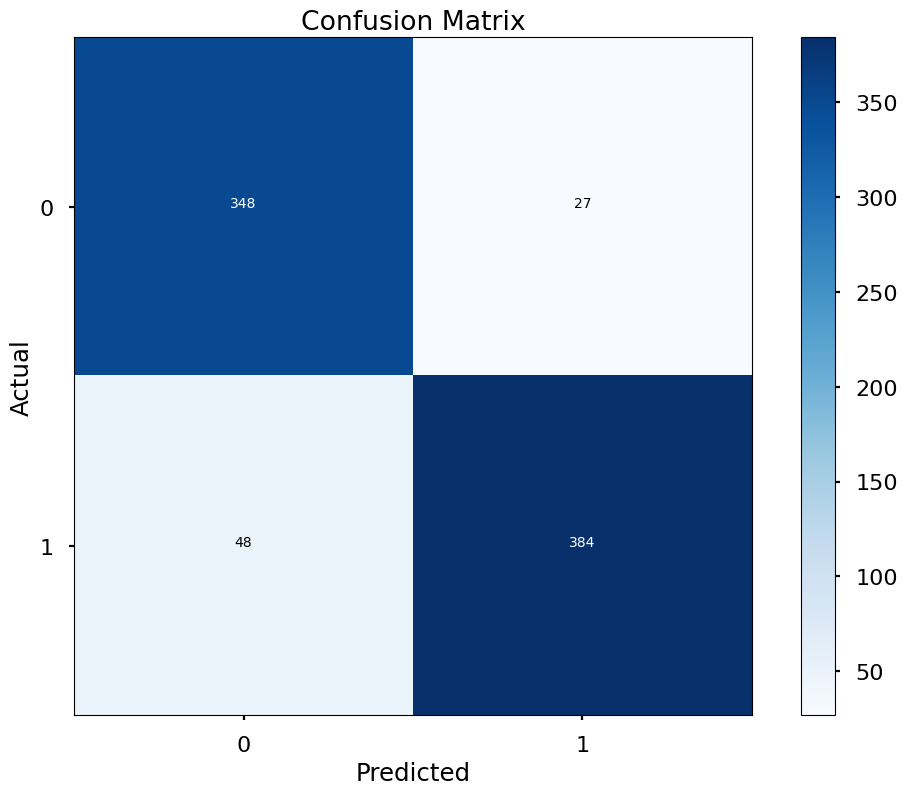

In [ ]:
# SPWVD

optimizer1 = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.0001)
optimizer3 = SGD(learning_rate=0.0001)
optimizer4 = Adafactor(learning_rate=0.0001)
optimizer5 = AdamW(learning_rate=0.0001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

early_stopping = EarlyStopping(
    monitor='val_binary_accuracy',
    min_delta = 0.001, # minimium amount of change to count as an improvement
    mode = 'max',
    patience = 30, # how many epochs to wait before stopping
    restore_best_weights = True,
)

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 50,
    batch_size = 128,
    validation_data = (X_val_shuffled, y_val_shuffled),
    callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

y_pred = model.predict(X_test_shuffled)
y_test = y_test_shuffled.astype(int).tolist()
y_pred = np.round(y_pred).tolist()

cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_test))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cm.max() / 2.
for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
    plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
plt.show();

Epoch 1/50
19/19 [==============================] - 12s 403ms/step - loss: 0.6906 - binary_accuracy: 0.5335 - precision_21: 0.5374 - recall_21: 0.9306 - specificity: 0.4657 - f1_m: 0.6776 - val_loss: 0.6920 - val_binary_accuracy: 0.5353 - val_precision_21: 0.5353 - val_recall_21: 1.0000 - val_specificity: 0.4960 - val_f1_m: 0.6971
Epoch 2/50
19/19 [==============================] - 7s 371ms/step - loss: 0.6837 - binary_accuracy: 0.5389 - precision_21: 0.5399 - recall_21: 0.9452 - specificity: 0.4696 - f1_m: 0.6852 - val_loss: 0.6515 - val_binary_accuracy: 0.5489 - val_precision_21: 0.5427 - val_recall_21: 1.0000 - val_specificity: 0.4610 - val_f1_m: 0.7027
Epoch 3/50
19/19 [==============================] - 7s 374ms/step - loss: 0.5852 - binary_accuracy: 0.6729 - precision_21: 0.6575 - recall_21: 0.8133 - specificity: 0.5151 - f1_m: 0.7261 - val_loss: 0.6745 - val_binary_accuracy: 0.5985 - val_precision_21: 0.9091 - val_recall_21: 0.2778 - val_specificity: 0.7745 - val_f1_m: 0.4194
Epo

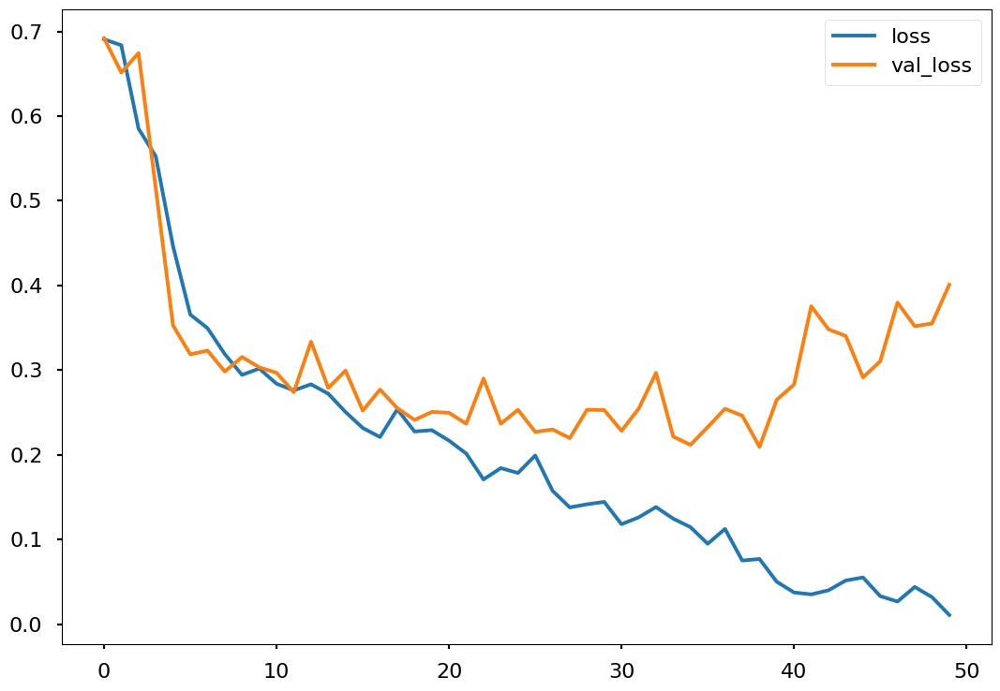

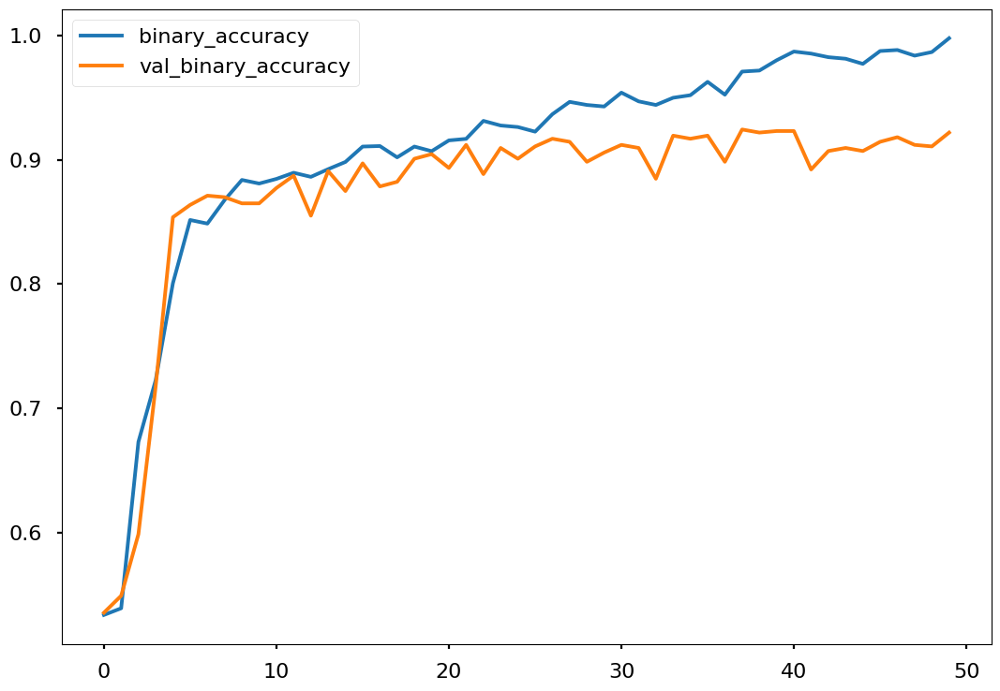

26/26 [==============================] - 1s 26ms/step


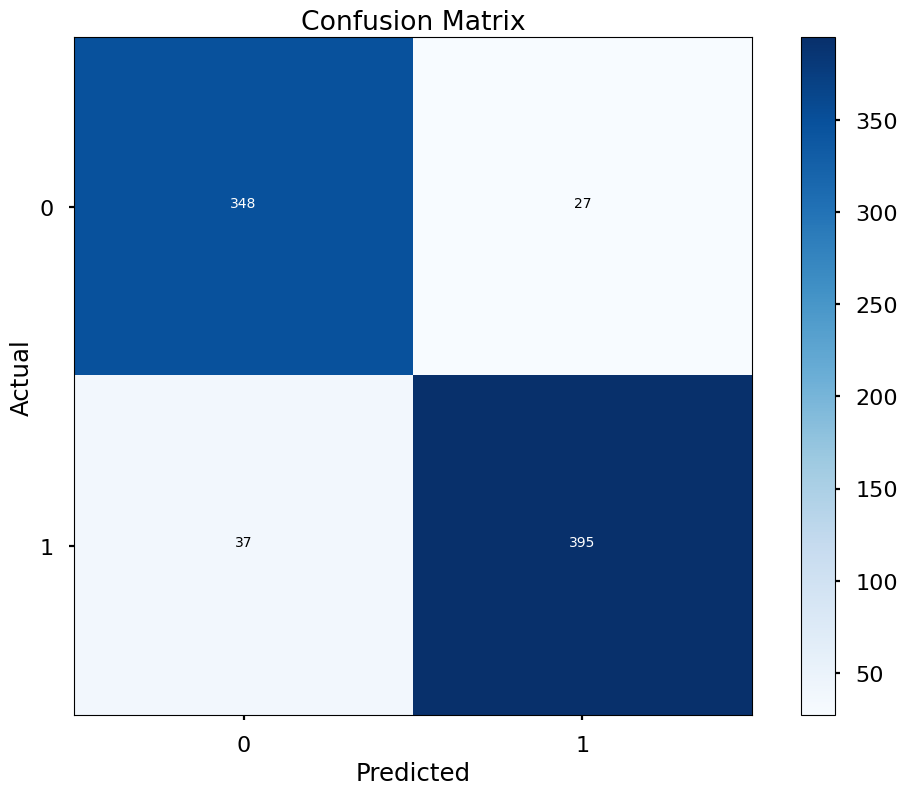

In [ ]:
# Scalogram

optimizer1 = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.0001)
optimizer3 = SGD(learning_rate=0.0001)
optimizer4 = Adafactor(learning_rate=0.0001)
optimizer5 = AdamW(learning_rate=0.0001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

early_stopping = EarlyStopping(
    monitor='val_binary_accuracy',
    min_delta = 0.001, # minimium amount of change to count as an improvement
    mode = 'max',
    patience = 30, # how many epochs to wait before stopping
    restore_best_weights = True,
)

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 50,
    batch_size = 128,
    validation_data = (X_val_shuffled, y_val_shuffled),
    callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

y_pred = model.predict(X_test_shuffled)
y_test = y_test_shuffled.astype(int).tolist()
y_pred = np.round(y_pred).tolist()

cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_test))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cm.max() / 2.
for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
    plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
plt.show();

Epoch 1/50
19/19 [==============================] - 25s 1s/step - loss: 0.8425 - binary_accuracy: 0.4963 - precision_1: 0.5276 - recall_1: 0.5748 - specificity: 0.4667 - f1_m: 0.5363 - val_loss: 0.6882 - val_binary_accuracy: 0.5353 - val_precision_1: 0.5353 - val_recall_1: 1.0000 - val_specificity: 0.4639 - val_f1_m: 0.6988
Epoch 2/50
19/19 [==============================] - 8s 406ms/step - loss: 0.6905 - binary_accuracy: 0.5422 - precision_1: 0.5498 - recall_1: 0.8048 - specificity: 0.4633 - f1_m: 0.6524 - val_loss: 0.6880 - val_binary_accuracy: 0.5353 - val_precision_1: 0.5353 - val_recall_1: 1.0000 - val_specificity: 0.4718 - val_f1_m: 0.6988
Epoch 3/50
19/19 [==============================] - 8s 404ms/step - loss: 0.6905 - binary_accuracy: 0.5252 - precision_1: 0.5400 - recall_1: 0.7716 - specificity: 0.4744 - f1_m: 0.6313 - val_loss: 0.6833 - val_binary_accuracy: 0.5353 - val_precision_1: 0.5353 - val_recall_1: 1.0000 - val_specificity: 0.4524 - val_f1_m: 0.6988
Epoch 4/50
19/19 [

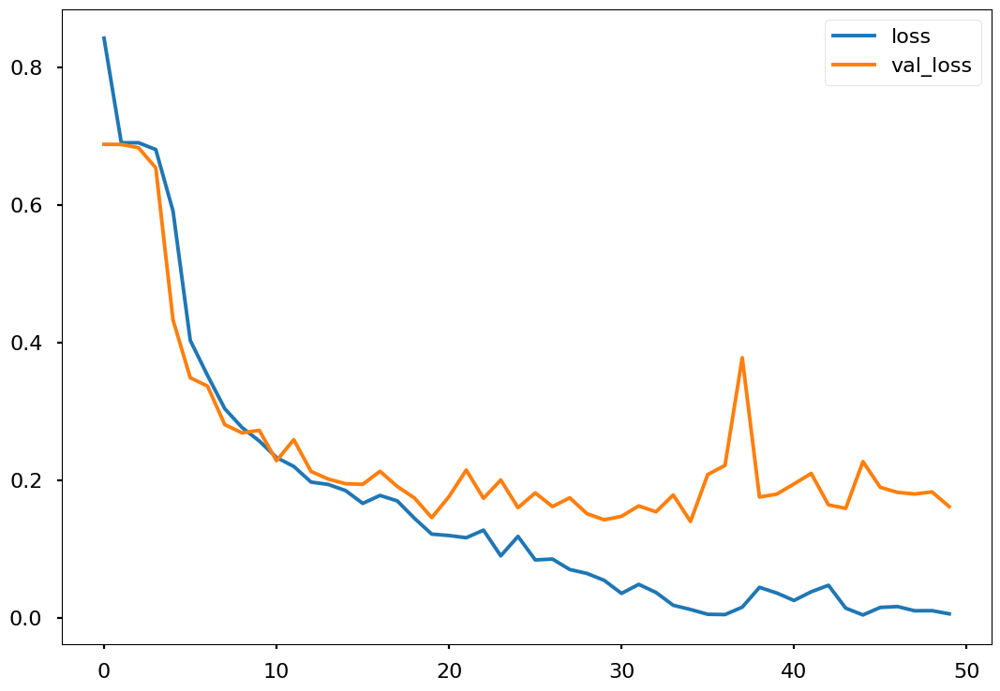

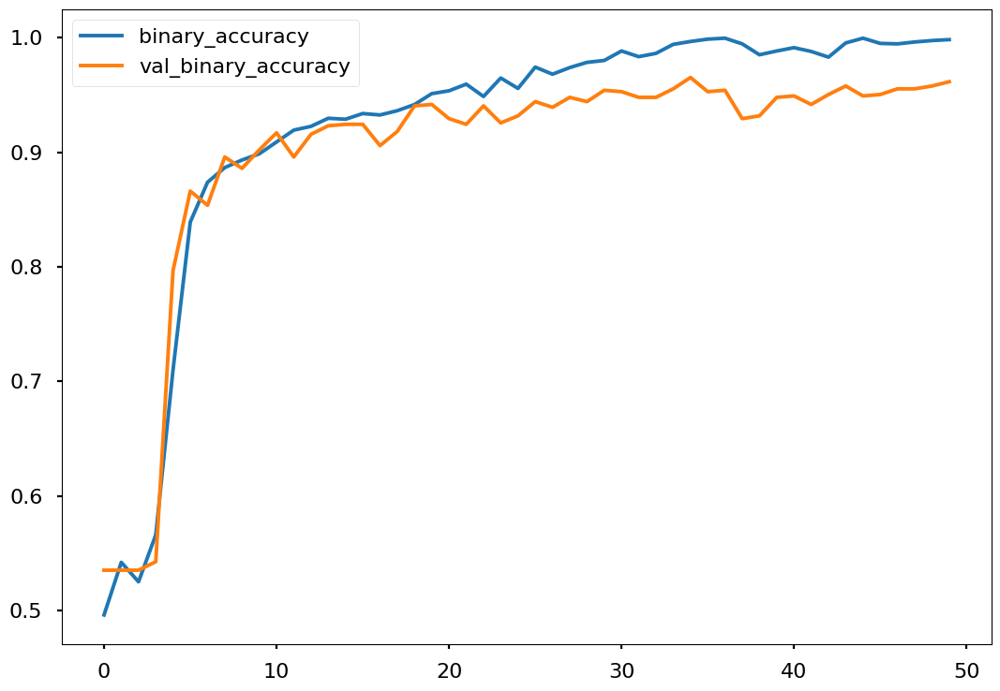

26/26 [==============================] - 1s 26ms/step


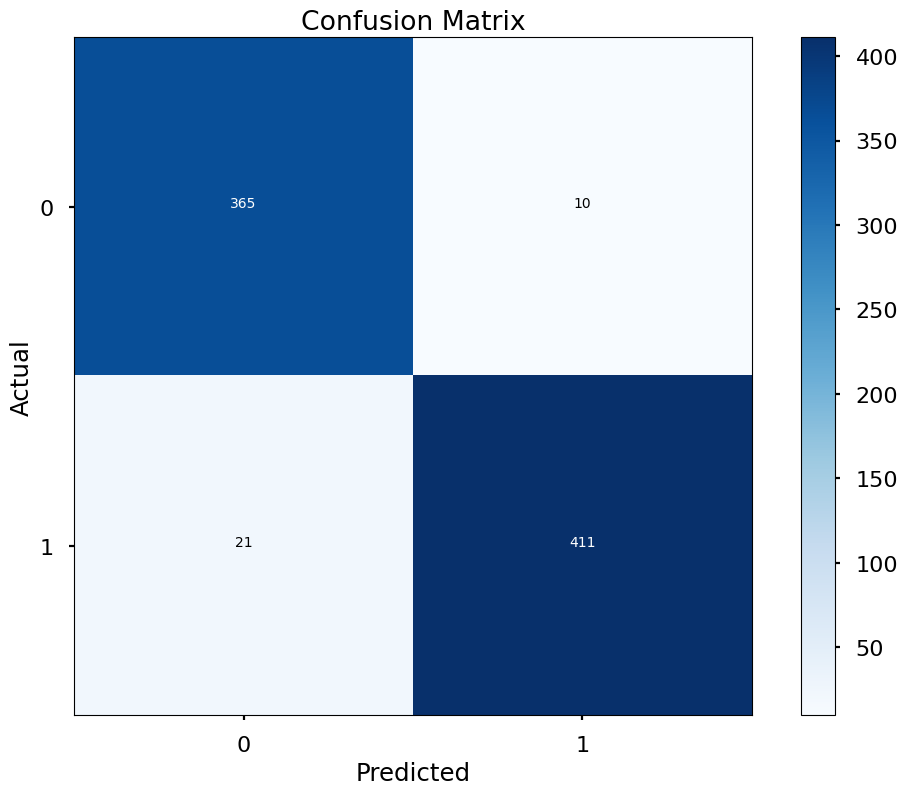

In [ ]:
# Spectrogram

optimizer1 = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001)
optimizer2 = RMSprop(learning_rate=0.0001)
optimizer3 = SGD(learning_rate=0.0001)
optimizer4 = Adafactor(learning_rate=0.0001)
optimizer5 = AdamW(learning_rate=0.0001)

model = Vgg16_model((112, 112, 3))
model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

early_stopping = EarlyStopping(
    monitor='val_binary_accuracy',
    min_delta = 0.001, # minimium amount of change to count as an improvement
    mode = 'max',
    patience = 30, # how many epochs to wait before stopping
    restore_best_weights = True,
)

history = model.fit(
    X_train_shuffled, y_train_shuffled,
    epochs = 50,
    batch_size = 128,
    validation_data = (X_val_shuffled, y_val_shuffled),
    callbacks=[early_stopping]
)

res = model.evaluate(X_test_shuffled, y_test_shuffled)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
plt.show()

y_pred = model.predict(X_test_shuffled)
y_test = y_test_shuffled.astype(int).tolist()
y_pred = np.round(y_pred).tolist()

cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
plt.colorbar()
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
tick_marks = np.arange(len(set(y_test))) # length of classes
class_labels = ['0','1']
tick_marks
plt.xticks(tick_marks,class_labels)
plt.yticks(tick_marks,class_labels)
# plotting text value inside cells
thresh = cm.max() / 2.
for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
    plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
plt.show();

In [ ]:
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.optimizers import Adam, RMSprop, SGD, Adafactor, AdamW

In [ ]:
Skf = StratifiedKFold(random_state=1, shuffle=True)

Epoch 1/50
19/19 [==============================] - 13s 408ms/step - loss: 1.0470 - binary_accuracy: 0.5008 - precision_54: 0.5321 - recall_54: 0.5687 - specificity: 0.4657 - f1_m: 0.5252 - val_loss: 0.6911 - val_binary_accuracy: 0.5353 - val_precision_54: 0.5353 - val_recall_54: 1.0000 - val_specificity: 0.4879 - val_f1_m: 0.6953
Epoch 2/50
19/19 [==============================] - 7s 386ms/step - loss: 0.6969 - binary_accuracy: 0.5165 - precision_54: 0.5360 - recall_54: 0.7299 - specificity: 0.4610 - f1_m: 0.6130 - val_loss: 0.6904 - val_binary_accuracy: 0.5353 - val_precision_54: 0.5353 - val_recall_54: 1.0000 - val_specificity: 0.4802 - val_f1_m: 0.6953
Epoch 3/50
19/19 [==============================] - 7s 396ms/step - loss: 0.6960 - binary_accuracy: 0.5128 - precision_54: 0.5339 - recall_54: 0.7160 - specificity: 0.4723 - f1_m: 0.6090 - val_loss: 0.6899 - val_binary_accuracy: 0.5353 - val_precision_54: 0.5353 - val_recall_54: 1.0000 - val_specificity: 0.4559 - val_f1_m: 0.6953
Epo

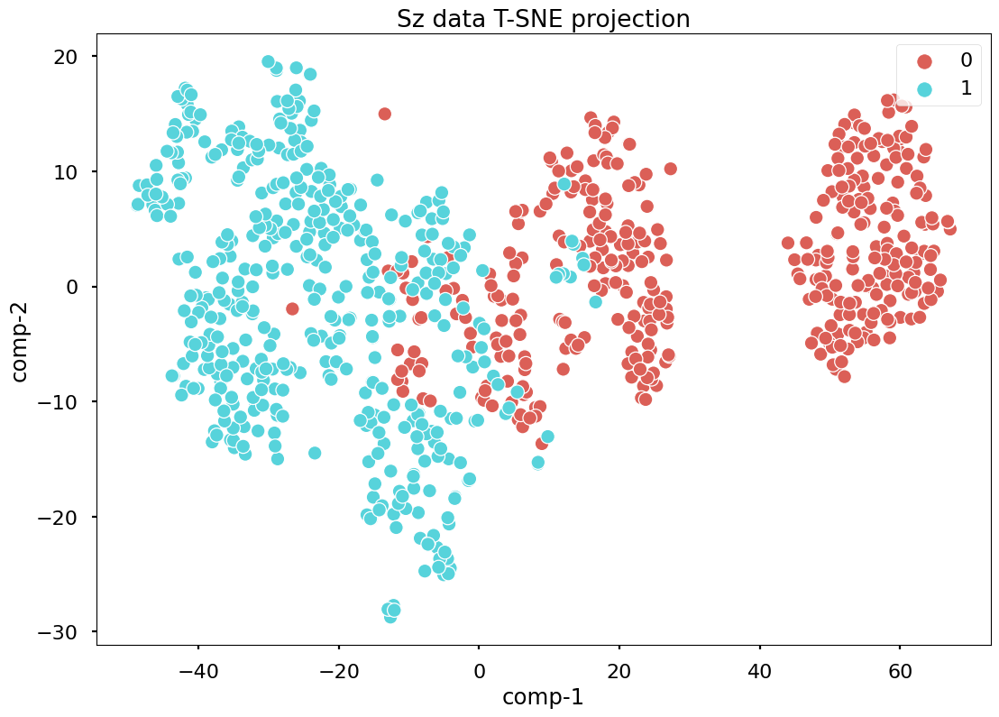

26/26 [==============================] - 1s 28ms/step


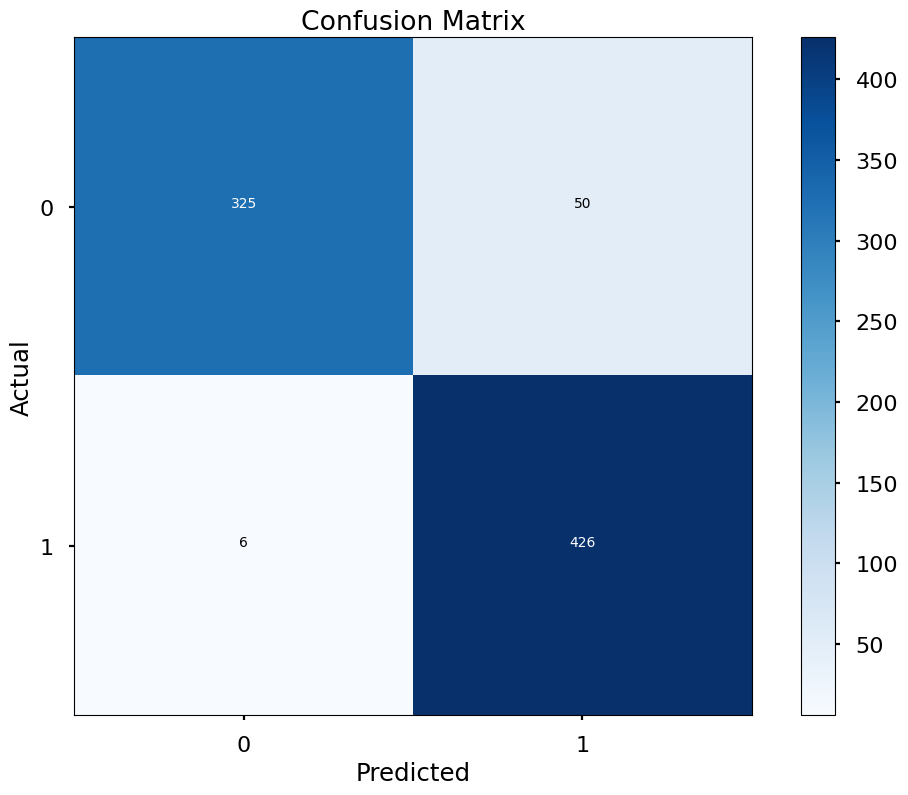

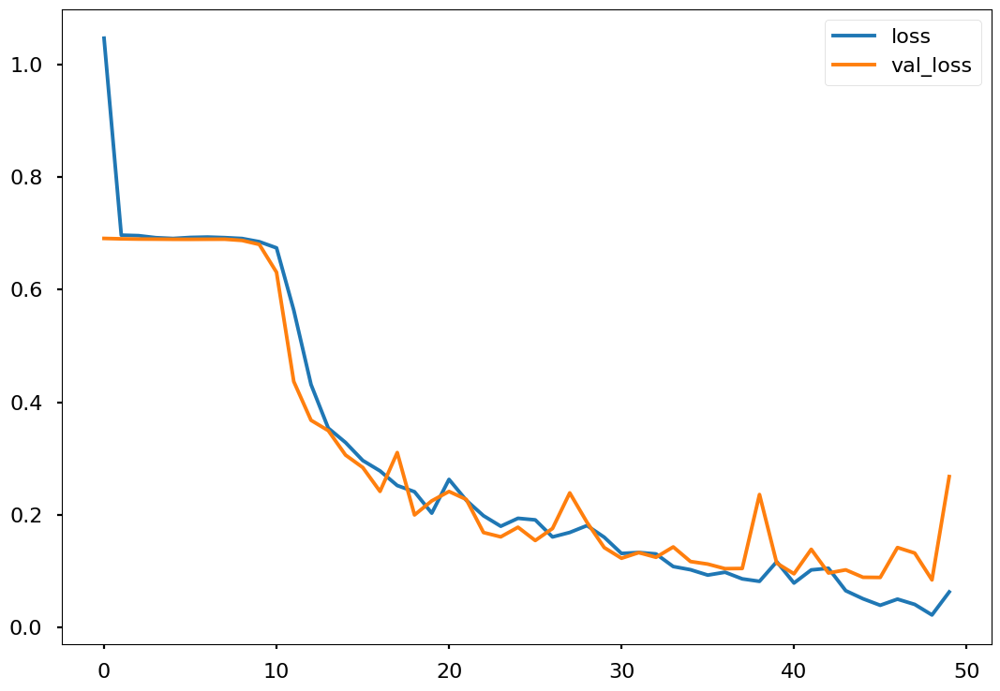

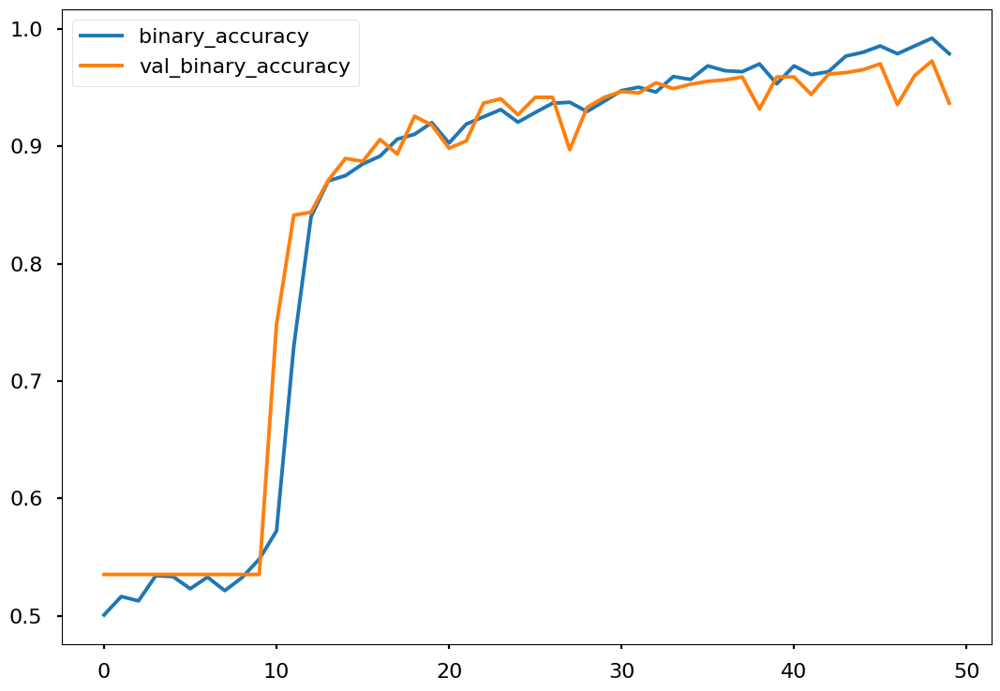

Epoch 1/50
19/19 [==============================] - 12s 404ms/step - loss: 0.9232 - binary_accuracy: 0.5087 - precision_56: 0.5359 - recall_56: 0.6227 - specificity: 0.4599 - f1_m: 0.5547 - val_loss: 0.6900 - val_binary_accuracy: 0.5353 - val_precision_56: 0.5353 - val_recall_56: 1.0000 - val_specificity: 0.4573 - val_f1_m: 0.6973
Epoch 2/50
19/19 [==============================] - 7s 385ms/step - loss: 0.6985 - binary_accuracy: 0.5079 - precision_56: 0.5308 - recall_56: 0.7052 - specificity: 0.4682 - f1_m: 0.5991 - val_loss: 0.6895 - val_binary_accuracy: 0.5353 - val_precision_56: 0.5353 - val_recall_56: 1.0000 - val_specificity: 0.4649 - val_f1_m: 0.6973
Epoch 3/50
19/19 [==============================] - 7s 392ms/step - loss: 0.6944 - binary_accuracy: 0.5074 - precision_56: 0.5273 - recall_56: 0.7816 - specificity: 0.4736 - f1_m: 0.6284 - val_loss: 0.6893 - val_binary_accuracy: 0.5353 - val_precision_56: 0.5353 - val_recall_56: 1.0000 - val_specificity: 0.4605 - val_f1_m: 0.6973
Epo

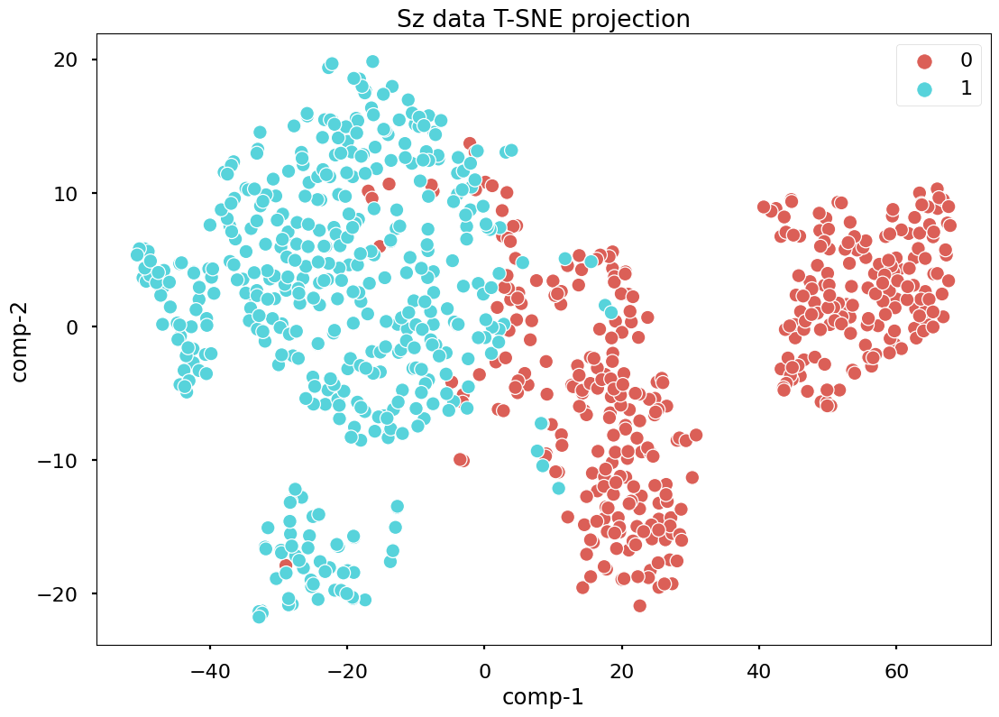

26/26 [==============================] - 1s 29ms/step


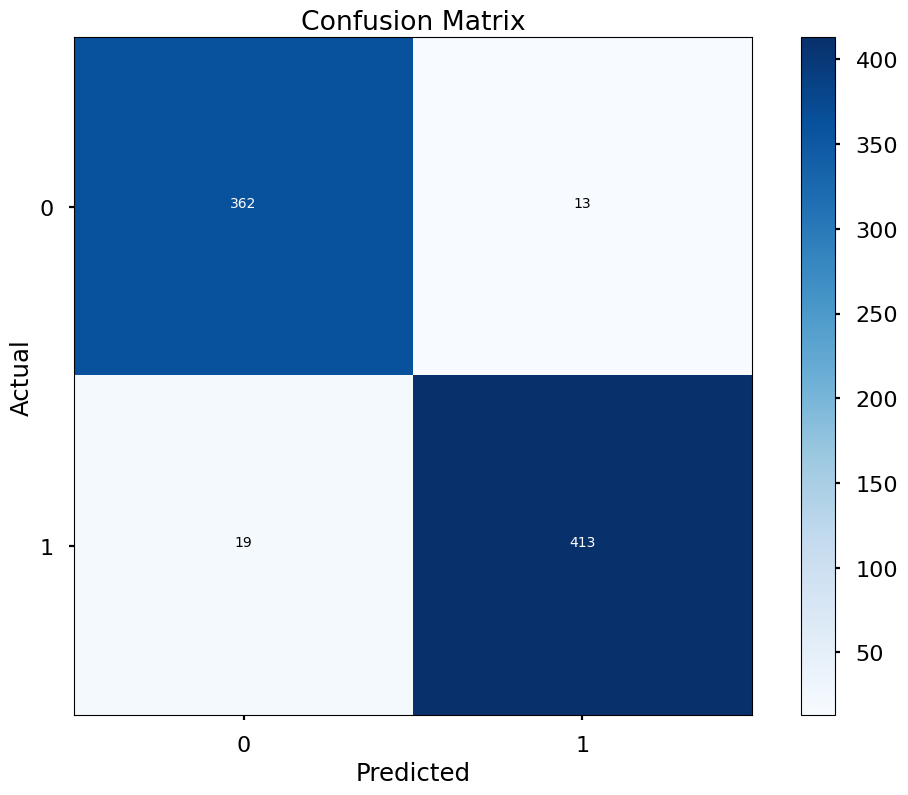

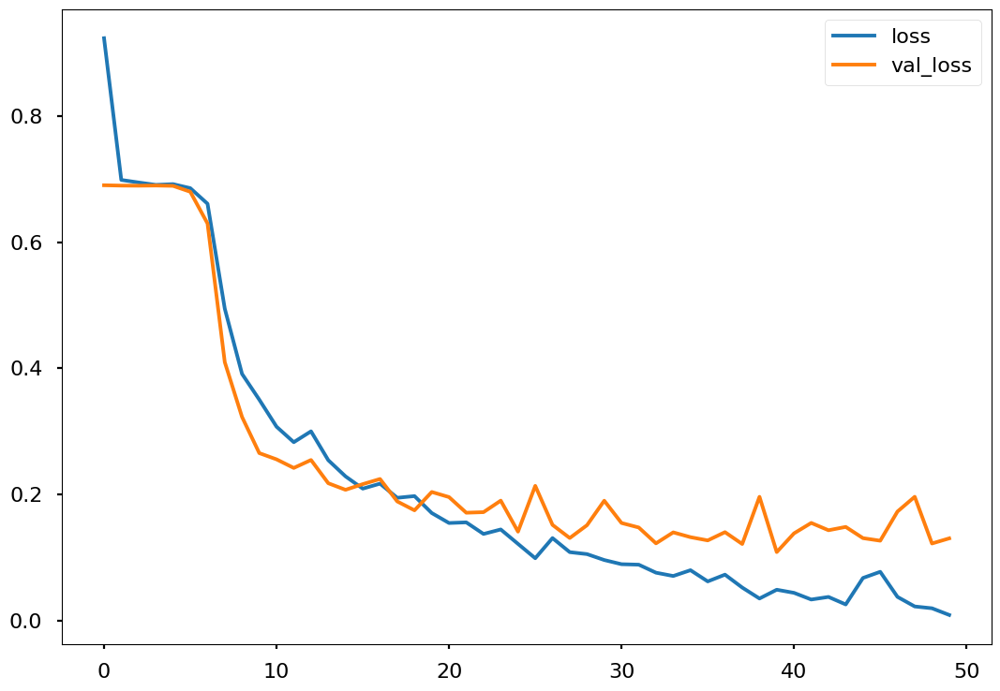

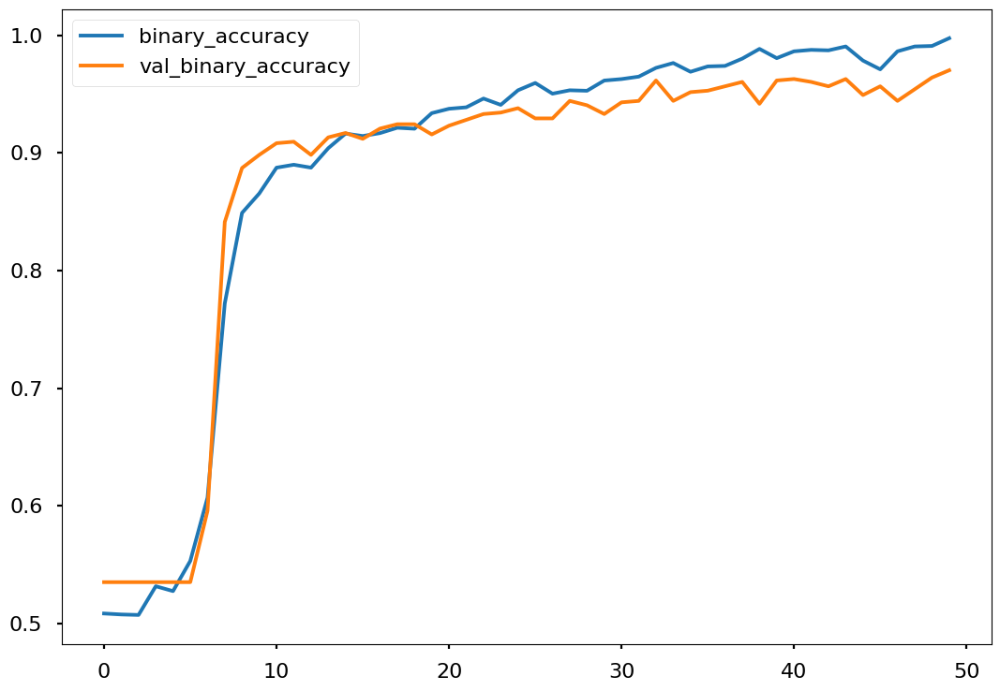

Epoch 1/50
19/19 [==============================] - 12s 405ms/step - loss: 0.8294 - binary_accuracy: 0.5076 - precision_58: 0.5367 - recall_58: 0.5918 - specificity: 0.4690 - f1_m: 0.5384 - val_loss: 0.6943 - val_binary_accuracy: 0.5353 - val_precision_58: 0.5353 - val_recall_58: 1.0000 - val_specificity: 0.4134 - val_f1_m: 0.7057
Epoch 2/50
19/19 [==============================] - 7s 386ms/step - loss: 0.6961 - binary_accuracy: 0.5217 - precision_58: 0.5375 - recall_58: 0.7677 - specificity: 0.4648 - f1_m: 0.6262 - val_loss: 0.6885 - val_binary_accuracy: 0.5353 - val_precision_58: 0.5353 - val_recall_58: 1.0000 - val_specificity: 0.4677 - val_f1_m: 0.7057
Epoch 3/50
19/19 [==============================] - 7s 394ms/step - loss: 0.6904 - binary_accuracy: 0.5362 - precision_58: 0.5470 - recall_58: 0.7809 - specificity: 0.4756 - f1_m: 0.6422 - val_loss: 0.6857 - val_binary_accuracy: 0.5353 - val_precision_58: 0.5353 - val_recall_58: 1.0000 - val_specificity: 0.4581 - val_f1_m: 0.7057
Epo

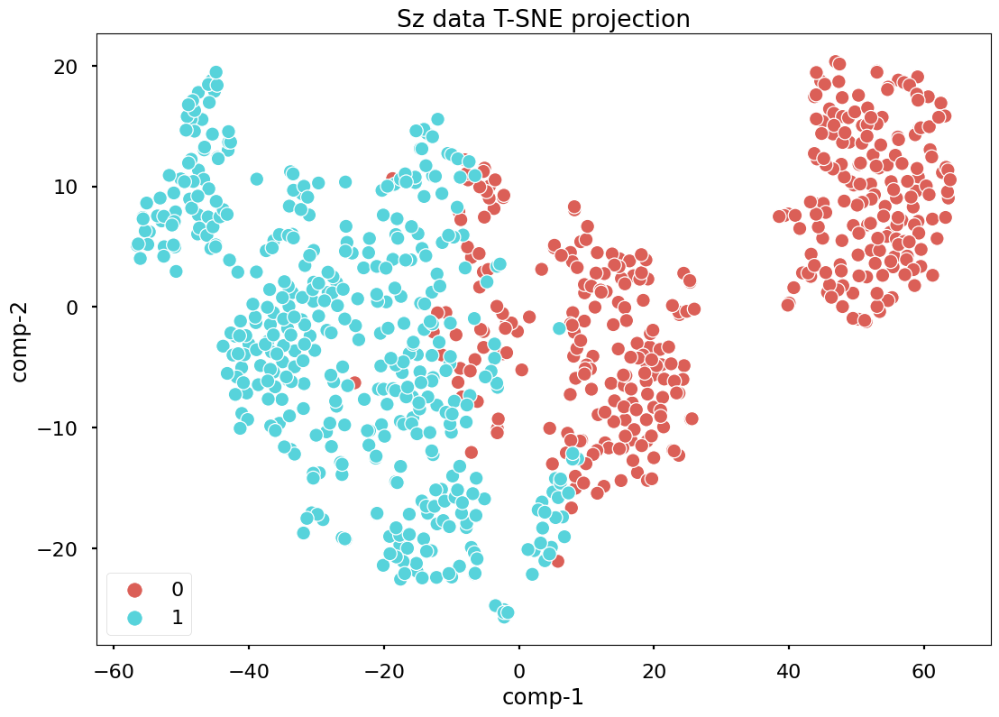

26/26 [==============================] - 1s 28ms/step


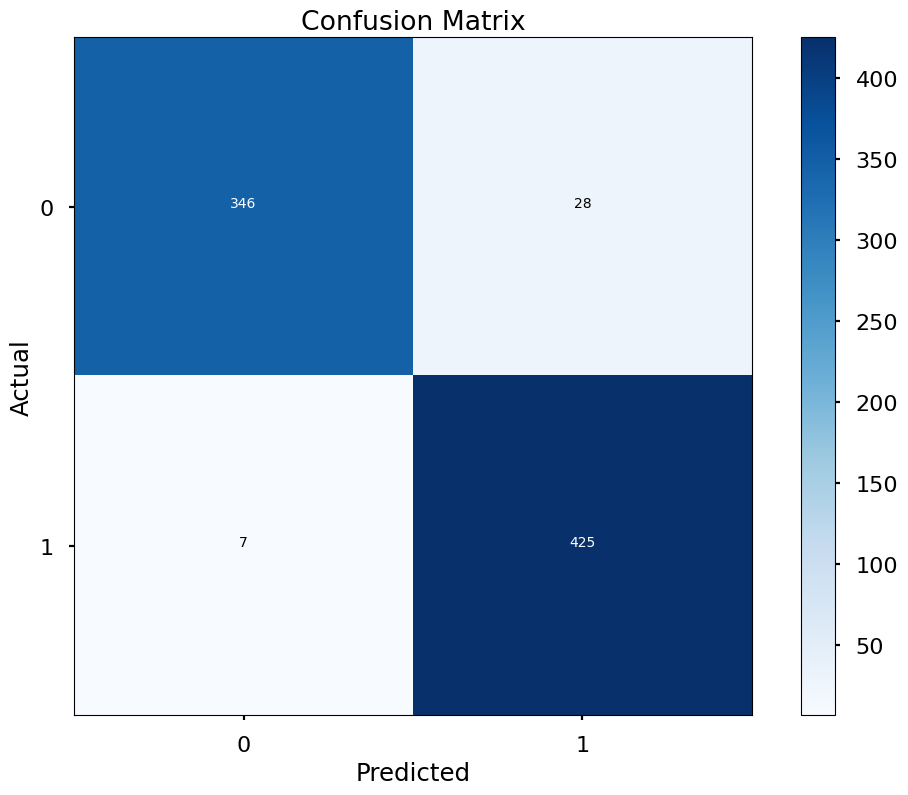

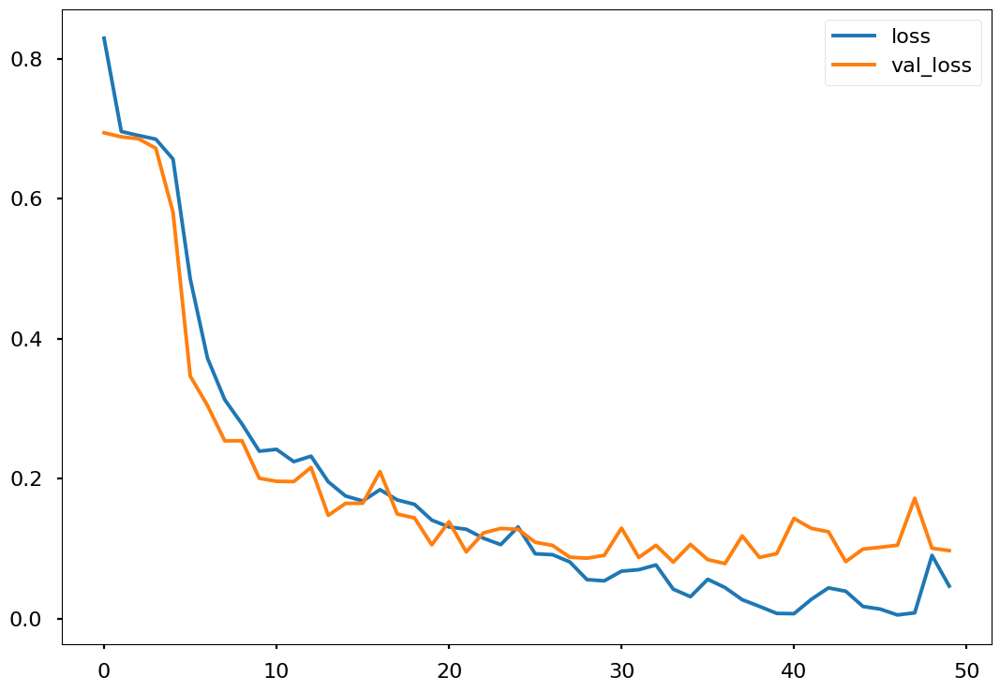

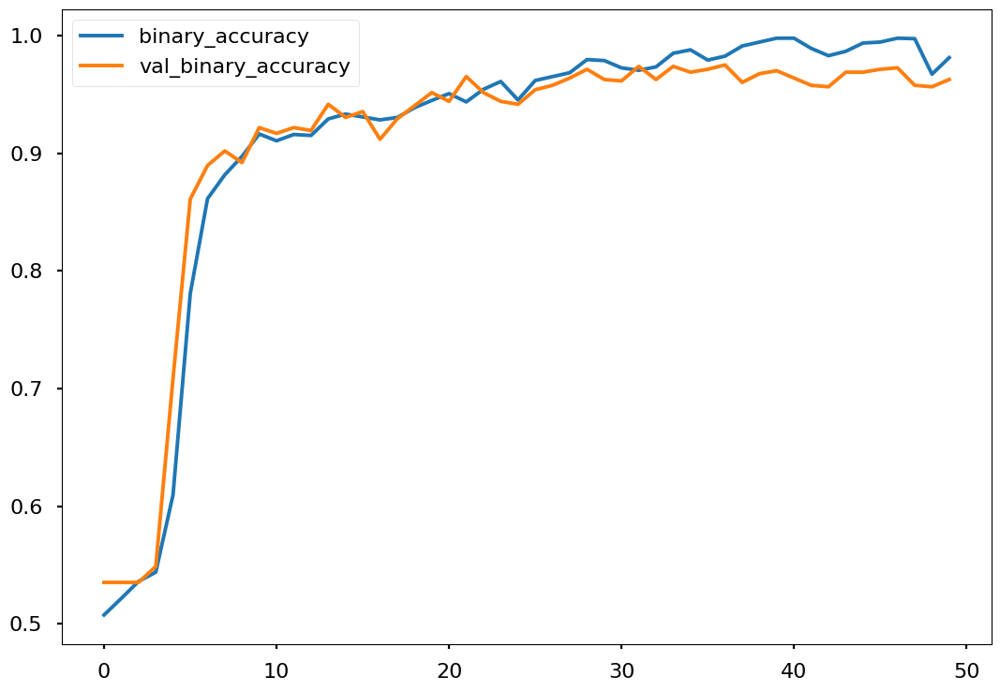

Epoch 1/50
19/19 [==============================] - 13s 407ms/step - loss: 0.8378 - binary_accuracy: 0.5076 - precision_60: 0.5363 - recall_60: 0.5980 - specificity: 0.4679 - f1_m: 0.5439 - val_loss: 0.6900 - val_binary_accuracy: 0.5353 - val_precision_60: 0.5353 - val_recall_60: 1.0000 - val_specificity: 0.4762 - val_f1_m: 0.6925
Epoch 2/50
19/19 [==============================] - 7s 385ms/step - loss: 0.6980 - binary_accuracy: 0.5229 - precision_60: 0.5418 - recall_60: 0.7106 - specificity: 0.4688 - f1_m: 0.6119 - val_loss: 0.6900 - val_binary_accuracy: 0.5353 - val_precision_60: 0.5353 - val_recall_60: 1.0000 - val_specificity: 0.4567 - val_f1_m: 0.6925
Epoch 3/50
19/19 [==============================] - 7s 391ms/step - loss: 0.6934 - binary_accuracy: 0.5184 - precision_60: 0.5358 - recall_60: 0.7562 - specificity: 0.4724 - f1_m: 0.6238 - val_loss: 0.6900 - val_binary_accuracy: 0.5353 - val_precision_60: 0.5353 - val_recall_60: 1.0000 - val_specificity: 0.4670 - val_f1_m: 0.6925
Epo

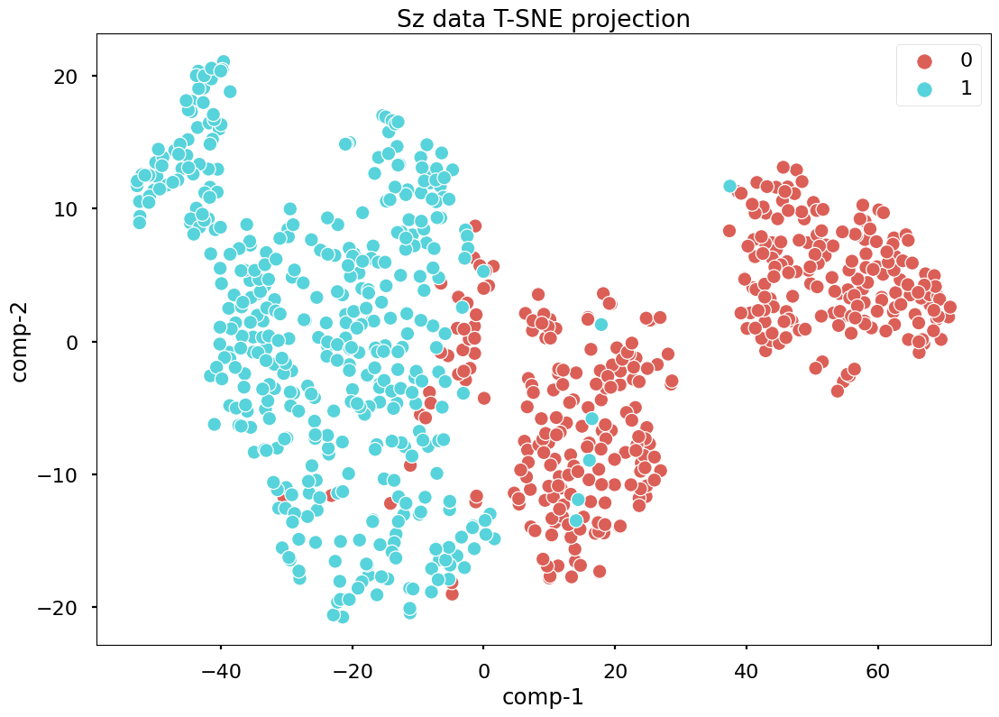

26/26 [==============================] - 1s 27ms/step


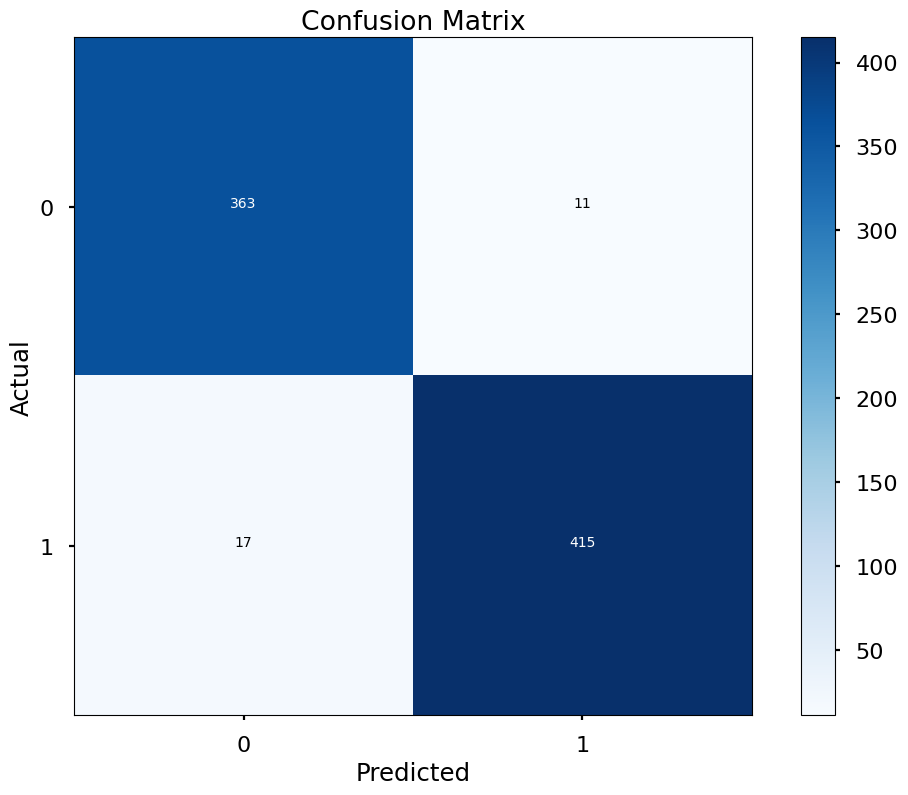

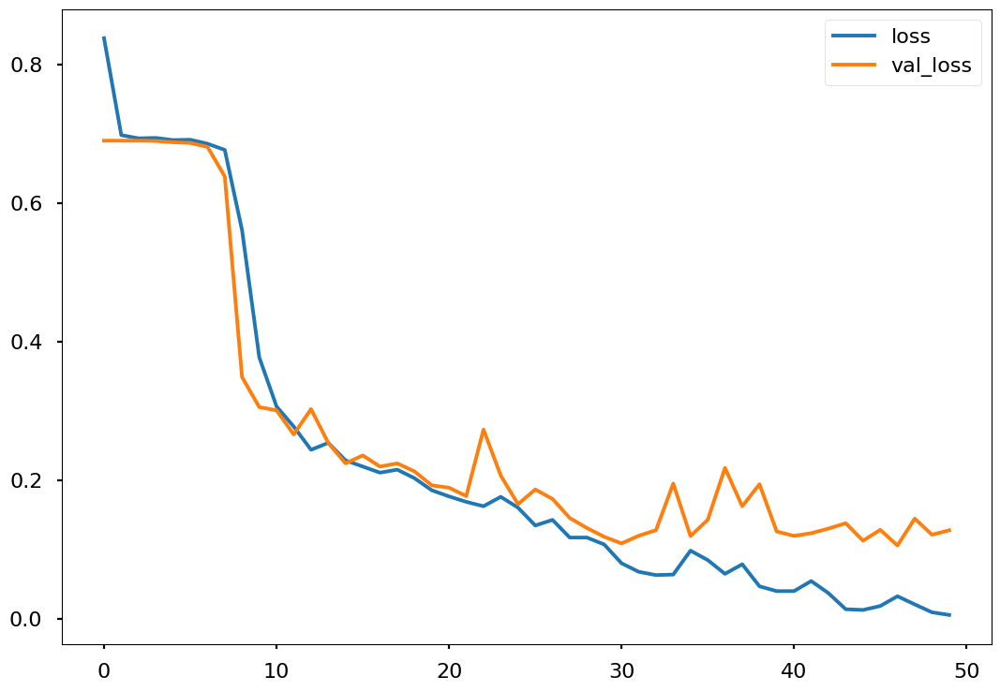

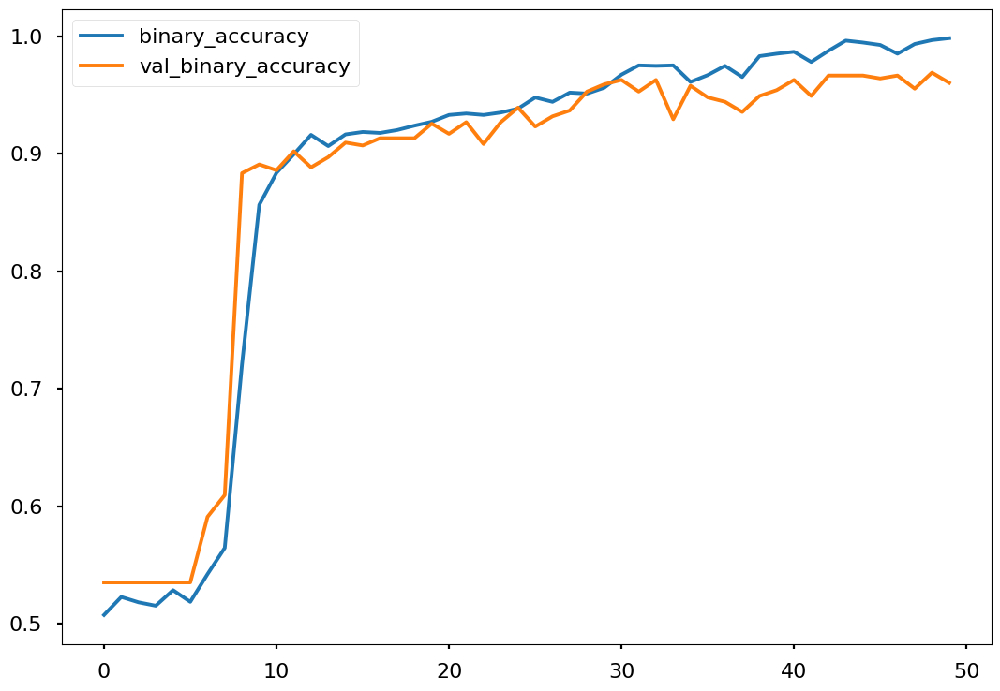

Epoch 1/50
19/19 [==============================] - 12s 405ms/step - loss: 0.7857 - binary_accuracy: 0.4986 - precision_62: 0.5283 - recall_62: 0.5980 - specificity: 0.4659 - f1_m: 0.5438 - val_loss: 0.6893 - val_binary_accuracy: 0.5353 - val_precision_62: 0.5353 - val_recall_62: 1.0000 - val_specificity: 0.4788 - val_f1_m: 0.6987
Epoch 2/50
19/19 [==============================] - 7s 383ms/step - loss: 0.6947 - binary_accuracy: 0.5275 - precision_62: 0.5413 - recall_62: 0.7739 - specificity: 0.4736 - f1_m: 0.6345 - val_loss: 0.6878 - val_binary_accuracy: 0.5353 - val_precision_62: 0.5353 - val_recall_62: 1.0000 - val_specificity: 0.4564 - val_f1_m: 0.6987
Epoch 3/50
19/19 [==============================] - 7s 391ms/step - loss: 0.6879 - binary_accuracy: 0.5411 - precision_62: 0.5468 - recall_62: 0.8387 - specificity: 0.4673 - f1_m: 0.6594 - val_loss: 0.6829 - val_binary_accuracy: 0.5353 - val_precision_62: 0.5353 - val_recall_62: 1.0000 - val_specificity: 0.4809 - val_f1_m: 0.6987
Epo

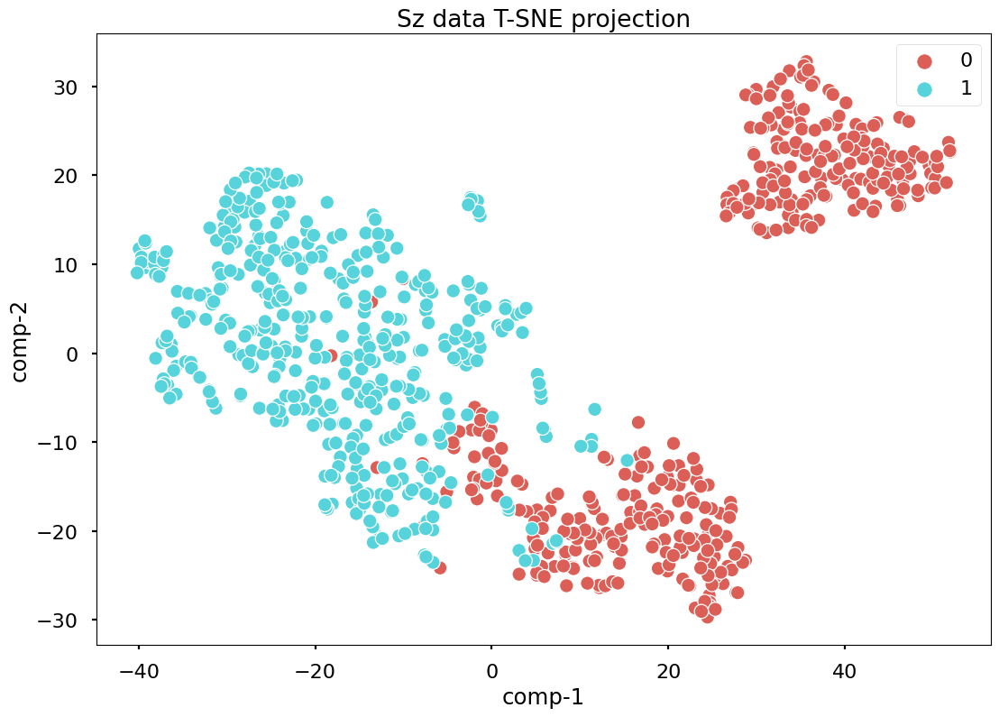

26/26 [==============================] - 1s 29ms/step


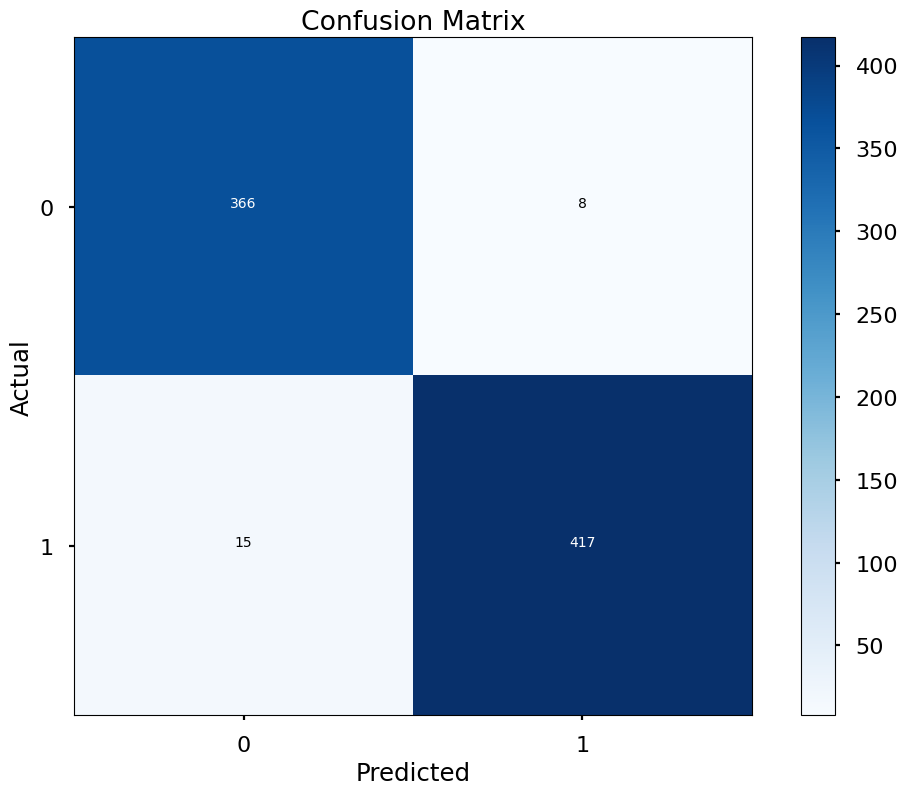

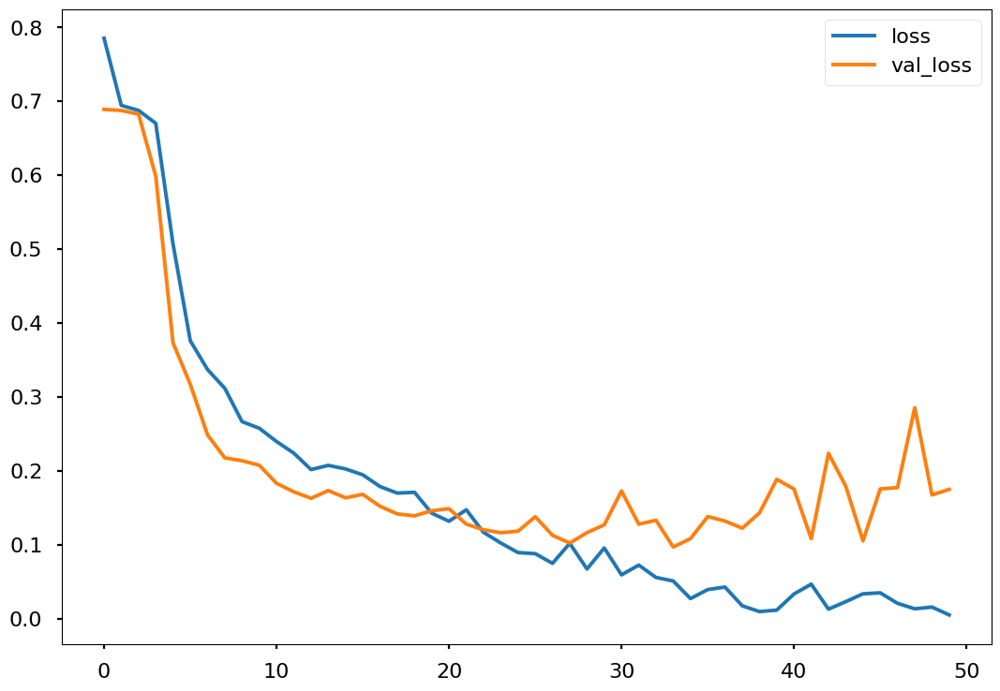

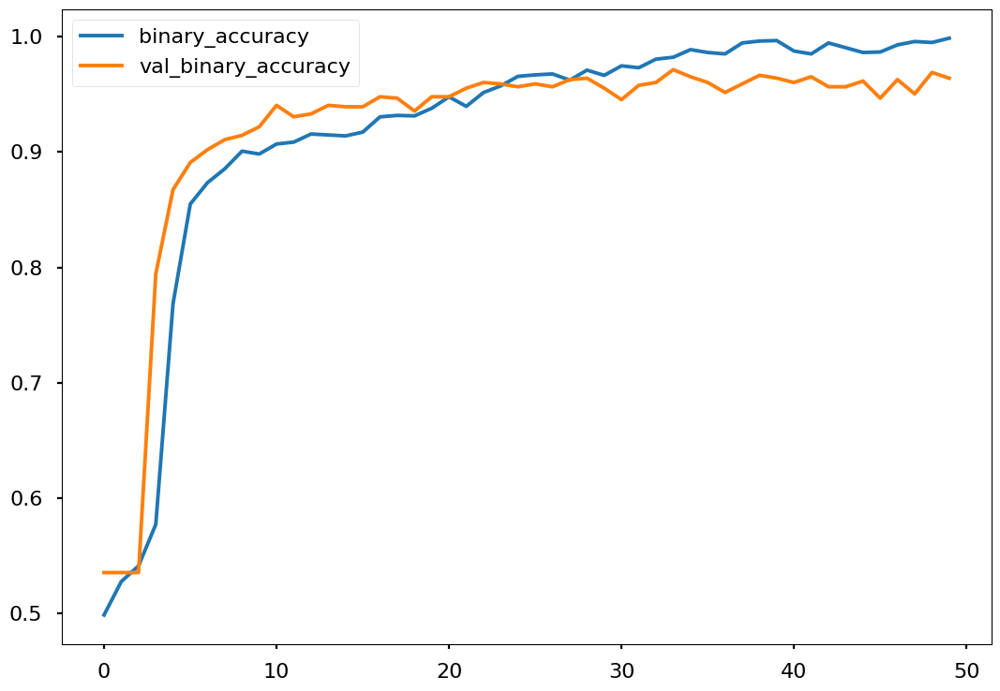

In [ ]:
# order 5 (4 - 45), AdamW, Notched 50Hz, Spectrogram, 20 sec seg, z score

accuracy = []
precision = []
recall = []
spec = []
f1 = []

i = 1

for train_index, test_index in Skf.split(nspec_data_array, labels_array):
    # if i<=1:
    #     i+=1
    #     continue
    optimizer1 = Adam(learning_rate=0.0001)
    optimizer2 = RMSprop(learning_rate=0.00001)
    optimizer3 = SGD(learning_rate=0.0001)
    optimizer4 = Adafactor(learning_rate=0.0001)
    optimizer5 = AdamW(learning_rate=0.0001)

    train_features, train_labels = nspec_data_array[train_index], labels_array[train_index]
    test_features, test_labels = nspec_data_array[test_index], labels_array[test_index]

    train_features, val_features, train_labels, val_labels = train_test_split(train_features, train_labels, test_size=0.25, stratify=train_labels)

    model = Vgg16_model((112, 112, 3))
    tmod = model[1]
    model = model[0]
    model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])
    tmod.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

    history = model.fit(
        train_features, train_labels,
        epochs = 50,
        batch_size = 128,
        validation_data = (val_features,val_labels),
        #callbacks=[early_stopping]
    )

    res = model.evaluate(test_features,test_labels)

    pred_tmod = tmod.predict(test_features)

    tsne = TSNE(n_components=2)
    print(pred_tmod.shape)
    if len(pred_tmod.shape)==4:
        z = tsne.fit_transform(pred_tmod.reshape(pred_tmod.shape[0], pred_tmod.shape[1]*pred_tmod.shape[2]*pred_tmod.shape[3]))
    elif len(pred_tmod.shape)==3:
        z = tsne.fit_transform(pred_tmod.reshape(pred_tmod.shape[0], pred_tmod.shape[1]*pred_tmod.shape[2]))
    else:
        z = tsne.fit_transform(pred_tmod.reshape(pred_tmod.shape[0], pred_tmod.shape[1]))
    df = pd.DataFrame()
    df["y"] = test_labels
    df["comp-1"] = z[:,0]
    df["comp-2"] = z[:,1]

    sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
            palette=sns.color_palette("hls", 2),
            data=df).set(title="Sz data T-SNE projection")
    plt.show()

    y_pred = model.predict(test_features)
    y_test = test_labels.astype(int).tolist()
    y_pred = np.round(y_pred).tolist()

    cm = confusion_matrix(y_test, y_pred)
    plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
    plt.colorbar()
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    tick_marks = np.arange(len(set(y_test))) # length of classes
    class_labels = ['0','1']
    tick_marks
    plt.xticks(tick_marks,class_labels)
    plt.yticks(tick_marks,class_labels)
    # plotting text value inside cells
    thresh = cm.max() / 2.
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
    plt.show();

    accuracy.append(res[1])
    precision.append(res[2])
    recall.append(res[3])
    spec.append(res[4])
    f1.append(res[5])

    history_frame = pd.DataFrame(history.history)
    history_frame.loc[:, ['loss', 'val_loss']].plot()
    history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
    plt.show()

    # break

In [ ]:
print(sum(accuracy)/len(accuracy)), print(sum(precision)/len(accuracy)), print(sum(recall)/len(accuracy)), print(sum(spec)/len(accuracy)), print(sum(f1)/len(accuracy))

0.9568508863449097
0.951597261428833
0.9703703641891479
0.4329010725021362
0.5680704712867737


(None, None, None, None, None)

Epoch 1/50
19/19 [==============================] - 12s 417ms/step - loss: 0.6917 - binary_accuracy: 0.5281 - precision_34: 0.5357 - recall_34: 0.8974 - specificity: 0.4749 - f1_m: 0.6678 - val_loss: 0.6908 - val_binary_accuracy: 0.5353 - val_precision_34: 0.5353 - val_recall_34: 1.0000 - val_specificity: 0.4698 - val_f1_m: 0.6904
Epoch 2/50
19/19 [==============================] - 7s 382ms/step - loss: 0.6923 - binary_accuracy: 0.5298 - precision_34: 0.5357 - recall_34: 0.9205 - specificity: 0.4759 - f1_m: 0.6759 - val_loss: 0.6904 - val_binary_accuracy: 0.5353 - val_precision_34: 0.5353 - val_recall_34: 1.0000 - val_specificity: 0.4697 - val_f1_m: 0.6904
Epoch 3/50
19/19 [==============================] - 7s 385ms/step - loss: 0.6901 - binary_accuracy: 0.5356 - precision_34: 0.5359 - recall_34: 0.9961 - specificity: 0.4693 - f1_m: 0.6958 - val_loss: 0.6864 - val_binary_accuracy: 0.5353 - val_precision_34: 0.5353 - val_recall_34: 1.0000 - val_specificity: 0.4373 - val_f1_m: 0.6904
Epo

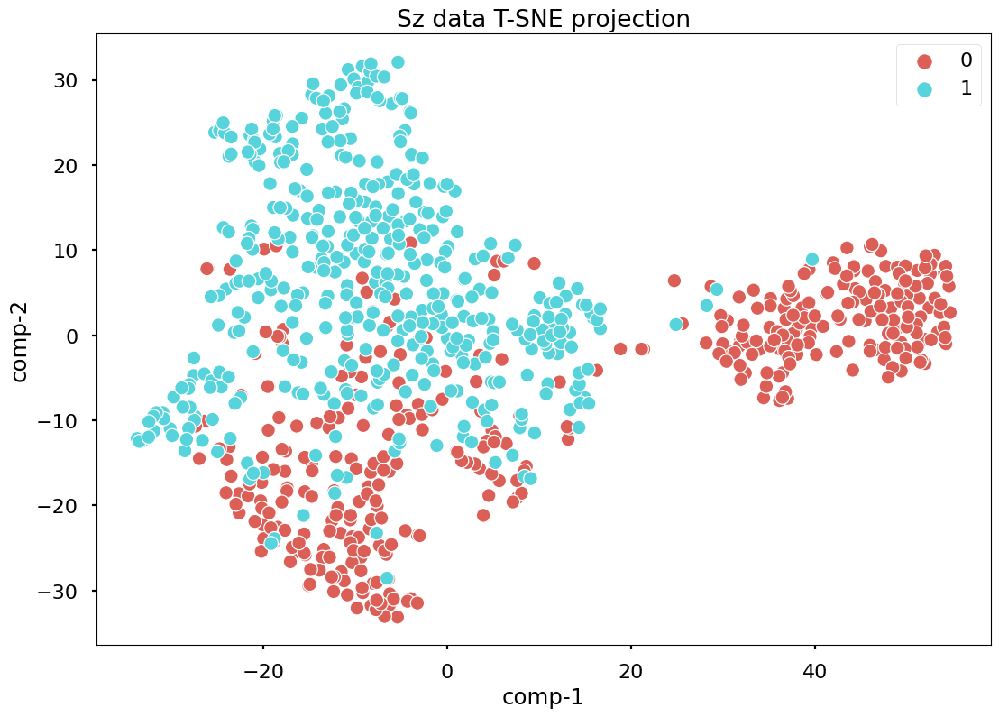

26/26 [==============================] - 1s 30ms/step


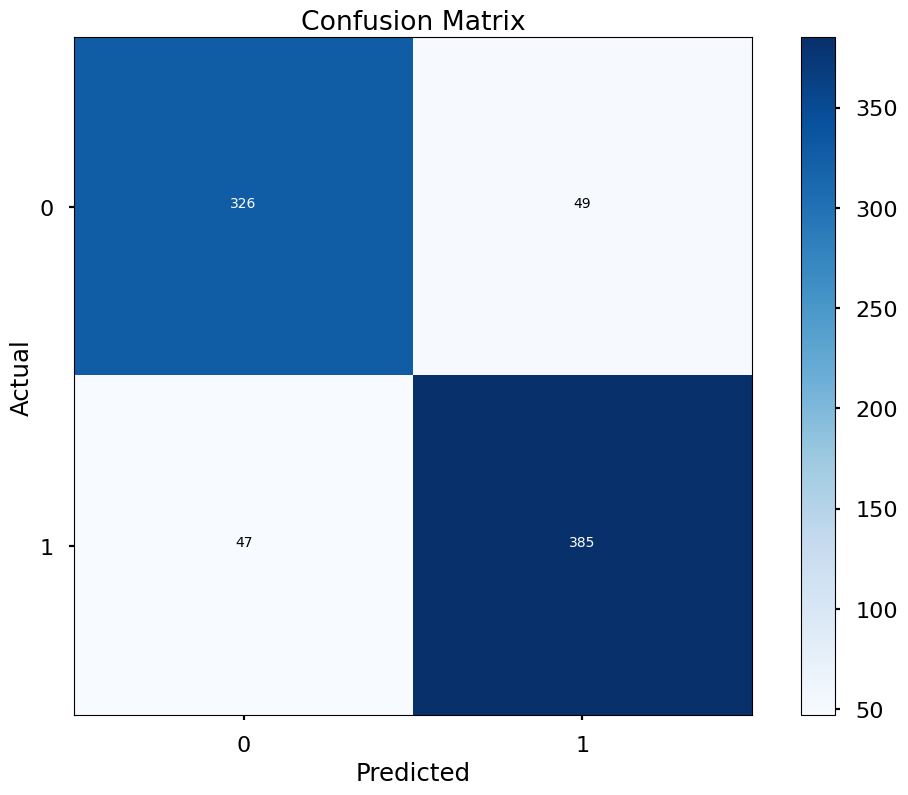

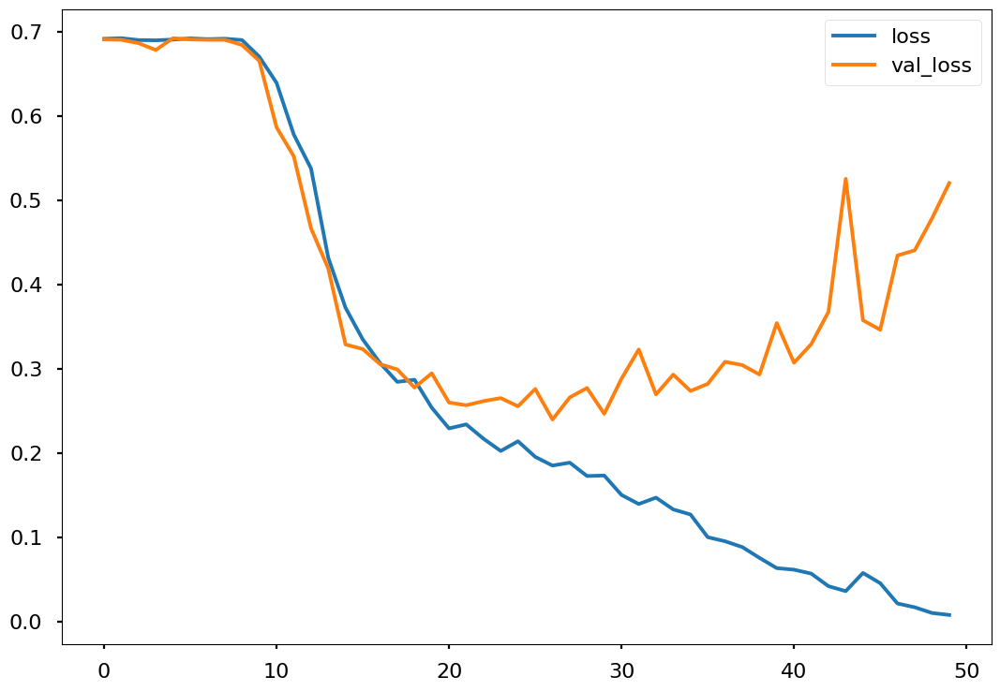

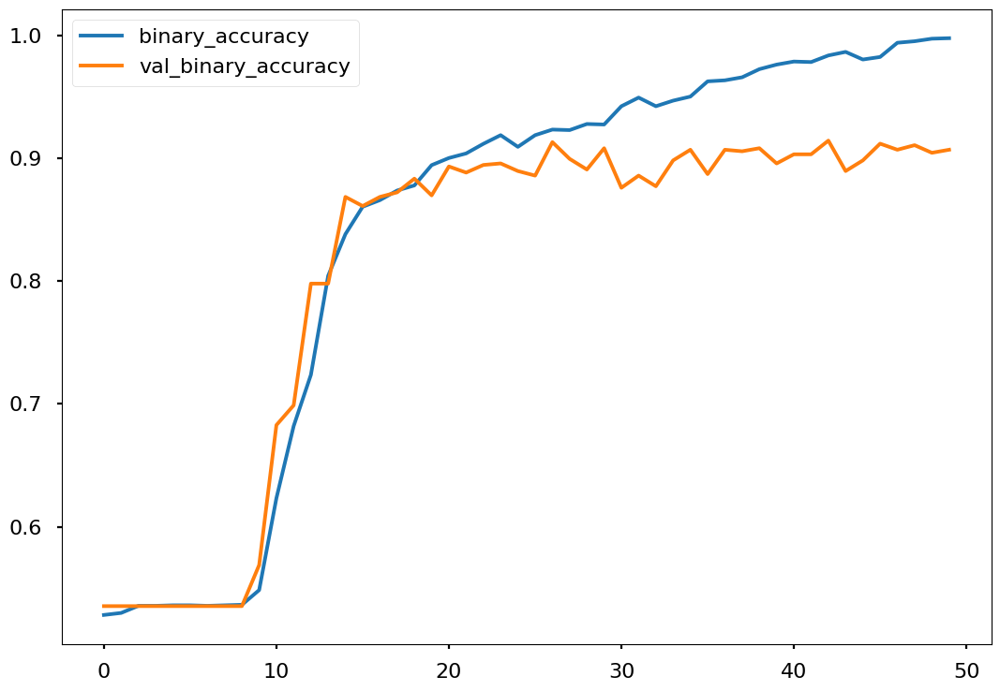

Epoch 1/50
19/19 [==============================] - 13s 429ms/step - loss: 0.6924 - binary_accuracy: 0.5248 - precision_36: 0.5329 - recall_36: 0.9174 - specificity: 0.4797 - f1_m: 0.6708 - val_loss: 0.6905 - val_binary_accuracy: 0.5353 - val_precision_36: 0.5353 - val_recall_36: 1.0000 - val_specificity: 0.4735 - val_f1_m: 0.6991
Epoch 2/50
19/19 [==============================] - 8s 399ms/step - loss: 0.6921 - binary_accuracy: 0.5310 - precision_36: 0.5341 - recall_36: 0.9776 - specificity: 0.4728 - f1_m: 0.6899 - val_loss: 0.6903 - val_binary_accuracy: 0.5353 - val_precision_36: 0.5353 - val_recall_36: 1.0000 - val_specificity: 0.4728 - val_f1_m: 0.6991
Epoch 3/50
19/19 [==============================] - 8s 407ms/step - loss: 0.6897 - binary_accuracy: 0.5356 - precision_36: 0.5360 - recall_36: 0.9938 - specificity: 0.4708 - f1_m: 0.6950 - val_loss: 0.6884 - val_binary_accuracy: 0.5353 - val_precision_36: 0.5353 - val_recall_36: 1.0000 - val_specificity: 0.4451 - val_f1_m: 0.6991
Epo

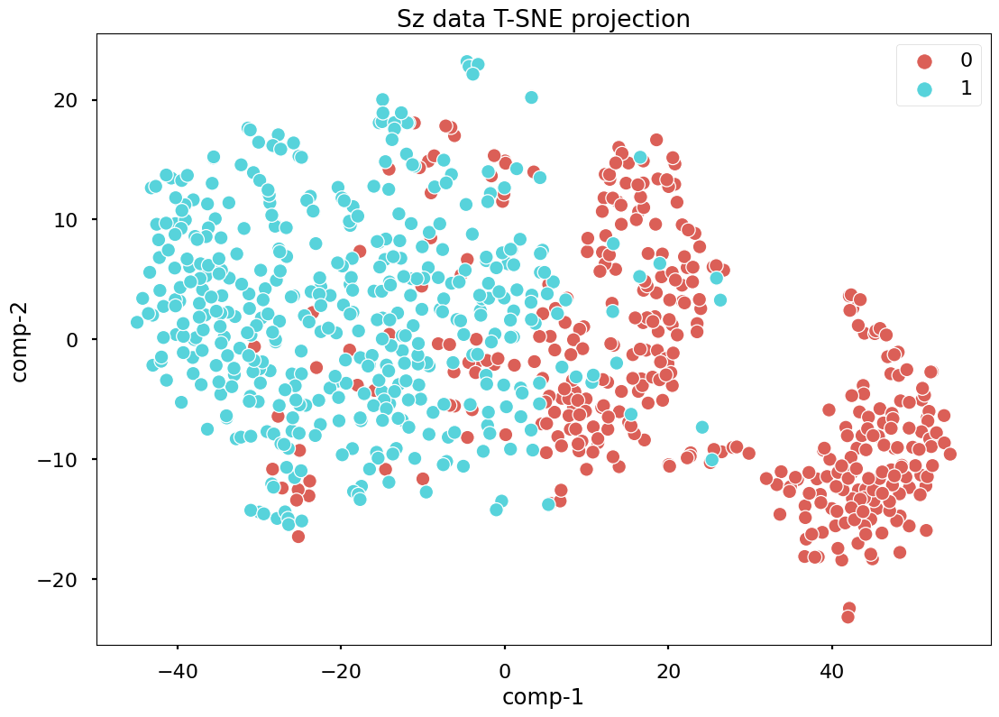

26/26 [==============================] - 1s 30ms/step


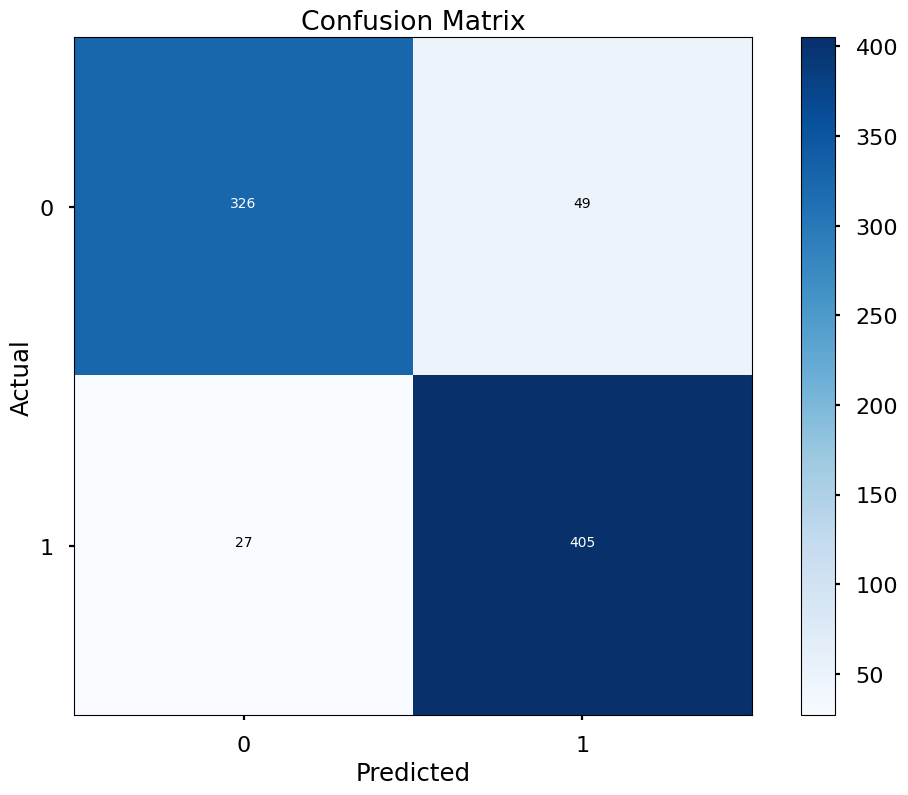

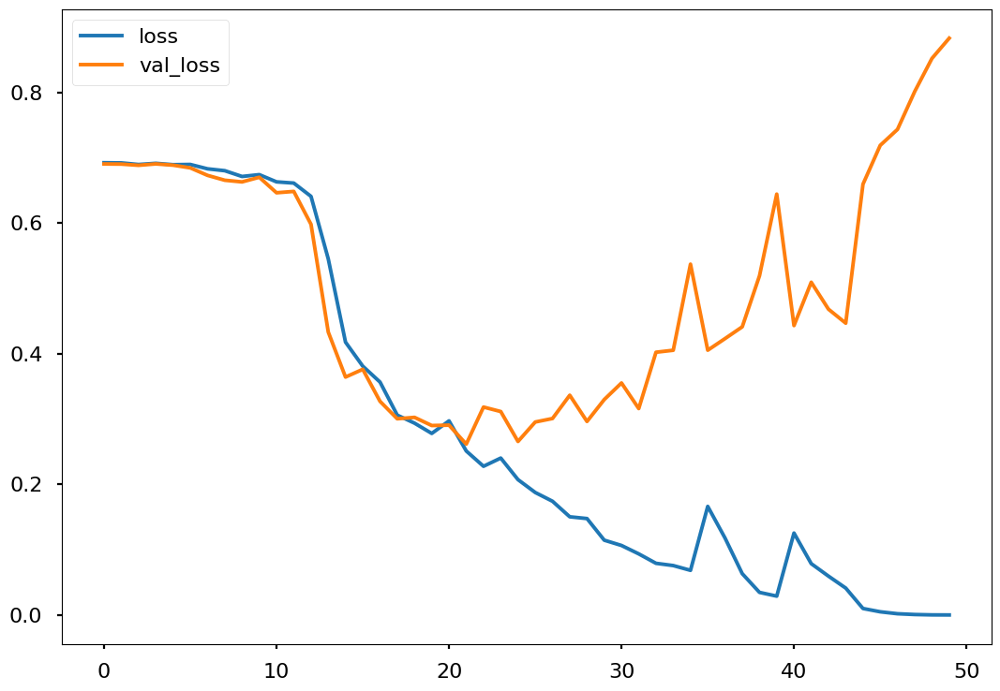

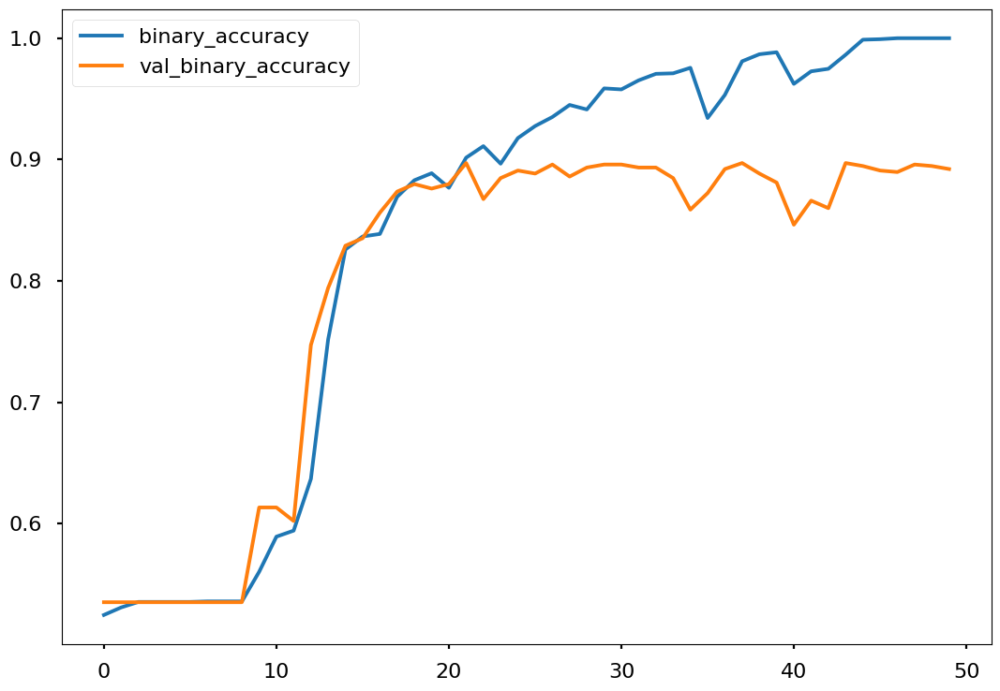

Epoch 1/50
19/19 [==============================] - 13s 426ms/step - loss: 0.6926 - binary_accuracy: 0.5300 - precision_38: 0.5352 - recall_38: 0.9321 - specificity: 0.4781 - f1_m: 0.6757 - val_loss: 0.6904 - val_binary_accuracy: 0.5353 - val_precision_38: 0.5353 - val_recall_38: 1.0000 - val_specificity: 0.4735 - val_f1_m: 0.7006
Epoch 2/50
19/19 [==============================] - 8s 398ms/step - loss: 0.6894 - binary_accuracy: 0.5395 - precision_38: 0.5389 - recall_38: 0.9730 - specificity: 0.4639 - f1_m: 0.6924 - val_loss: 0.6884 - val_binary_accuracy: 0.5353 - val_precision_38: 0.5353 - val_recall_38: 1.0000 - val_specificity: 0.4822 - val_f1_m: 0.7006
Epoch 3/50
19/19 [==============================] - 8s 406ms/step - loss: 0.6903 - binary_accuracy: 0.5349 - precision_38: 0.5408 - recall_38: 0.8750 - specificity: 0.4752 - f1_m: 0.6653 - val_loss: 0.6914 - val_binary_accuracy: 0.5353 - val_precision_38: 0.5353 - val_recall_38: 1.0000 - val_specificity: 0.4838 - val_f1_m: 0.7006
Epo

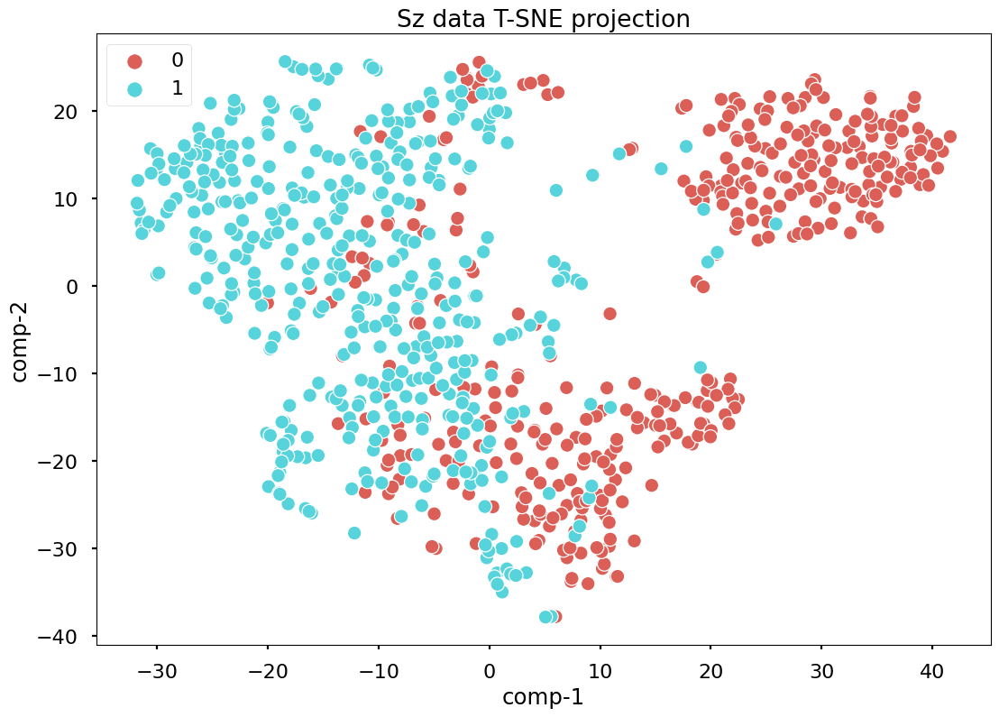

26/26 [==============================] - 1s 29ms/step


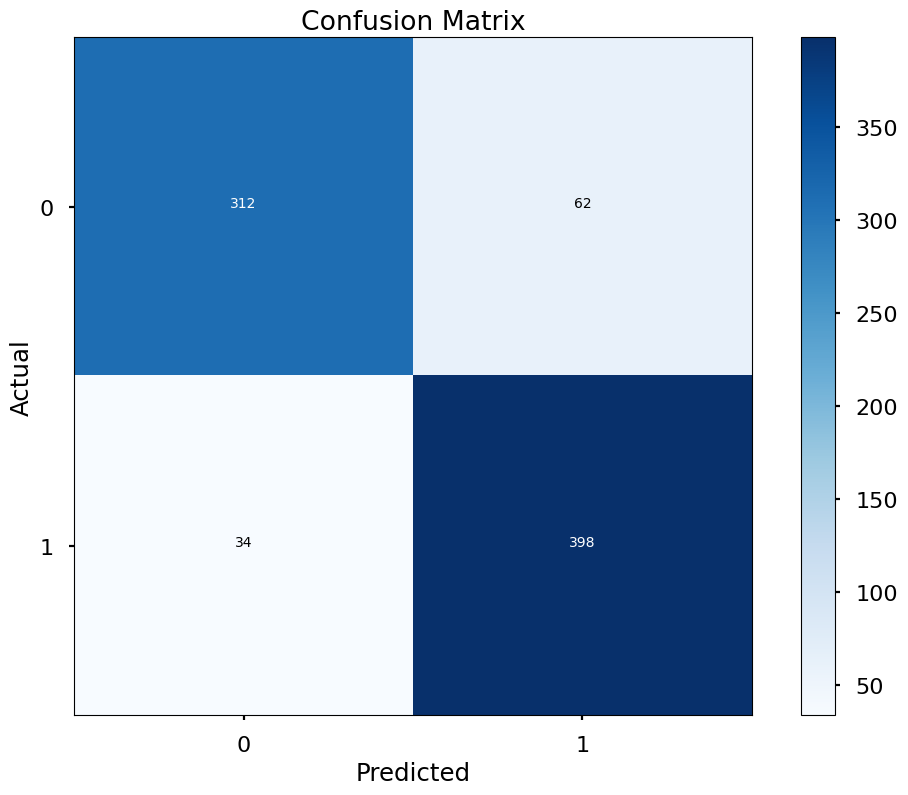

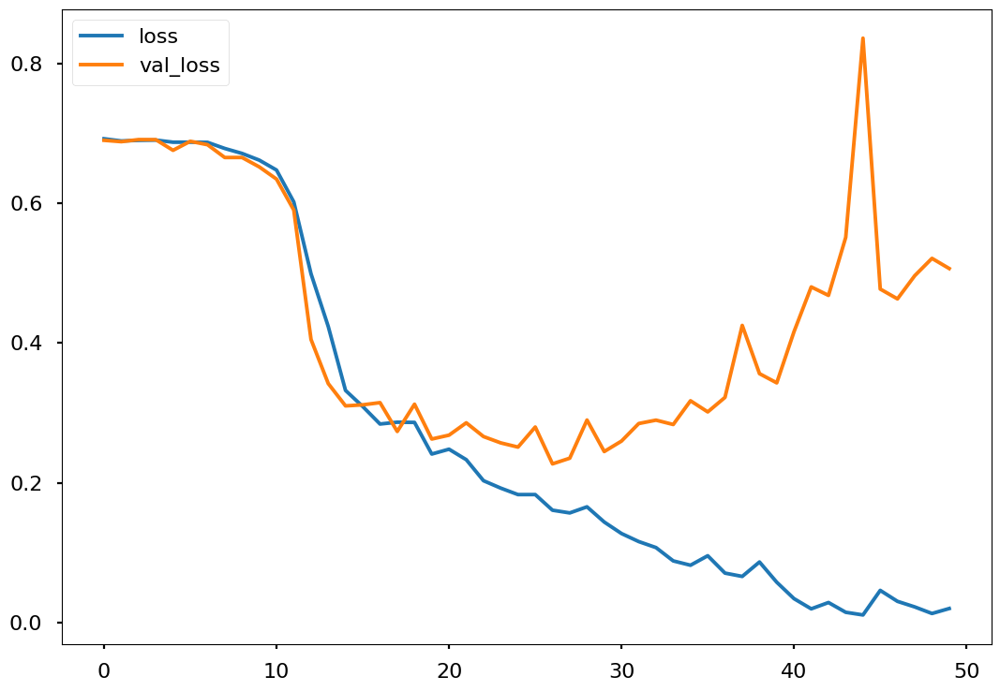

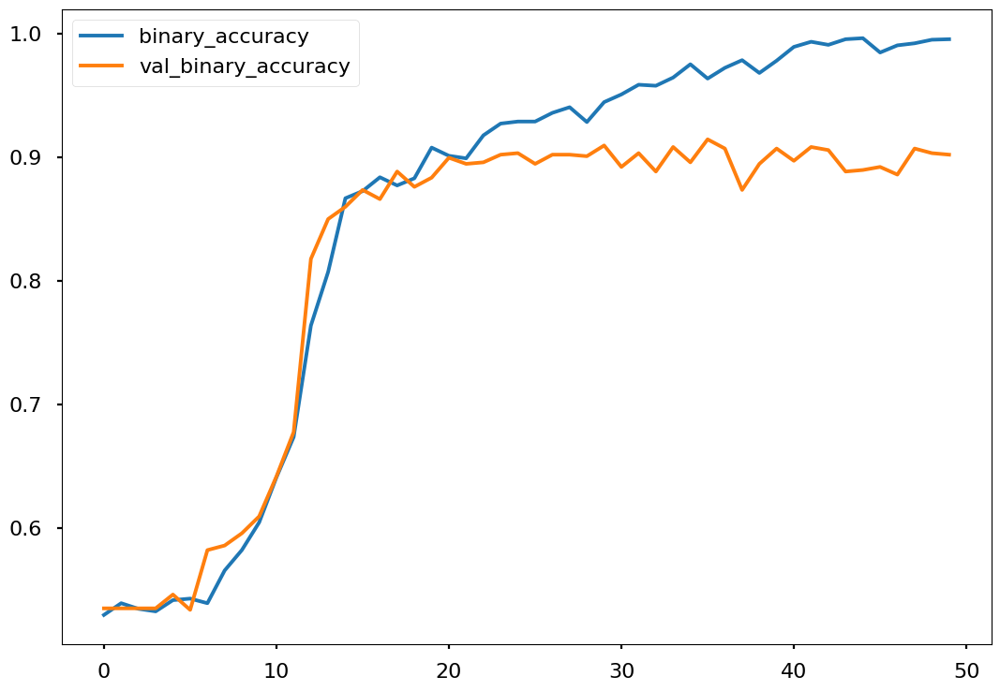

Epoch 1/50
19/19 [==============================] - 13s 424ms/step - loss: 0.6932 - binary_accuracy: 0.5225 - precision_40: 0.5318 - recall_40: 0.9090 - specificity: 0.4814 - f1_m: 0.6661 - val_loss: 0.6917 - val_binary_accuracy: 0.5353 - val_precision_40: 0.5353 - val_recall_40: 1.0000 - val_specificity: 0.4895 - val_f1_m: 0.7006
Epoch 2/50
19/19 [==============================] - 7s 396ms/step - loss: 0.6909 - binary_accuracy: 0.5341 - precision_40: 0.5352 - recall_40: 0.9915 - specificity: 0.4767 - f1_m: 0.6947 - val_loss: 0.6894 - val_binary_accuracy: 0.5353 - val_precision_40: 0.5353 - val_recall_40: 1.0000 - val_specificity: 0.4680 - val_f1_m: 0.7006
Epoch 3/50
19/19 [==============================] - 8s 404ms/step - loss: 0.6876 - binary_accuracy: 0.5349 - precision_40: 0.5363 - recall_40: 0.9745 - specificity: 0.4579 - f1_m: 0.6911 - val_loss: 0.6836 - val_binary_accuracy: 0.5353 - val_precision_40: 0.5353 - val_recall_40: 1.0000 - val_specificity: 0.4798 - val_f1_m: 0.7006
Epo

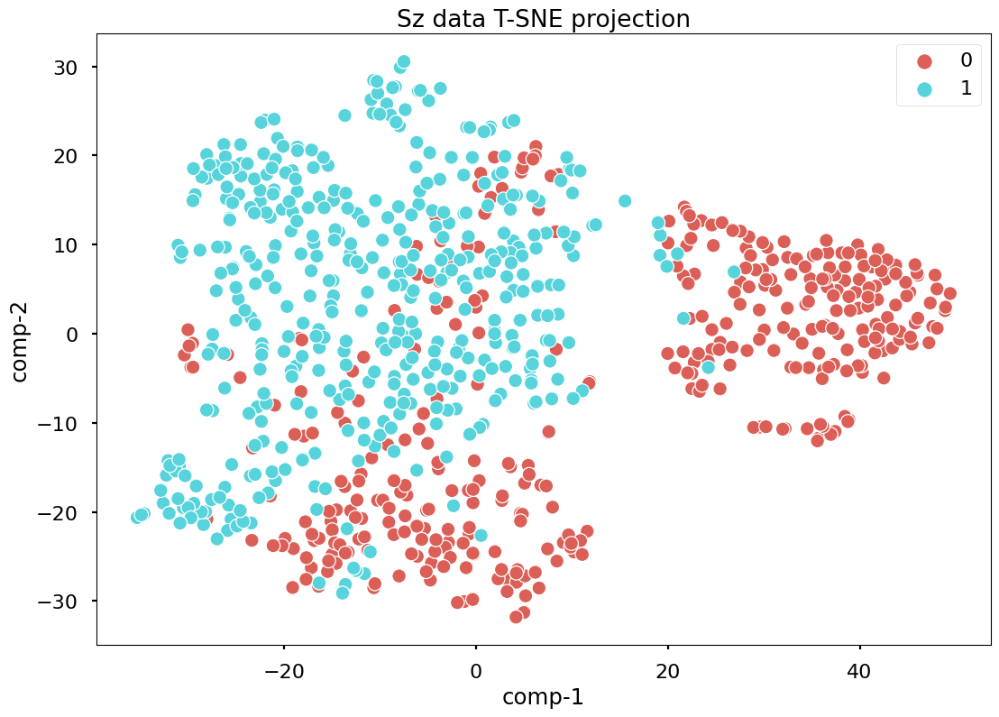

26/26 [==============================] - 1s 29ms/step


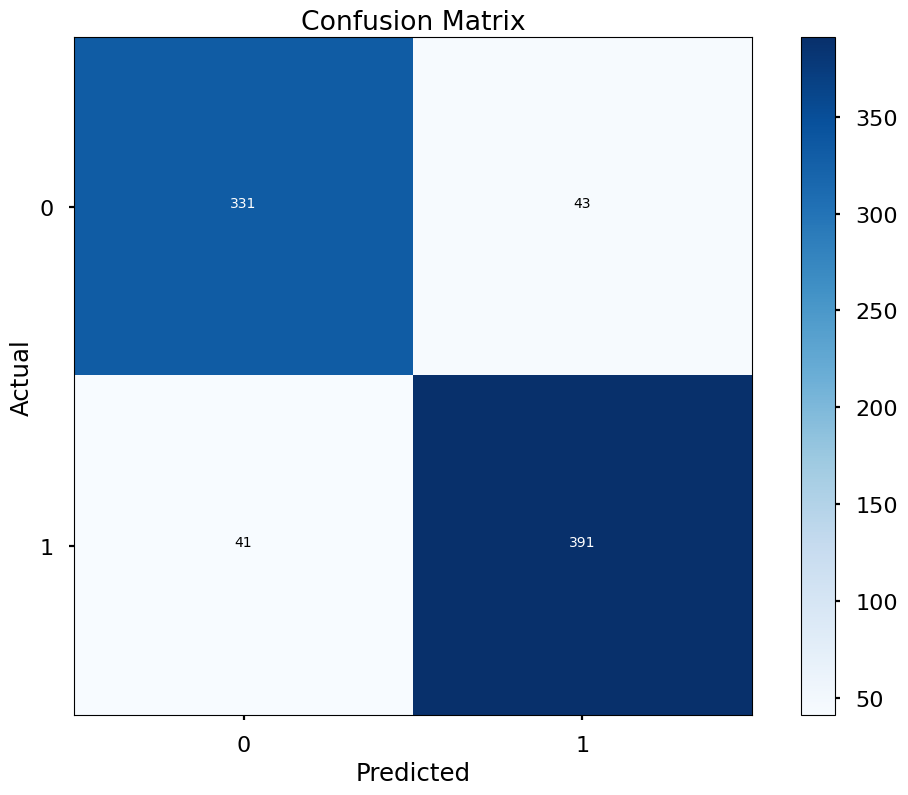

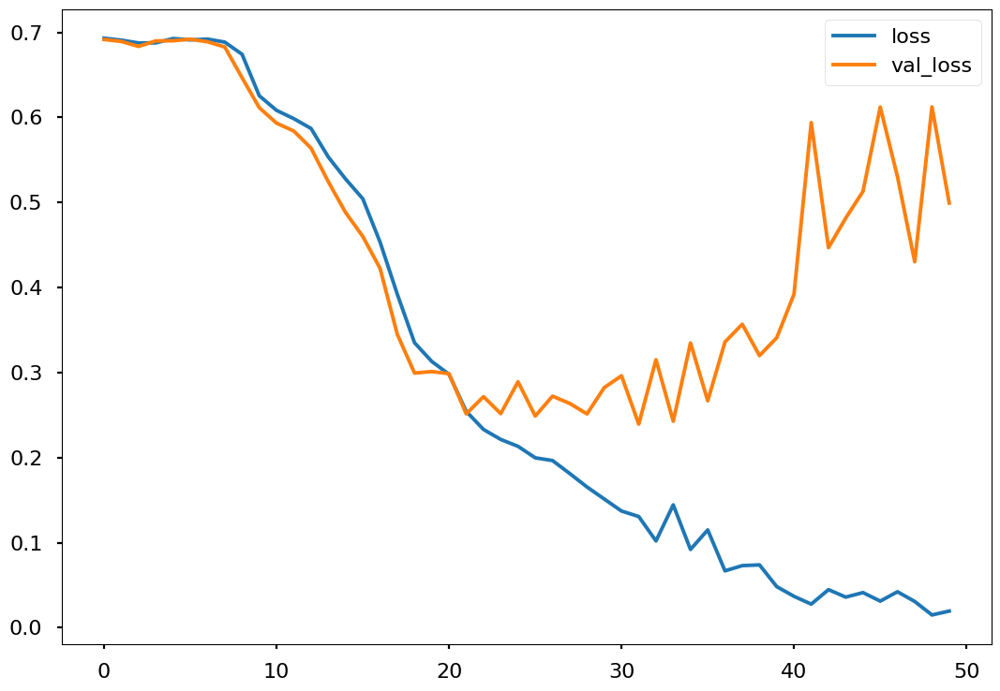

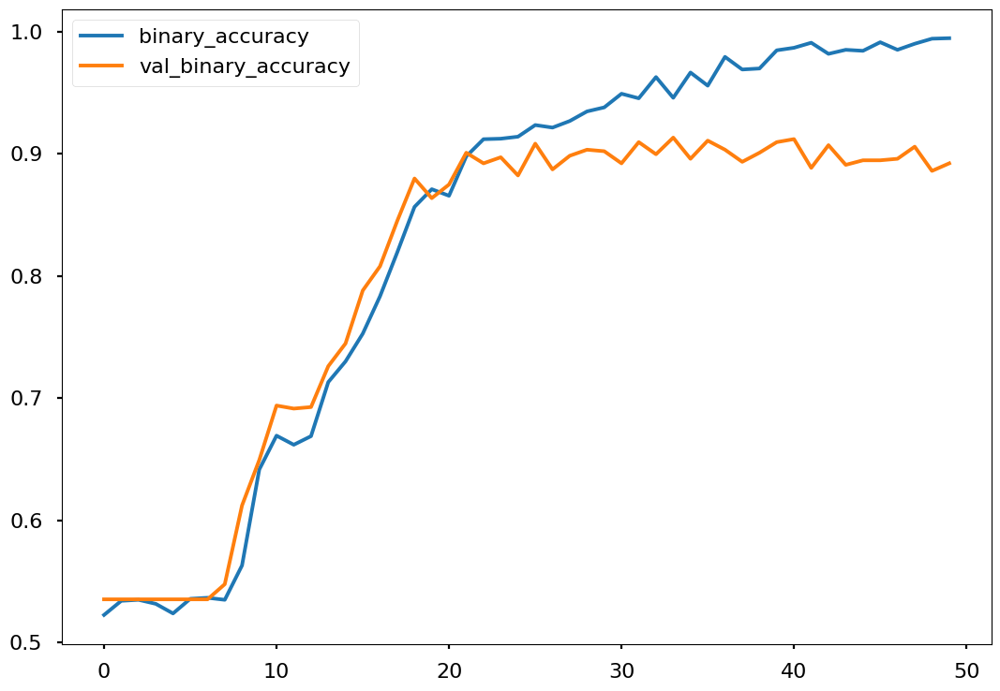

Epoch 1/50
19/19 [==============================] - 13s 430ms/step - loss: 0.6930 - binary_accuracy: 0.5325 - precision_42: 0.5364 - recall_42: 0.9390 - specificity: 0.4693 - f1_m: 0.6809 - val_loss: 0.6915 - val_binary_accuracy: 0.5353 - val_precision_42: 0.5353 - val_recall_42: 1.0000 - val_specificity: 0.4872 - val_f1_m: 0.6899
Epoch 2/50
19/19 [==============================] - 8s 400ms/step - loss: 0.6917 - binary_accuracy: 0.5308 - precision_42: 0.5346 - recall_42: 0.9591 - specificity: 0.4879 - f1_m: 0.6851 - val_loss: 0.6903 - val_binary_accuracy: 0.5353 - val_precision_42: 0.5353 - val_recall_42: 1.0000 - val_specificity: 0.4702 - val_f1_m: 0.6899
Epoch 3/50
19/19 [==============================] - 8s 410ms/step - loss: 0.6911 - binary_accuracy: 0.5333 - precision_42: 0.5348 - recall_42: 0.9892 - specificity: 0.4623 - f1_m: 0.6935 - val_loss: 0.6921 - val_binary_accuracy: 0.5353 - val_precision_42: 0.5353 - val_recall_42: 1.0000 - val_specificity: 0.4920 - val_f1_m: 0.6899
Epo

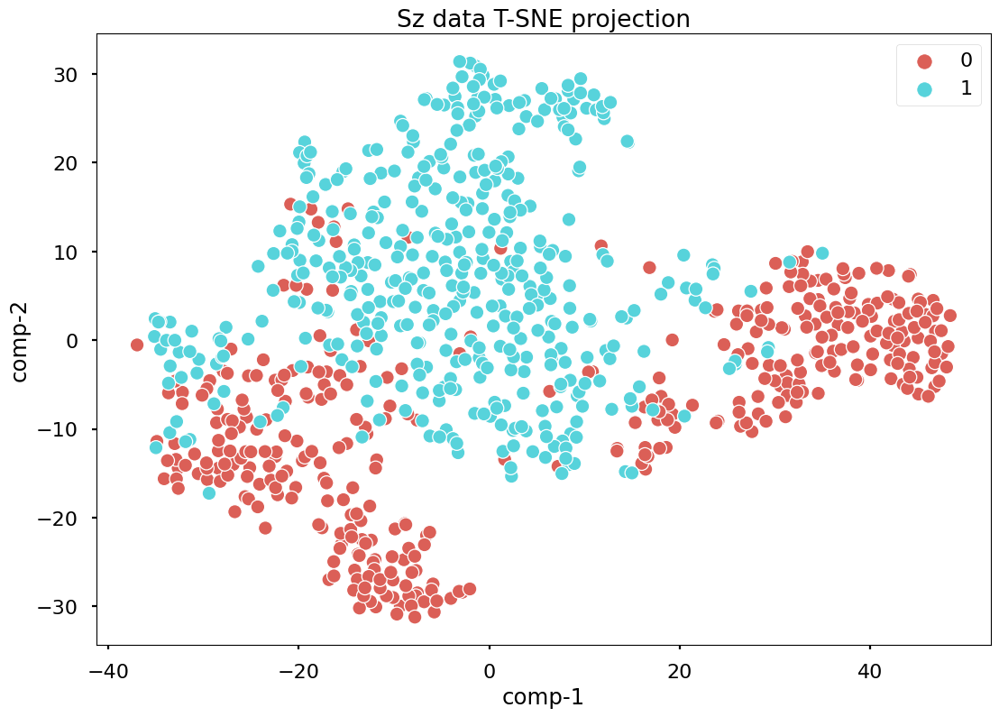

26/26 [==============================] - 1s 29ms/step


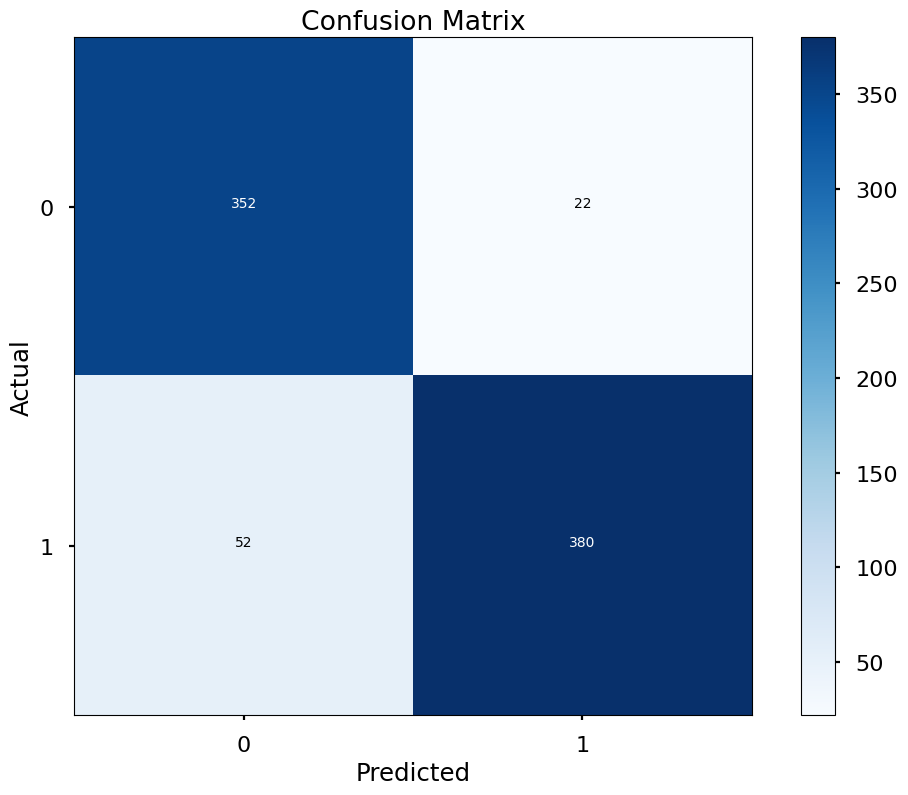

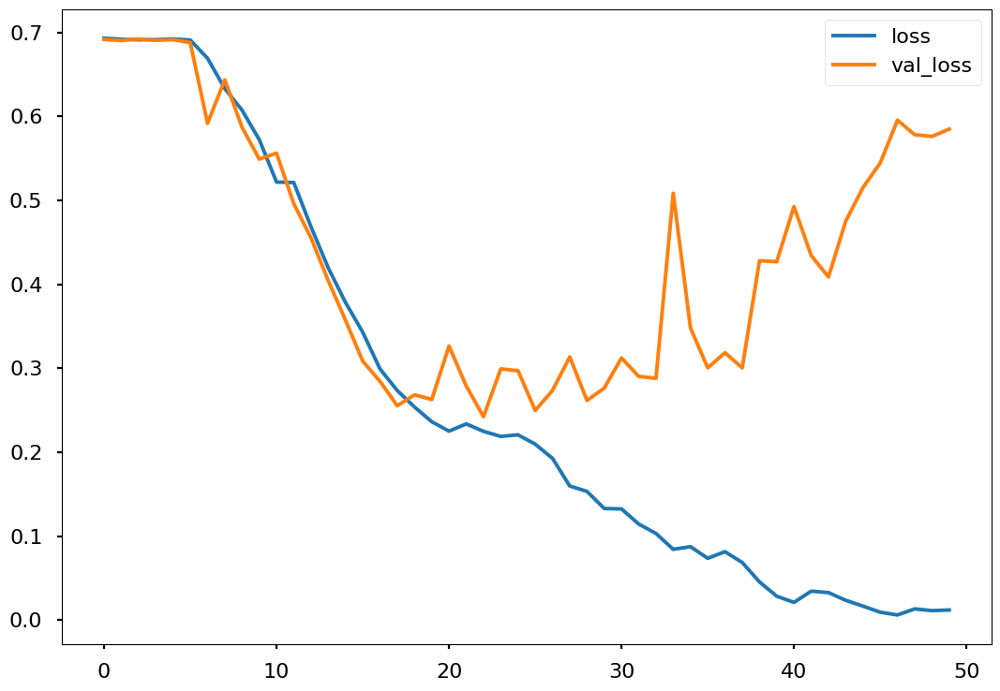

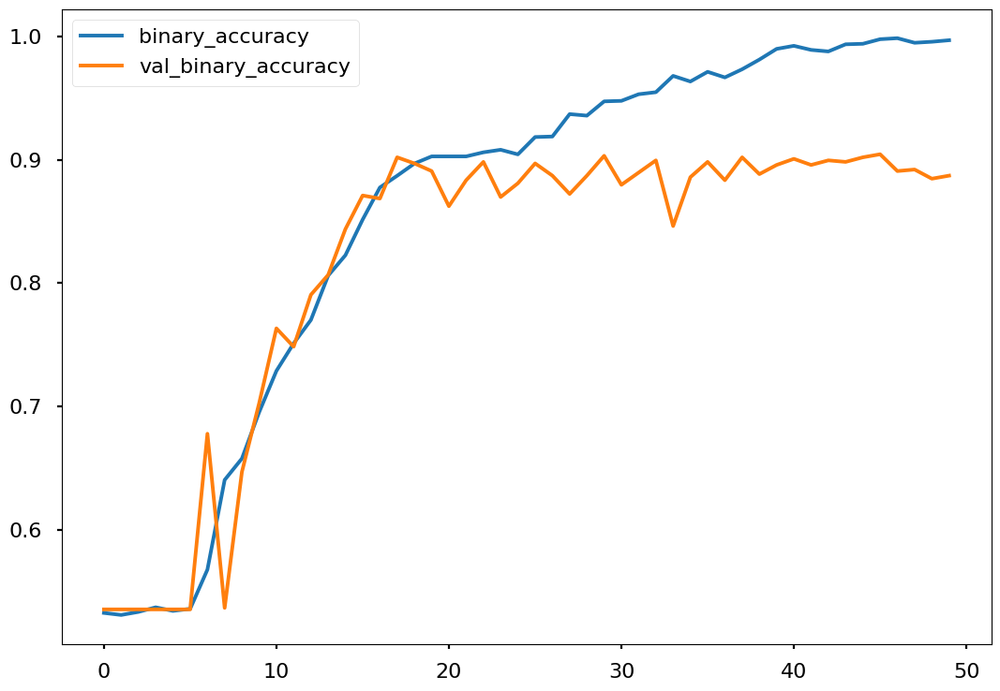

In [ ]:
# order 5 (4 - 45), AdamW, Notched 50Hz, SPWVD, 20 sec segments, z score

accuracy = []
precision = []
recall = []
spec = []
f1 = []

i = 1

for train_index, test_index in Skf.split(nspec_data_array, labels_array):
    optimizer1 = Adam(learning_rate=0.0001)
    optimizer2 = RMSprop(learning_rate=0.00001)
    optimizer3 = SGD(learning_rate=0.0001)
    optimizer4 = Adafactor(learning_rate=0.0001)
    optimizer5 = AdamW(learning_rate=0.0001)

    train_features, train_labels = nspec_data_array[train_index], labels_array[train_index]
    test_features, test_labels = nspec_data_array[test_index], labels_array[test_index]

    train_features, val_features, train_labels, val_labels = train_test_split(train_features, train_labels, test_size=0.25, stratify=train_labels)

    model = Vgg16_model((112, 112, 3))
    tmod = model[1]
    model = model[0]
    model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])
    tmod.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

    history = model.fit(
        train_features, train_labels,
        epochs = 50,
        batch_size = 128,
        validation_data = (val_features,val_labels),
        #callbacks=[early_stopping]
    )

    res = model.evaluate(test_features,test_labels)

    pred_tmod = tmod.predict(test_features)

    tsne = TSNE(n_components=2)
    print(pred_tmod.shape)
    if len(pred_tmod.shape)==4:
        z = tsne.fit_transform(pred_tmod.reshape(pred_tmod.shape[0], pred_tmod.shape[1]*pred_tmod.shape[2]*pred_tmod.shape[3]))
    elif len(pred_tmod.shape)==3:
        z = tsne.fit_transform(pred_tmod.reshape(pred_tmod.shape[0], pred_tmod.shape[1]*pred_tmod.shape[2]))
    else:
        z = tsne.fit_transform(pred_tmod.reshape(pred_tmod.shape[0], pred_tmod.shape[1]))
    df = pd.DataFrame()
    df["y"] = test_labels
    df["comp-1"] = z[:,0]
    df["comp-2"] = z[:,1]

    sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
            palette=sns.color_palette("hls", 2),
            data=df).set(title="Sz data T-SNE projection")
    plt.show()

    y_pred = model.predict(test_features)
    y_test = test_labels.astype(int).tolist()
    y_pred = np.round(y_pred).tolist()

    cm = confusion_matrix(y_test, y_pred)
    plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
    plt.colorbar()
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    tick_marks = np.arange(len(set(y_test))) # length of classes
    class_labels = ['0','1']
    tick_marks
    plt.xticks(tick_marks,class_labels)
    plt.yticks(tick_marks,class_labels)
    # plotting text value inside cells
    thresh = cm.max() / 2.
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
    plt.show();

    accuracy.append(res[1])
    precision.append(res[2])
    recall.append(res[3])

    history_frame = pd.DataFrame(history.history)
    history_frame.loc[:, ['loss', 'val_loss']].plot()
    history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
    plt.show()

In [ ]:
print(sum(accuracy)/len(accuracy)), print(sum(precision)/len(accuracy)), print(sum(recall)/len(accuracy)), print(sum(spec)/len(accuracy)), print(sum(f1)/len(accuracy))

0.8943456888198853
0.8981159806251526
0.9069444417953492
0.0
0.0


(None, None, None, None, None)

Epoch 1/50
19/19 [==============================] - 12s 419ms/step - loss: 0.8967 - binary_accuracy: 0.4988 - precision_2: 0.5296 - recall_2: 0.5802 - specificity: 0.4620 - f1_m: 0.5372 - val_loss: 0.6921 - val_binary_accuracy: 0.5204 - val_precision_2: 0.9412 - val_recall_2: 0.1111 - val_specificity: 0.5083 - val_f1_m: 0.2076
Epoch 2/50
19/19 [==============================] - 8s 404ms/step - loss: 0.6957 - binary_accuracy: 0.5302 - precision_2: 0.5462 - recall_2: 0.7299 - specificity: 0.4701 - f1_m: 0.6246 - val_loss: 0.6871 - val_binary_accuracy: 0.5353 - val_precision_2: 0.5353 - val_recall_2: 1.0000 - val_specificity: 0.4670 - val_f1_m: 0.6989
Epoch 3/50
19/19 [==============================] - 8s 405ms/step - loss: 0.6904 - binary_accuracy: 0.5256 - precision_2: 0.5387 - recall_2: 0.8009 - specificity: 0.4674 - f1_m: 0.6416 - val_loss: 0.6818 - val_binary_accuracy: 0.5353 - val_precision_2: 0.5353 - val_recall_2: 1.0000 - val_specificity: 0.4614 - val_f1_m: 0.6989
Epoch 4/50
19/1

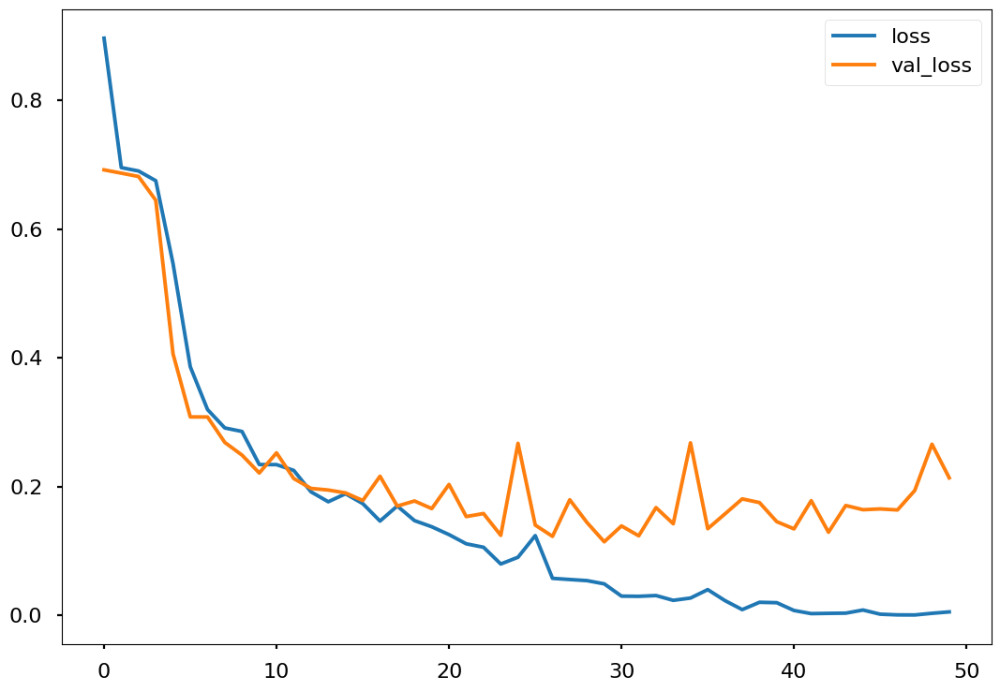

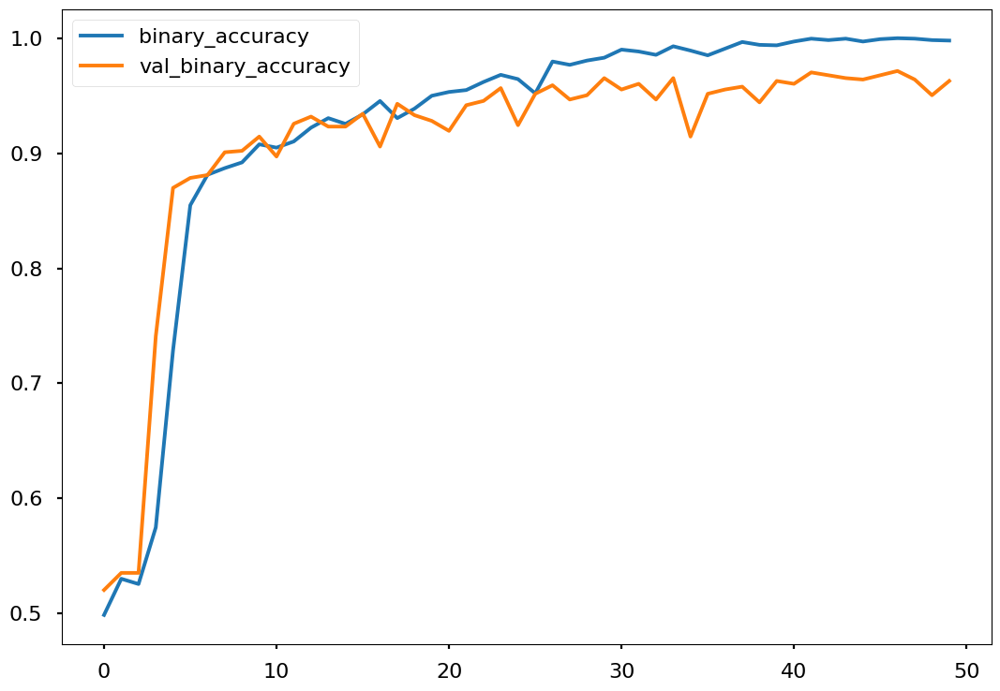

Epoch 1/50
19/19 [==============================] - 12s 402ms/step - loss: 0.8366 - binary_accuracy: 0.5199 - precision_3: 0.5458 - recall_3: 0.6204 - specificity: 0.4775 - f1_m: 0.5475 - val_loss: 0.6898 - val_binary_accuracy: 0.5353 - val_precision_3: 0.5353 - val_recall_3: 1.0000 - val_specificity: 0.4504 - val_f1_m: 0.7009
Epoch 2/50
19/19 [==============================] - 7s 380ms/step - loss: 0.6949 - binary_accuracy: 0.5248 - precision_3: 0.5417 - recall_3: 0.7361 - specificity: 0.4629 - f1_m: 0.6108 - val_loss: 0.6920 - val_binary_accuracy: 0.5353 - val_precision_3: 0.5353 - val_recall_3: 1.0000 - val_specificity: 0.4199 - val_f1_m: 0.7009
Epoch 3/50
19/19 [==============================] - 7s 383ms/step - loss: 0.6917 - binary_accuracy: 0.5405 - precision_3: 0.5461 - recall_3: 0.8457 - specificity: 0.4636 - f1_m: 0.6628 - val_loss: 0.6866 - val_binary_accuracy: 0.5353 - val_precision_3: 0.5353 - val_recall_3: 1.0000 - val_specificity: 0.4779 - val_f1_m: 0.7009
Epoch 4/50
19/1

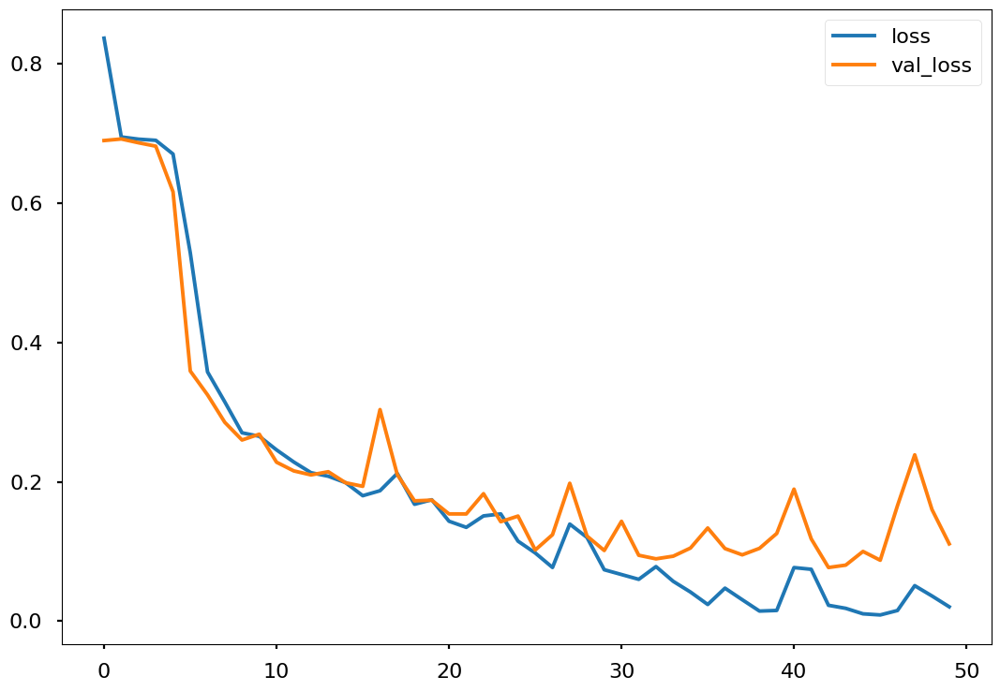

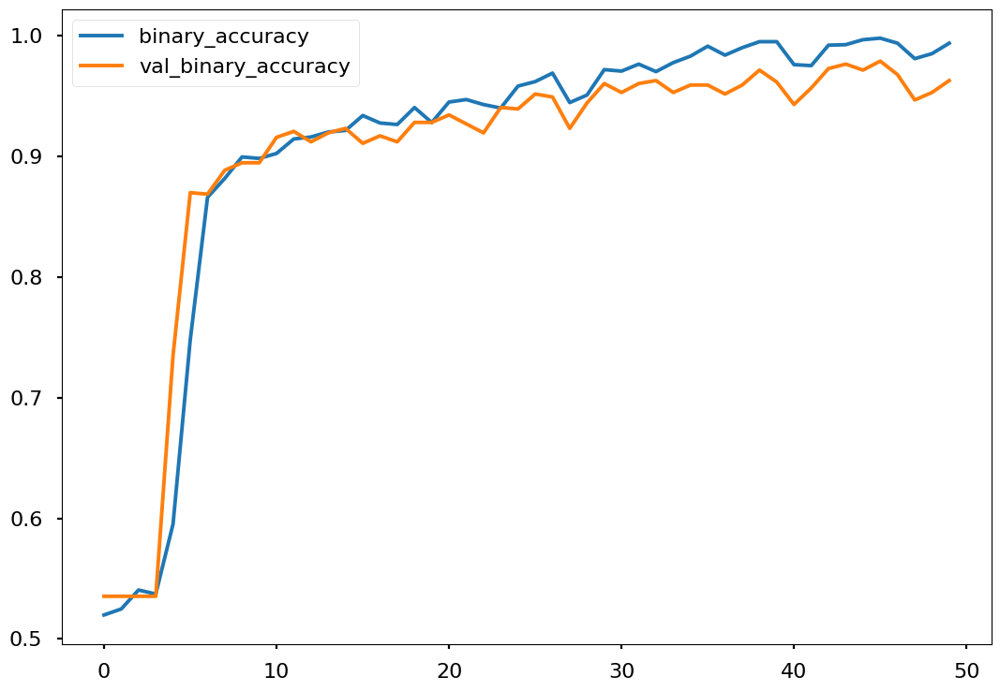

Epoch 1/50
19/19 [==============================] - 23s 1s/step - loss: 1.0750 - binary_accuracy: 0.5064 - precision_4: 0.5363 - recall_4: 0.5810 - specificity: 0.4819 - f1_m: 0.5389 - val_loss: 0.6897 - val_binary_accuracy: 0.5353 - val_precision_4: 0.5353 - val_recall_4: 1.0000 - val_specificity: 0.4844 - val_f1_m: 0.7000
Epoch 2/50
19/19 [==============================] - 7s 388ms/step - loss: 0.7012 - binary_accuracy: 0.4911 - precision_4: 0.5185 - recall_4: 0.7045 - specificity: 0.4643 - f1_m: 0.5940 - val_loss: 0.6891 - val_binary_accuracy: 0.5353 - val_precision_4: 0.5353 - val_recall_4: 1.0000 - val_specificity: 0.4903 - val_f1_m: 0.7000
Epoch 3/50
19/19 [==============================] - 7s 389ms/step - loss: 0.6905 - binary_accuracy: 0.5345 - precision_4: 0.5456 - recall_4: 0.7847 - specificity: 0.4647 - f1_m: 0.6361 - val_loss: 0.6896 - val_binary_accuracy: 0.5378 - val_precision_4: 0.9538 - val_recall_4: 0.1435 - val_specificity: 0.5085 - val_f1_m: 0.2383
Epoch 4/50
19/19 [

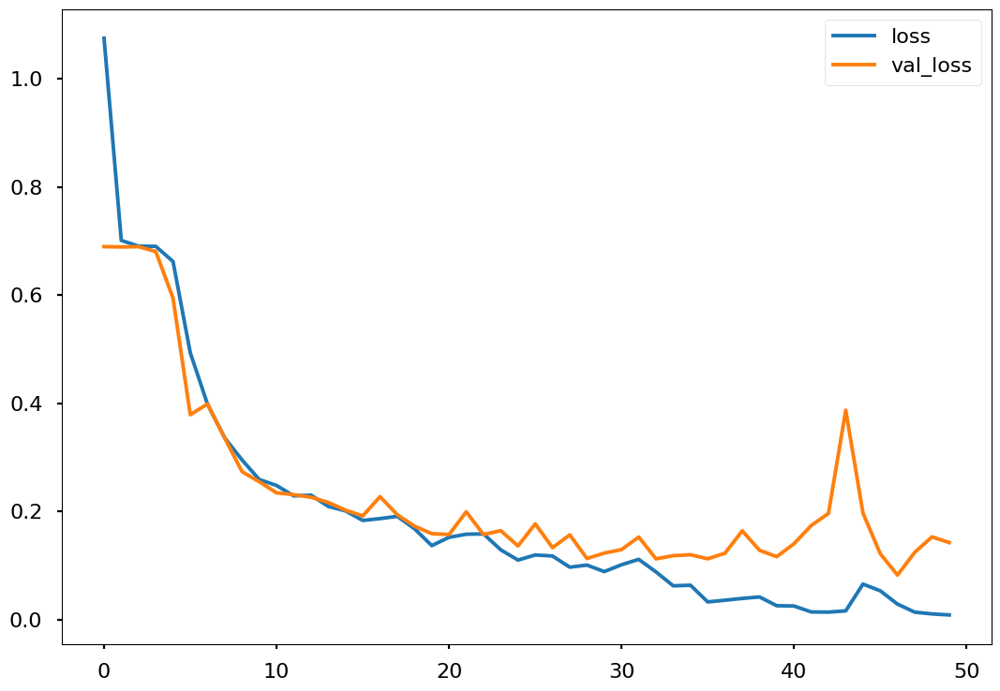

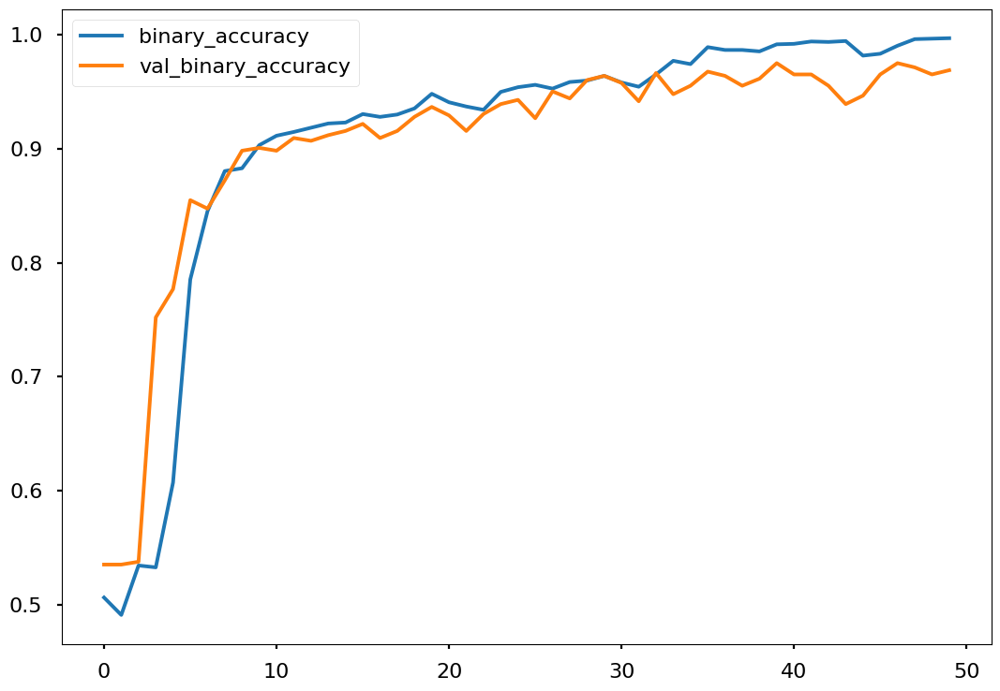

Epoch 1/50
19/19 [==============================] - 12s 407ms/step - loss: 0.8103 - binary_accuracy: 0.5031 - precision_5: 0.5297 - recall_5: 0.6466 - specificity: 0.4638 - f1_m: 0.5597 - val_loss: 0.6949 - val_binary_accuracy: 0.4647 - val_precision_5: 0.0000e+00 - val_recall_5: 0.0000e+00 - val_specificity: 0.5143 - val_f1_m: 0.0000e+00
Epoch 2/50
19/19 [==============================] - 7s 384ms/step - loss: 0.6942 - binary_accuracy: 0.5217 - precision_5: 0.5370 - recall_5: 0.7785 - specificity: 0.4687 - f1_m: 0.6347 - val_loss: 0.6901 - val_binary_accuracy: 0.5353 - val_precision_5: 0.5353 - val_recall_5: 1.0000 - val_specificity: 0.4761 - val_f1_m: 0.6969
Epoch 3/50
19/19 [==============================] - 7s 386ms/step - loss: 0.6928 - binary_accuracy: 0.5229 - precision_5: 0.5388 - recall_5: 0.7608 - specificity: 0.4686 - f1_m: 0.6215 - val_loss: 0.6908 - val_binary_accuracy: 0.5353 - val_precision_5: 0.5353 - val_recall_5: 1.0000 - val_specificity: 0.4890 - val_f1_m: 0.6969
Epo

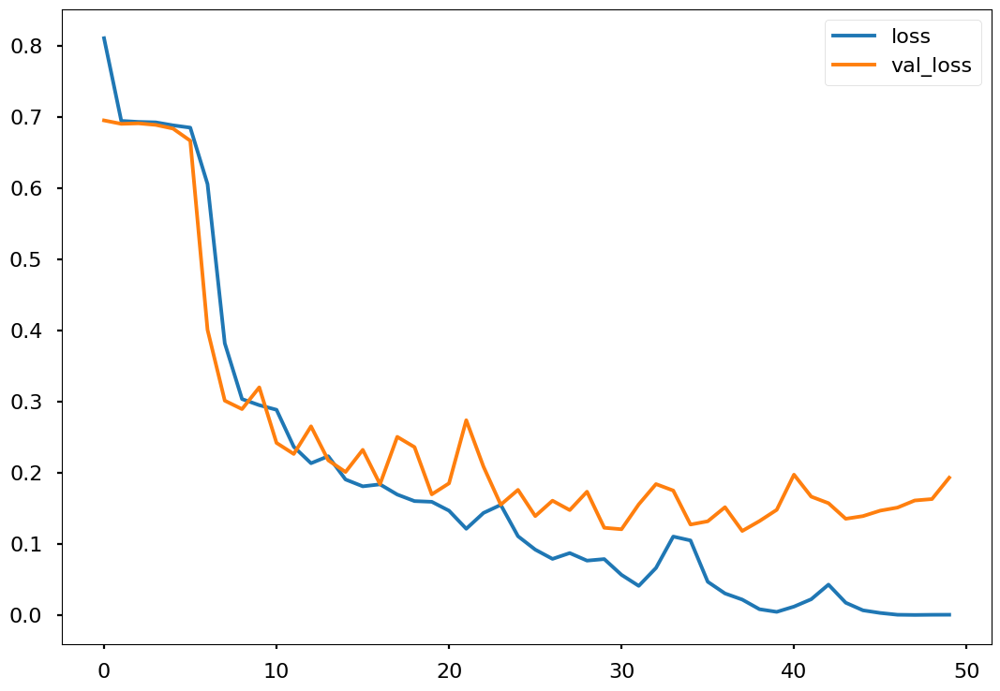

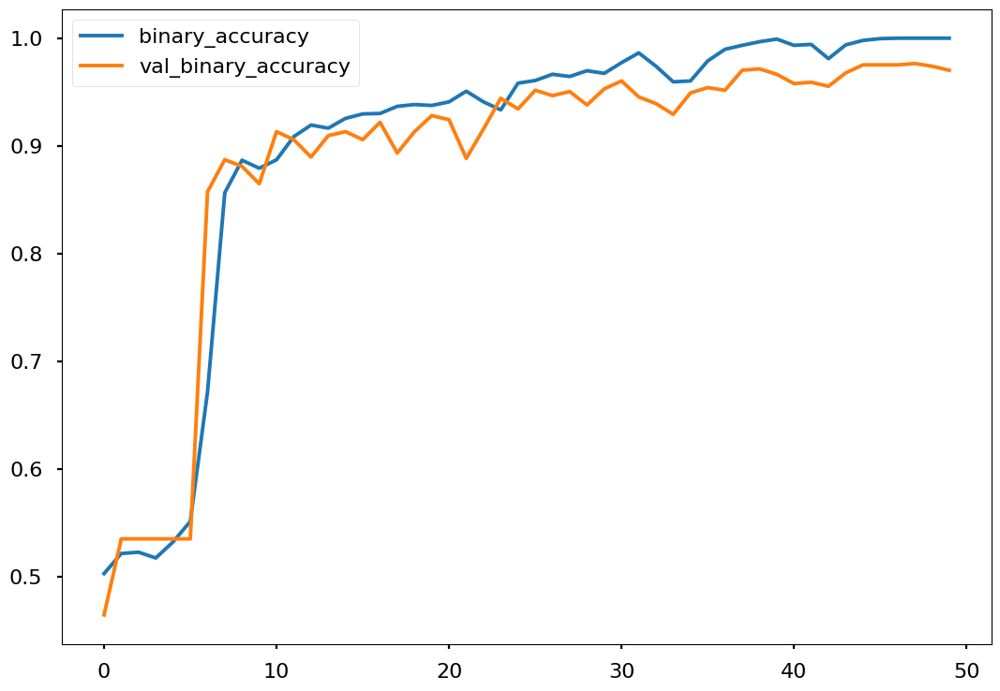

Epoch 1/50
19/19 [==============================] - 13s 404ms/step - loss: 0.8329 - binary_accuracy: 0.5056 - precision_6: 0.5338 - recall_6: 0.6088 - specificity: 0.4631 - f1_m: 0.5450 - val_loss: 0.6904 - val_binary_accuracy: 0.5353 - val_precision_6: 0.5353 - val_recall_6: 1.0000 - val_specificity: 0.4744 - val_f1_m: 0.6917
Epoch 2/50
19/19 [==============================] - 7s 385ms/step - loss: 0.6952 - binary_accuracy: 0.5151 - precision_6: 0.5389 - recall_6: 0.6582 - specificity: 0.4790 - f1_m: 0.5890 - val_loss: 0.6891 - val_binary_accuracy: 0.5353 - val_precision_6: 0.5353 - val_recall_6: 1.0000 - val_specificity: 0.4550 - val_f1_m: 0.6917
Epoch 3/50
19/19 [==============================] - 7s 387ms/step - loss: 0.6903 - binary_accuracy: 0.5258 - precision_6: 0.5402 - recall_6: 0.7716 - specificity: 0.4682 - f1_m: 0.6345 - val_loss: 0.6873 - val_binary_accuracy: 0.5353 - val_precision_6: 0.5353 - val_recall_6: 1.0000 - val_specificity: 0.4565 - val_f1_m: 0.6917
Epoch 4/50
19/1

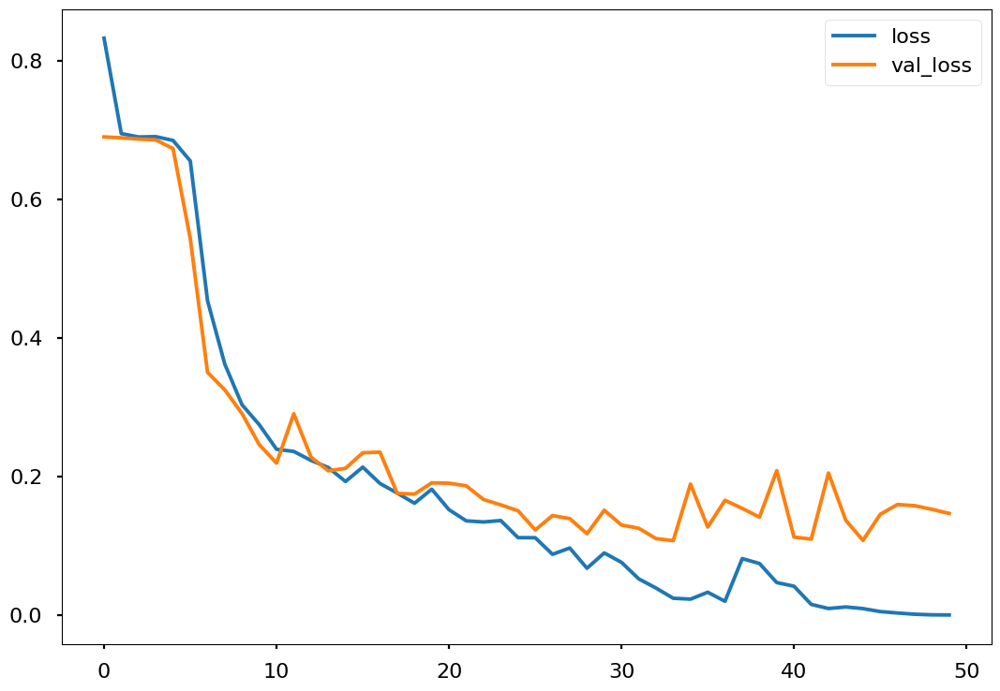

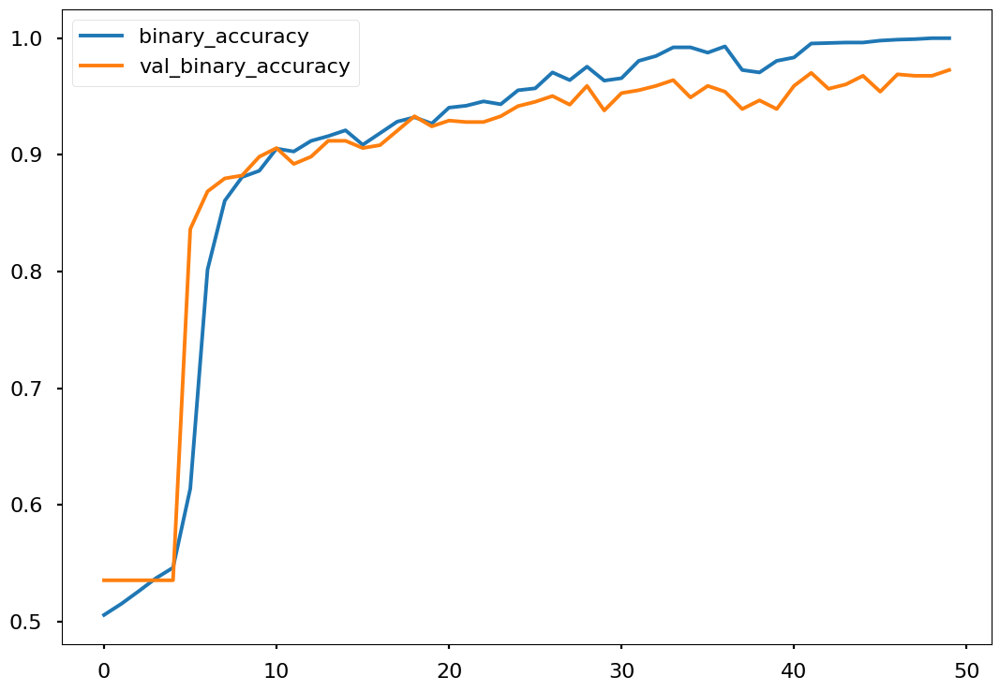

In [ ]:
# order 5 (4 - 45), AdamW, Notched 50Hz, Spectrograms, 20 sec segments, z score

accuracy = []
precision = []
recall = []
spec = []
f1 = []

i = 1

for train_index, test_index in Skf.split(nspec_data_array, labels_array):
    # if i<=1:
    #     i+=1
    #     continue
    optimizer1 = Adam(learning_rate=0.0001)
    optimizer2 = RMSprop(learning_rate=0.00001)
    optimizer3 = SGD(learning_rate=0.0001)
    optimizer4 = Adafactor(learning_rate=0.0001)
    optimizer5 = AdamW(learning_rate=0.0001)

    train_features, train_labels = nspec_data_array[train_index], labels_array[train_index]
    test_features, test_labels = nspec_data_array[test_index], labels_array[test_index]

    train_features, val_features, train_labels, val_labels = train_test_split(train_features, train_labels, test_size=0.25, stratify=train_labels)

    model = Vgg16_model((112, 112, 3))
    model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

    history = model.fit(
        train_features, train_labels,
        epochs = 50,
        batch_size = 128,
        validation_data = (val_features,val_labels),
        #callbacks=[early_stopping]
    )

    res = model.evaluate(test_features,test_labels)

    accuracy.append(res[1])
    precision.append(res[2])
    recall.append(res[3])
    spec.append(res[4])
    f1.append(res[5])

    history_frame = pd.DataFrame(history.history)
    history_frame.loc[:, ['loss', 'val_loss']].plot()
    history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
    plt.show()

    # break

In [ ]:
print(sum(accuracy)/len(accuracy)), print(sum(precision)/len(accuracy)), print(sum(recall)/len(accuracy)), print(sum(spec)/len(accuracy)), print(sum(f1)/len(accuracy))

0.9630460619926453
0.9714297533035279
0.9592592597007752
0.4452738404273987
0.5651383519172668


(None, None, None, None, None)

Epoch 1/50
19/19 [==============================] - 13s 426ms/step - loss: 0.6914 - binary_accuracy: 0.5339 - precision_44: 0.5367 - recall_44: 0.9545 - specificity: 0.4764 - f1_m: 0.6826 - val_loss: 0.6897 - val_binary_accuracy: 0.5353 - val_precision_44: 0.5353 - val_recall_44: 1.0000 - val_specificity: 0.4631 - val_f1_m: 0.6938
Epoch 2/50
19/19 [==============================] - 8s 405ms/step - loss: 0.6841 - binary_accuracy: 0.5455 - precision_44: 0.5422 - recall_44: 0.9769 - specificity: 0.4589 - f1_m: 0.6970 - val_loss: 0.6482 - val_binary_accuracy: 0.5353 - val_precision_44: 0.5353 - val_recall_44: 1.0000 - val_specificity: 0.4203 - val_f1_m: 0.6938
Epoch 3/50
19/19 [==============================] - 8s 415ms/step - loss: 0.5986 - binary_accuracy: 0.6555 - precision_44: 0.6595 - recall_44: 0.7384 - specificity: 0.5202 - f1_m: 0.6874 - val_loss: 0.5763 - val_binary_accuracy: 0.7175 - val_precision_44: 0.6609 - val_recall_44: 0.9699 - val_specificity: 0.4649 - val_f1_m: 0.7833
Epo

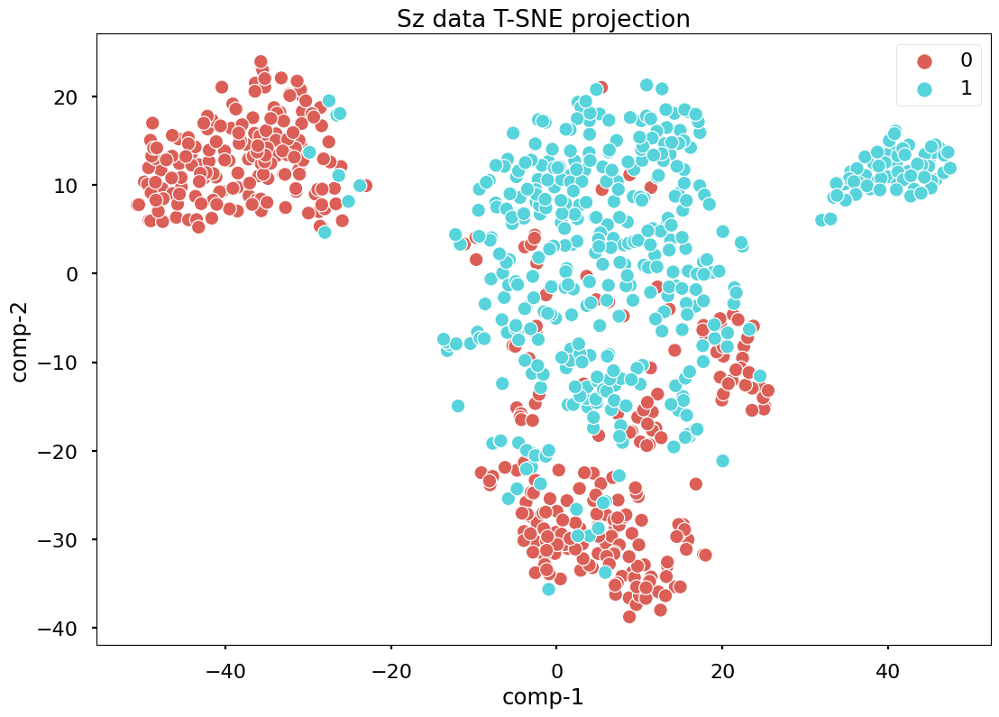

26/26 [==============================] - 1s 29ms/step


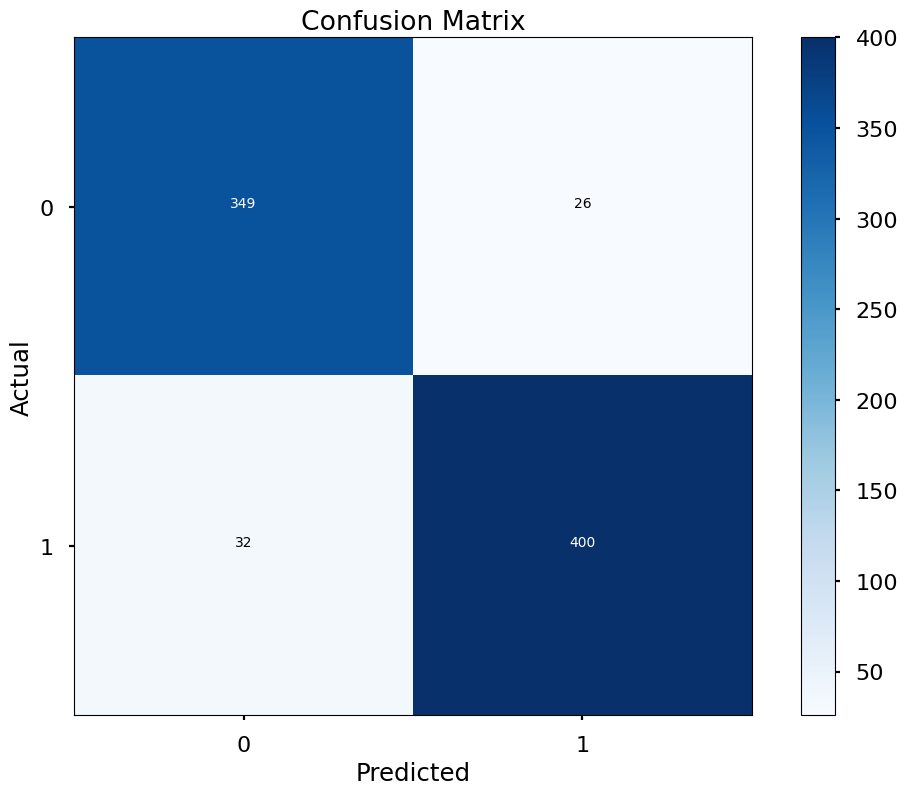

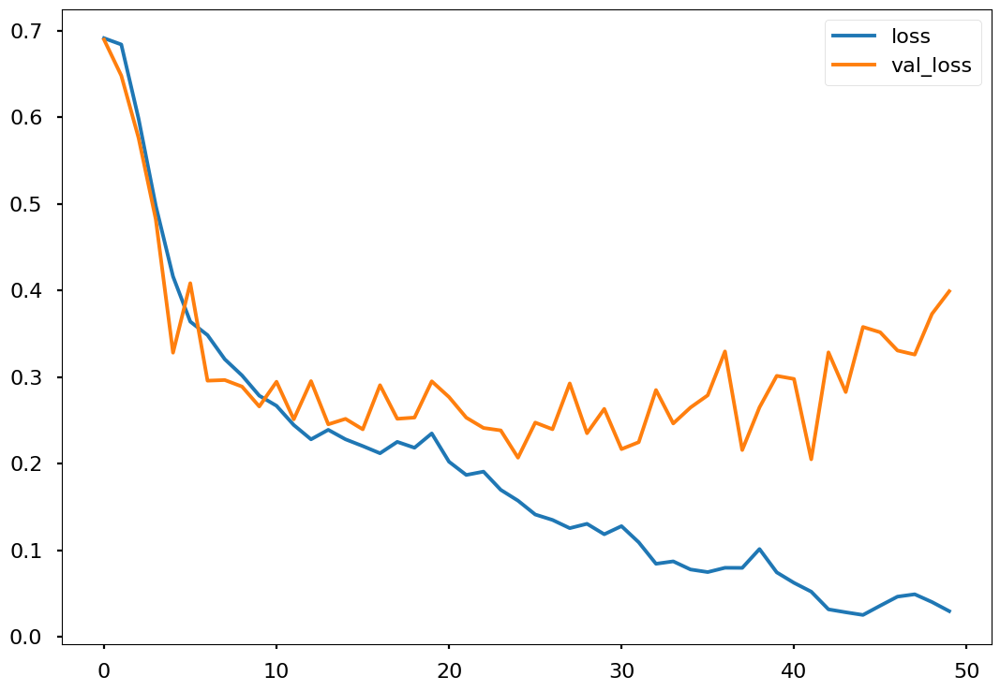

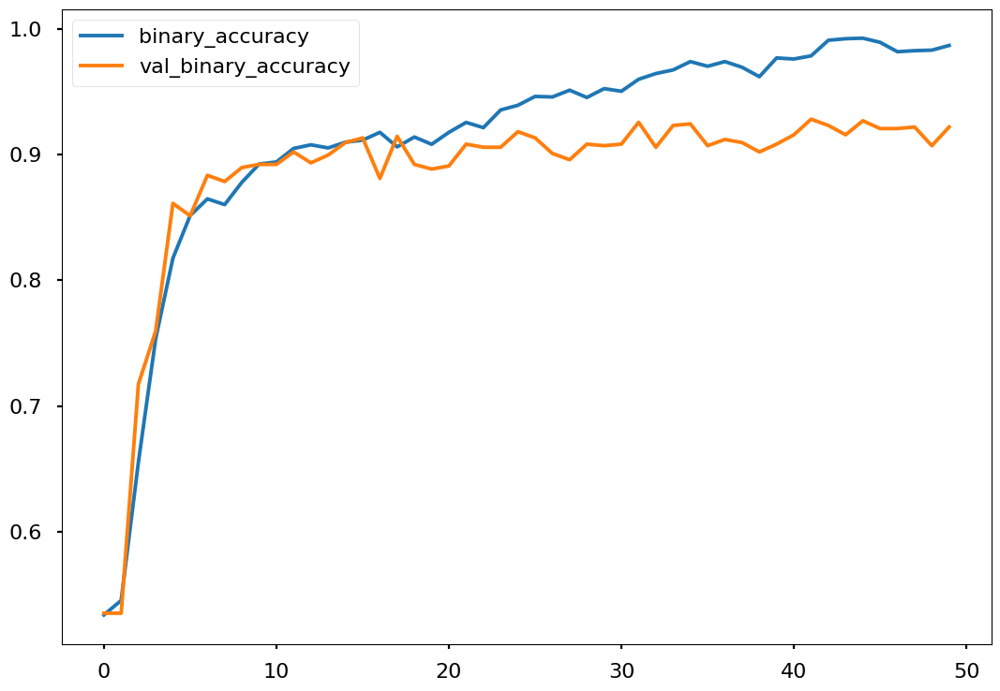

Epoch 1/50
19/19 [==============================] - 13s 421ms/step - loss: 0.6933 - binary_accuracy: 0.5269 - precision_46: 0.5427 - recall_46: 0.7446 - specificity: 0.4750 - f1_m: 0.5629 - val_loss: 0.6915 - val_binary_accuracy: 0.5353 - val_precision_46: 0.5353 - val_recall_46: 1.0000 - val_specificity: 0.4900 - val_f1_m: 0.6950
Epoch 2/50
19/19 [==============================] - 7s 395ms/step - loss: 0.6888 - binary_accuracy: 0.5356 - precision_46: 0.5358 - recall_46: 0.9992 - specificity: 0.4771 - f1_m: 0.6968 - val_loss: 0.6716 - val_binary_accuracy: 0.5353 - val_precision_46: 0.5353 - val_recall_46: 1.0000 - val_specificity: 0.4555 - val_f1_m: 0.6950
Epoch 3/50
19/19 [==============================] - 8s 404ms/step - loss: 0.6190 - binary_accuracy: 0.6377 - precision_46: 0.6131 - recall_46: 0.8781 - specificity: 0.4861 - f1_m: 0.7225 - val_loss: 0.4982 - val_binary_accuracy: 0.7299 - val_precision_46: 0.7892 - val_recall_46: 0.6759 - val_specificity: 0.6356 - val_f1_m: 0.7124
Epo

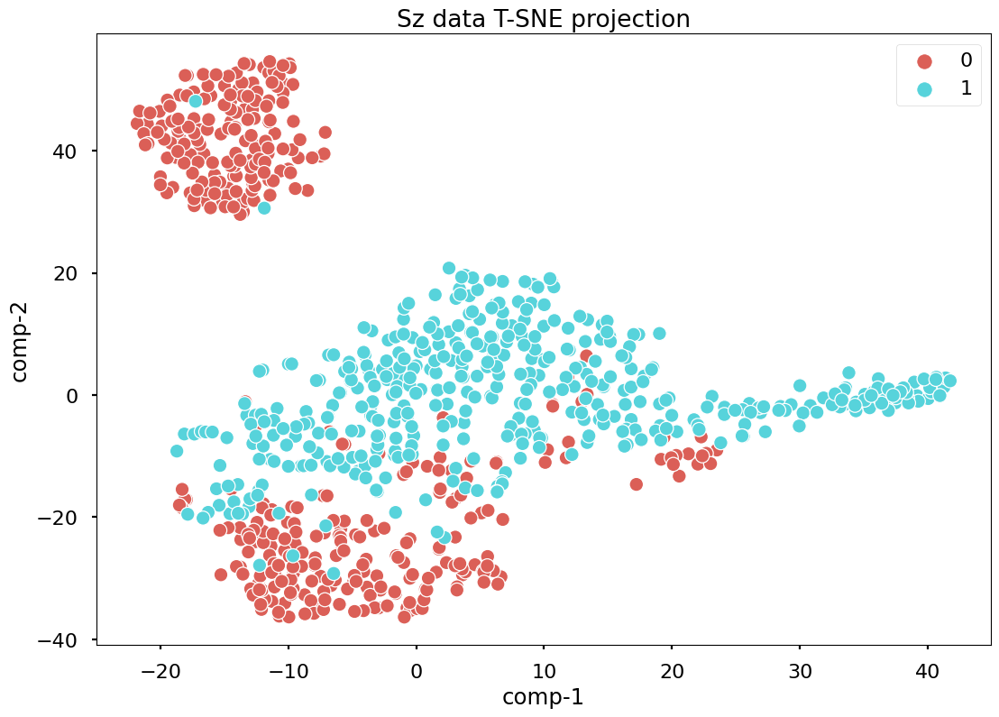

26/26 [==============================] - 1s 30ms/step


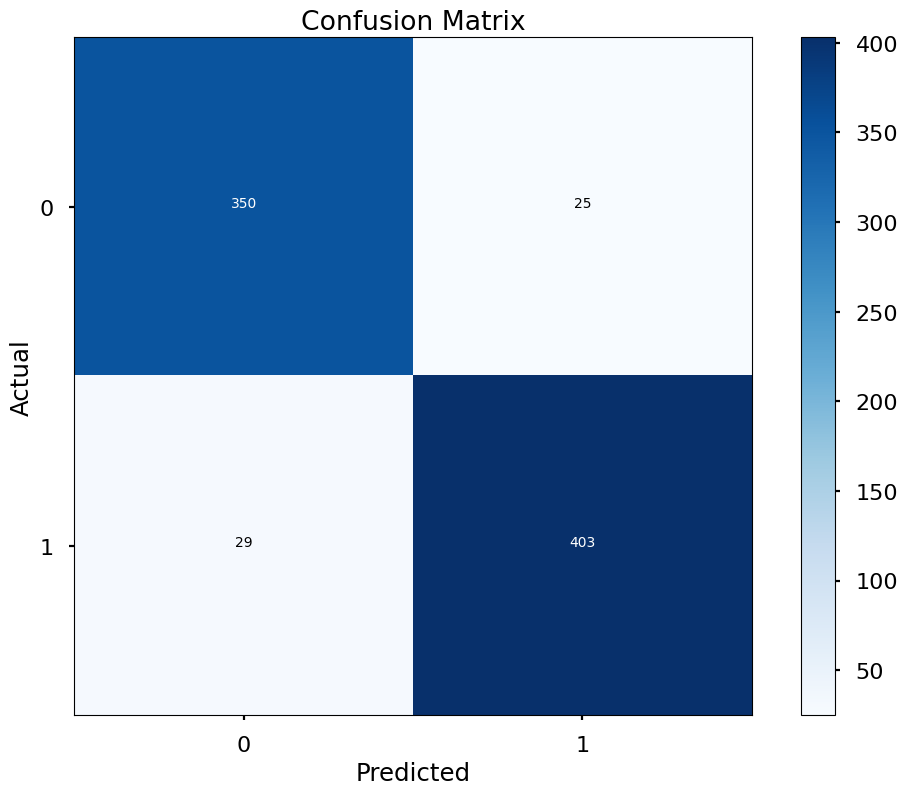

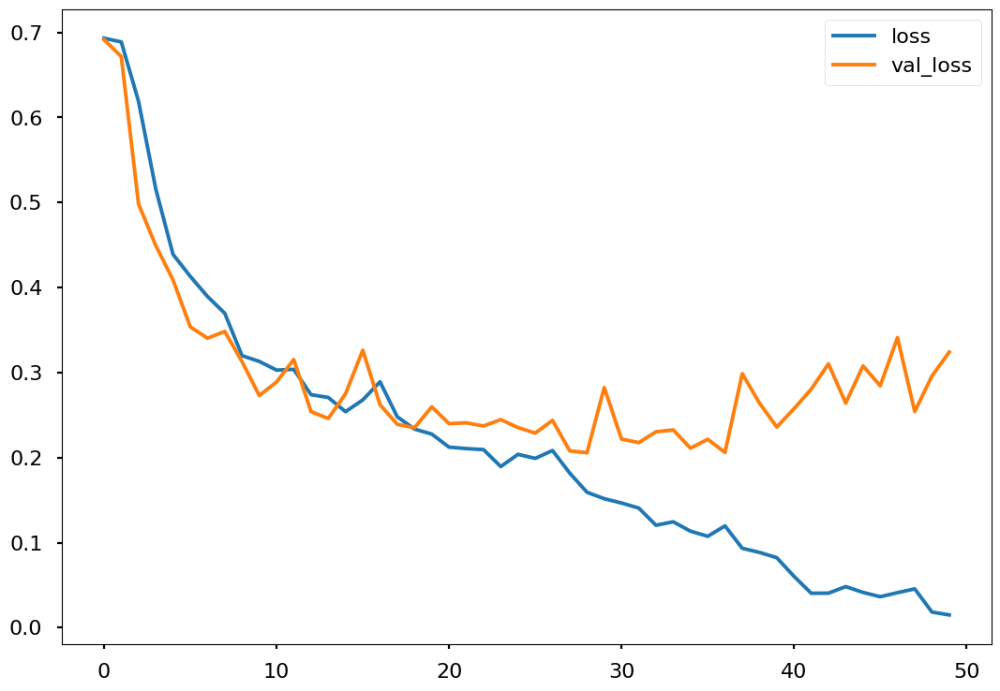

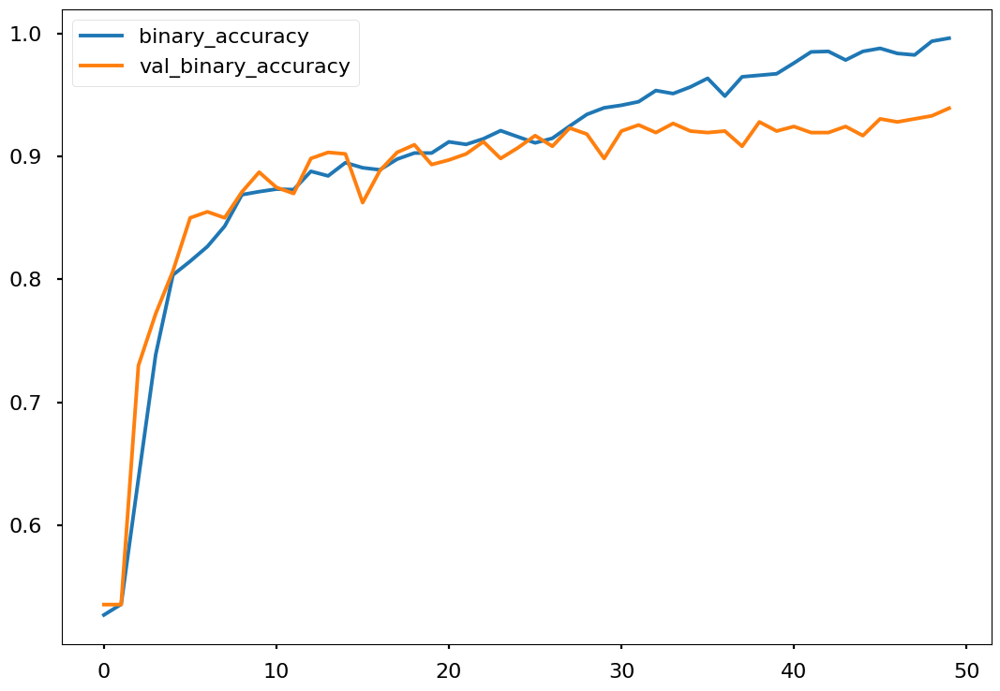

Epoch 1/50
19/19 [==============================] - 13s 464ms/step - loss: 0.6923 - binary_accuracy: 0.5258 - precision_48: 0.5365 - recall_48: 0.8457 - specificity: 0.4815 - f1_m: 0.6477 - val_loss: 0.6897 - val_binary_accuracy: 0.5353 - val_precision_48: 0.5353 - val_recall_48: 1.0000 - val_specificity: 0.4449 - val_f1_m: 0.6971
Epoch 2/50
19/19 [==============================] - 8s 397ms/step - loss: 0.6818 - binary_accuracy: 0.5391 - precision_48: 0.5377 - recall_48: 0.9954 - specificity: 0.4589 - f1_m: 0.6975 - val_loss: 0.6522 - val_binary_accuracy: 0.5415 - val_precision_48: 0.5387 - val_recall_48: 1.0000 - val_specificity: 0.4712 - val_f1_m: 0.6997
Epoch 3/50
19/19 [==============================] - 8s 407ms/step - loss: 0.5646 - binary_accuracy: 0.6916 - precision_48: 0.6706 - recall_48: 0.8341 - specificity: 0.5513 - f1_m: 0.7445 - val_loss: 0.5070 - val_binary_accuracy: 0.7224 - val_precision_48: 0.8421 - val_recall_48: 0.5926 - val_specificity: 0.6587 - val_f1_m: 0.6954
Epo

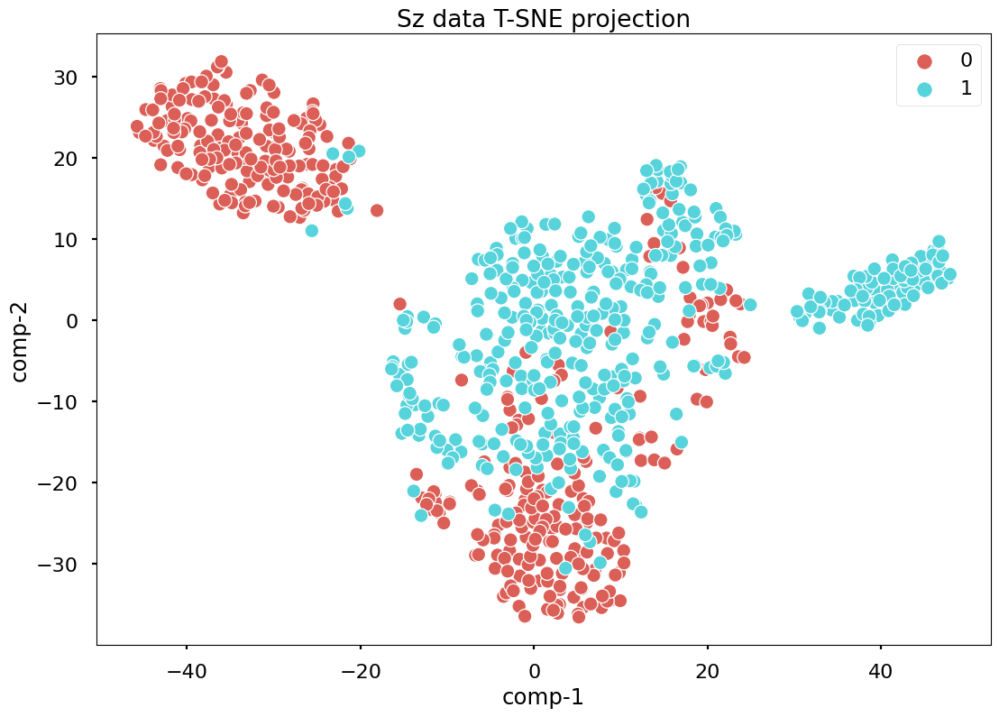

26/26 [==============================] - 1s 30ms/step


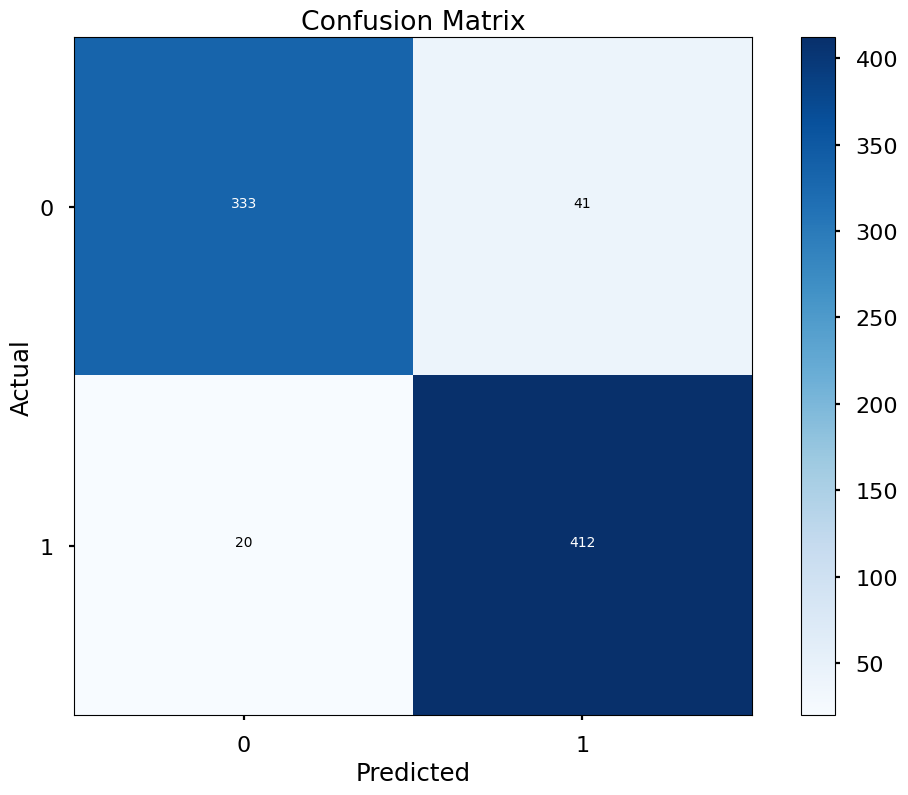

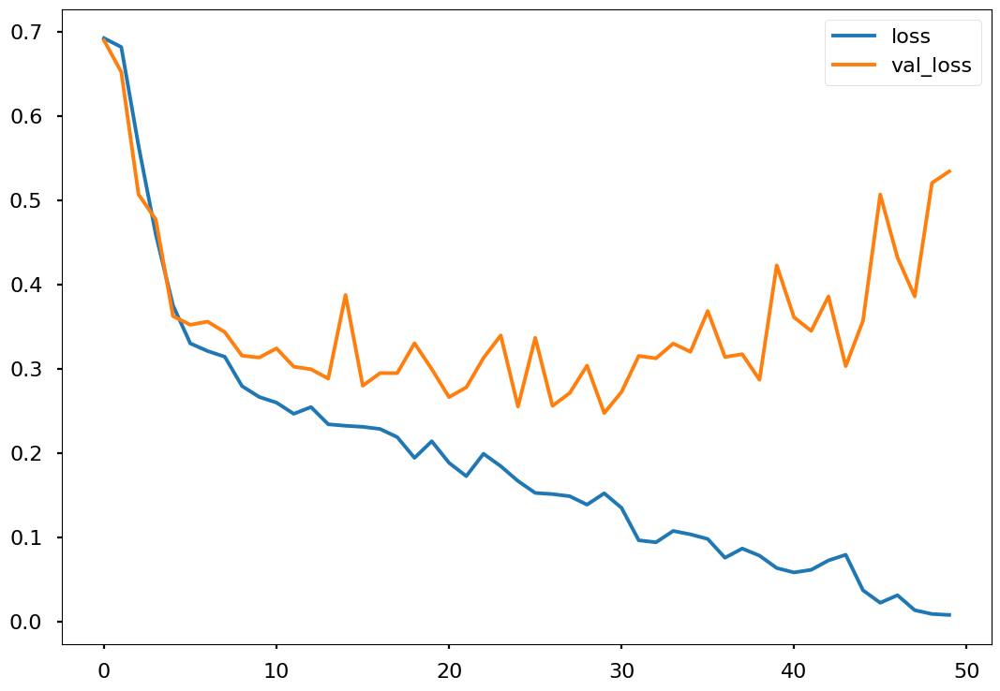

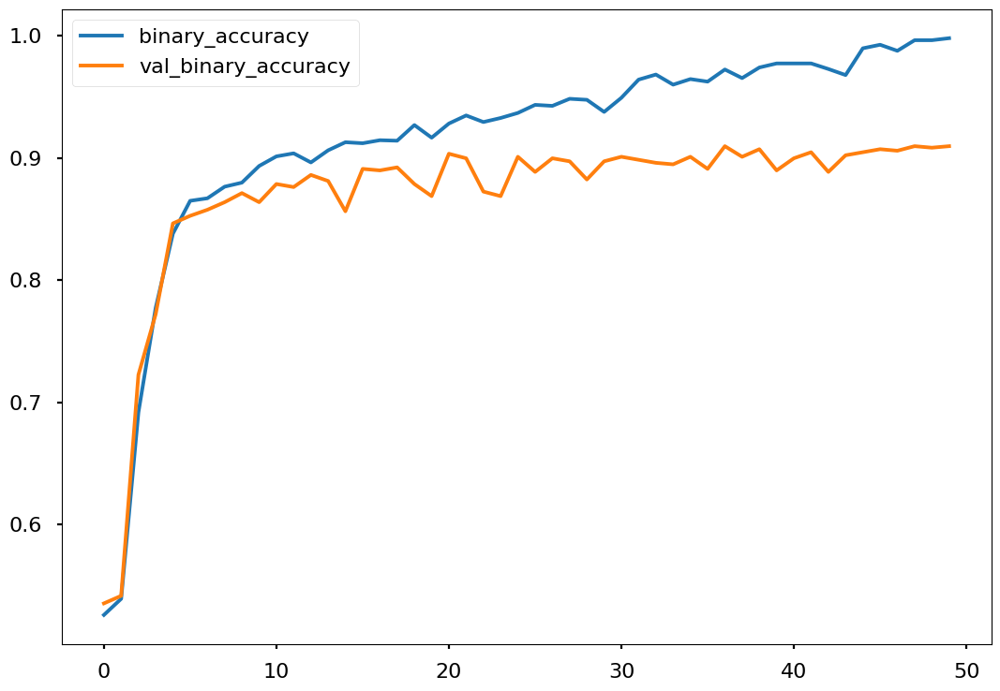

Epoch 1/50
19/19 [==============================] - 13s 425ms/step - loss: 0.6916 - binary_accuracy: 0.5353 - precision_50: 0.5375 - recall_50: 0.9522 - specificity: 0.4679 - f1_m: 0.6862 - val_loss: 0.6898 - val_binary_accuracy: 0.5353 - val_precision_50: 0.5353 - val_recall_50: 1.0000 - val_specificity: 0.4747 - val_f1_m: 0.6929
Epoch 2/50
19/19 [==============================] - 7s 394ms/step - loss: 0.6886 - binary_accuracy: 0.5370 - precision_50: 0.5368 - recall_50: 0.9907 - specificity: 0.4722 - f1_m: 0.6947 - val_loss: 0.6689 - val_binary_accuracy: 0.5353 - val_precision_50: 0.5353 - val_recall_50: 1.0000 - val_specificity: 0.4450 - val_f1_m: 0.6929
Epoch 3/50
19/19 [==============================] - 8s 404ms/step - loss: 0.6203 - binary_accuracy: 0.6098 - precision_50: 0.5896 - recall_50: 0.8935 - specificity: 0.4771 - f1_m: 0.7126 - val_loss: 0.5699 - val_binary_accuracy: 0.6853 - val_precision_50: 0.8272 - val_recall_50: 0.5208 - val_specificity: 0.5698 - val_f1_m: 0.6499
Epo

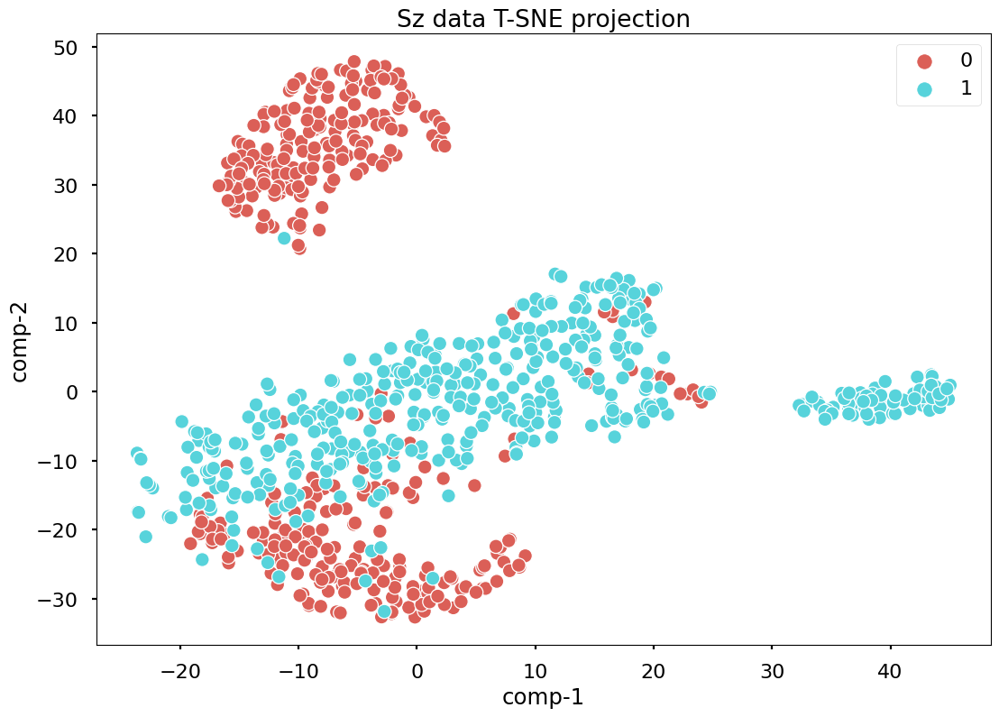

26/26 [==============================] - 1s 29ms/step


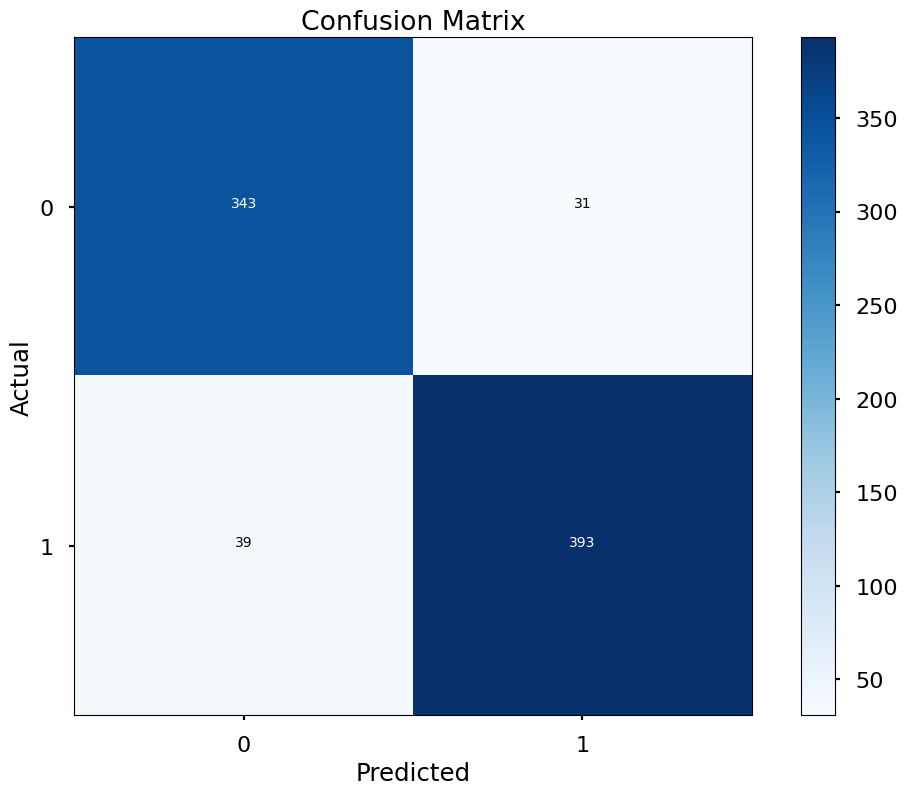

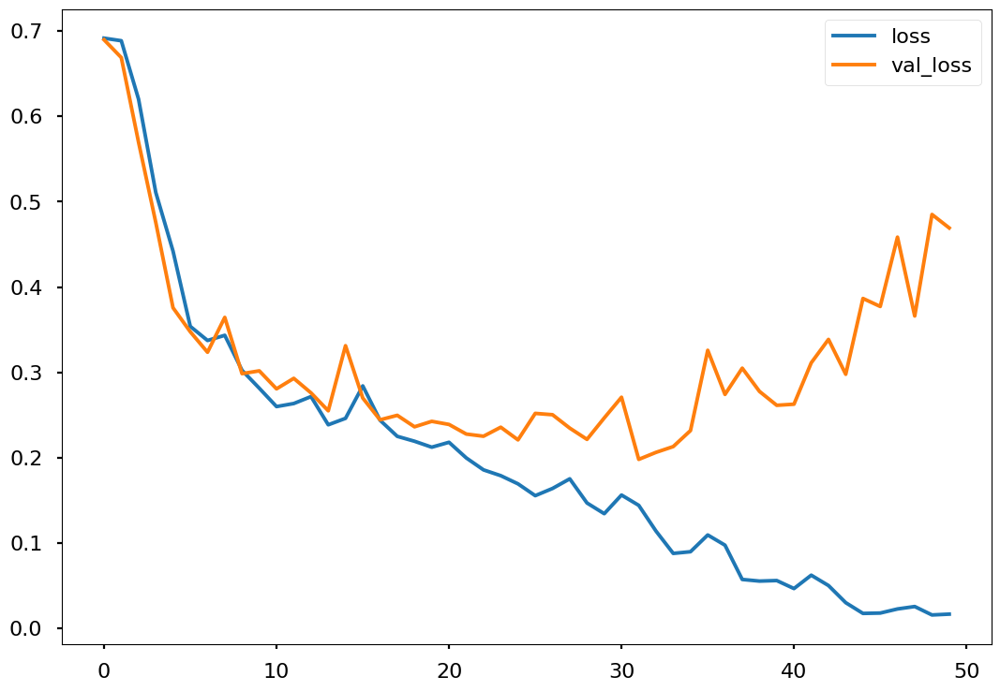

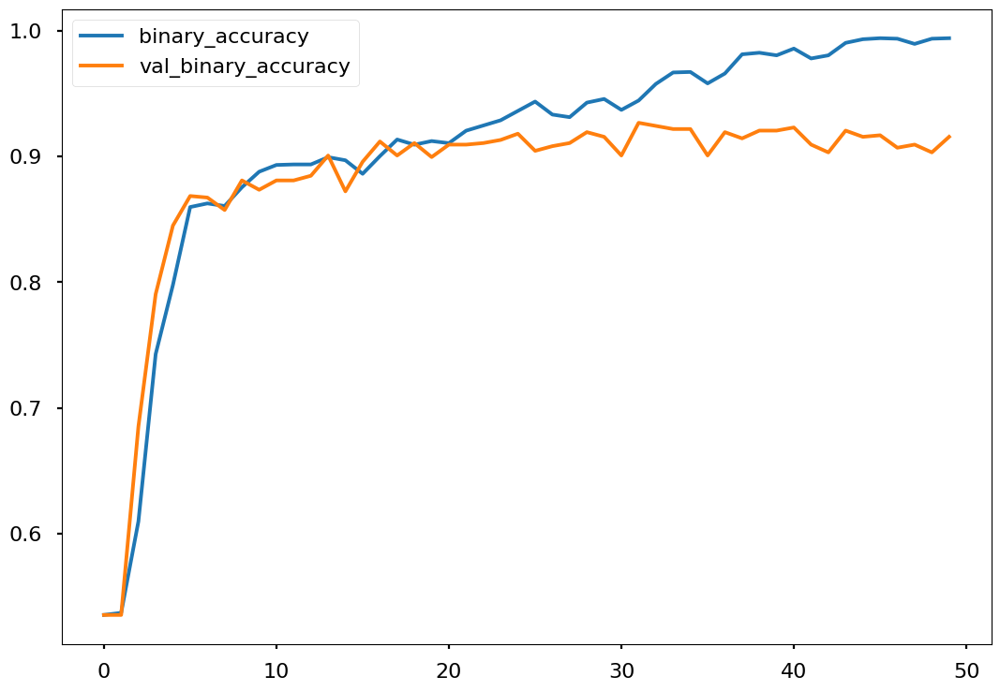

Epoch 1/50
19/19 [==============================] - 13s 422ms/step - loss: 0.6918 - binary_accuracy: 0.5242 - precision_52: 0.5329 - recall_52: 0.9059 - specificity: 0.4761 - f1_m: 0.6655 - val_loss: 0.6905 - val_binary_accuracy: 0.5353 - val_precision_52: 0.5353 - val_recall_52: 1.0000 - val_specificity: 0.4670 - val_f1_m: 0.6899
Epoch 2/50
19/19 [==============================] - 7s 394ms/step - loss: 0.6914 - binary_accuracy: 0.5291 - precision_52: 0.5334 - recall_52: 0.9684 - specificity: 0.4761 - f1_m: 0.6872 - val_loss: 0.6902 - val_binary_accuracy: 0.5353 - val_precision_52: 0.5353 - val_recall_52: 1.0000 - val_specificity: 0.4666 - val_f1_m: 0.6899
Epoch 3/50
19/19 [==============================] - 8s 402ms/step - loss: 0.6914 - binary_accuracy: 0.5345 - precision_52: 0.5353 - recall_52: 0.9954 - specificity: 0.4680 - f1_m: 0.6942 - val_loss: 0.6832 - val_binary_accuracy: 0.5353 - val_precision_52: 0.5353 - val_recall_52: 1.0000 - val_specificity: 0.4607 - val_f1_m: 0.6899
Epo

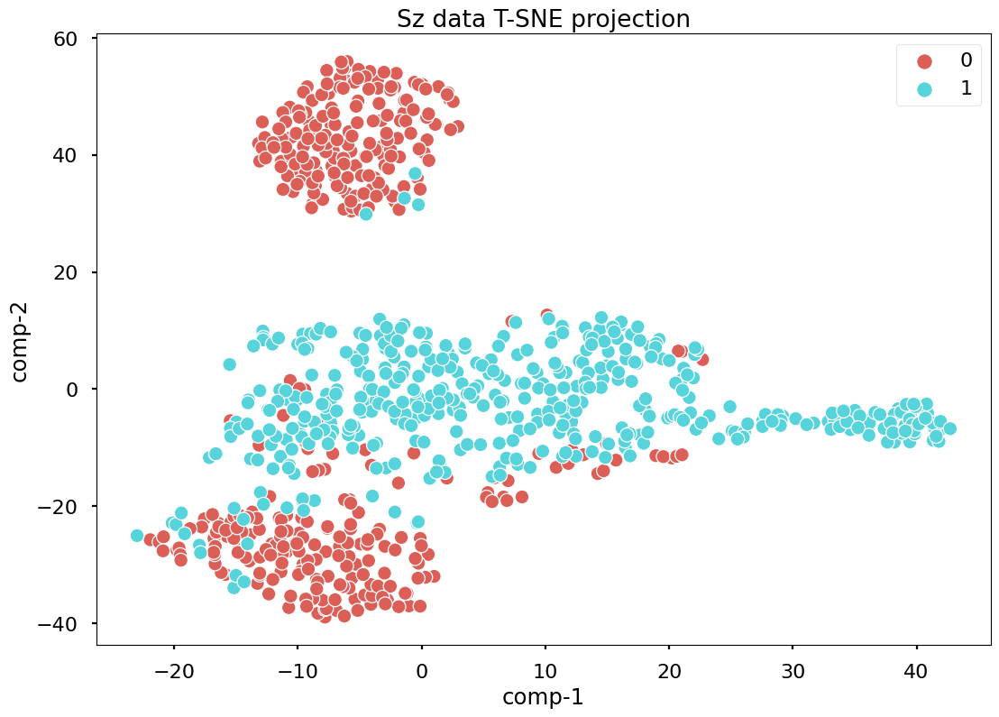

26/26 [==============================] - 1s 30ms/step


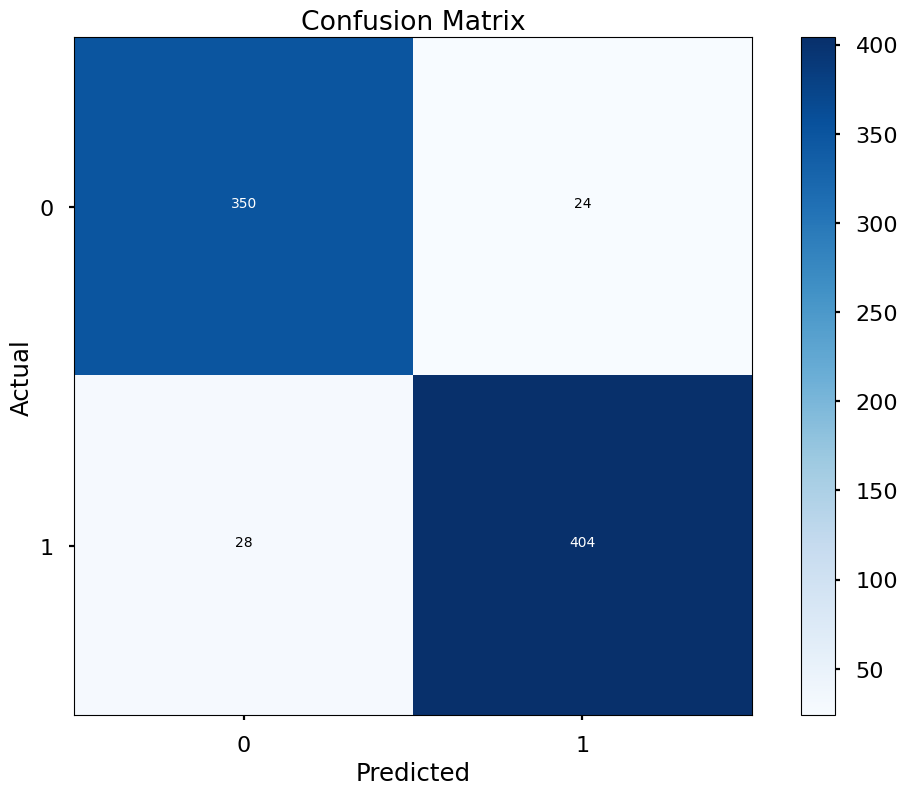

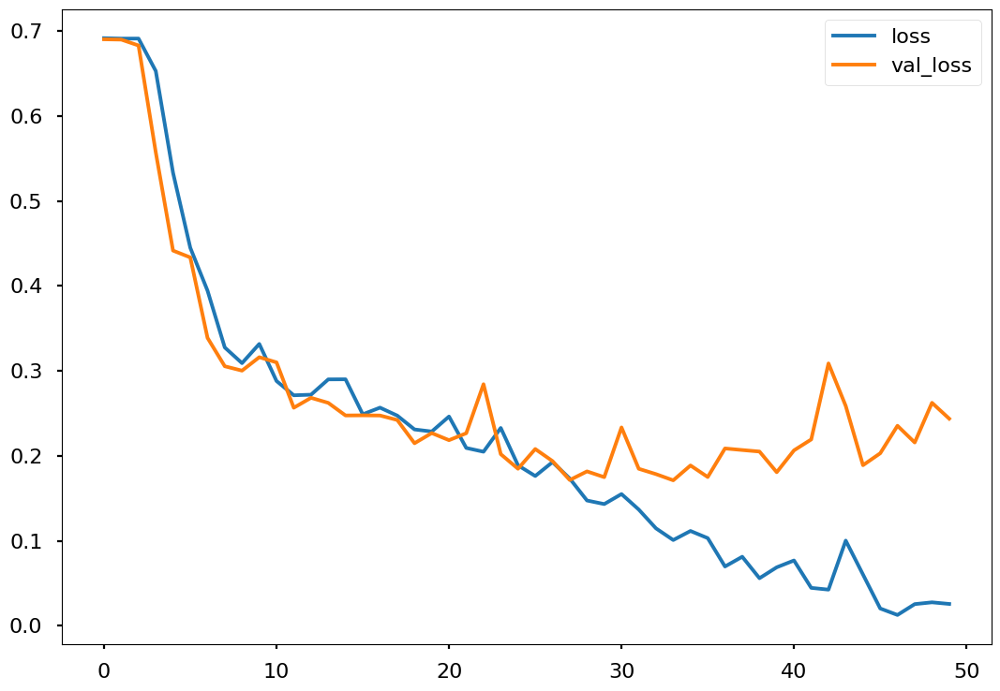

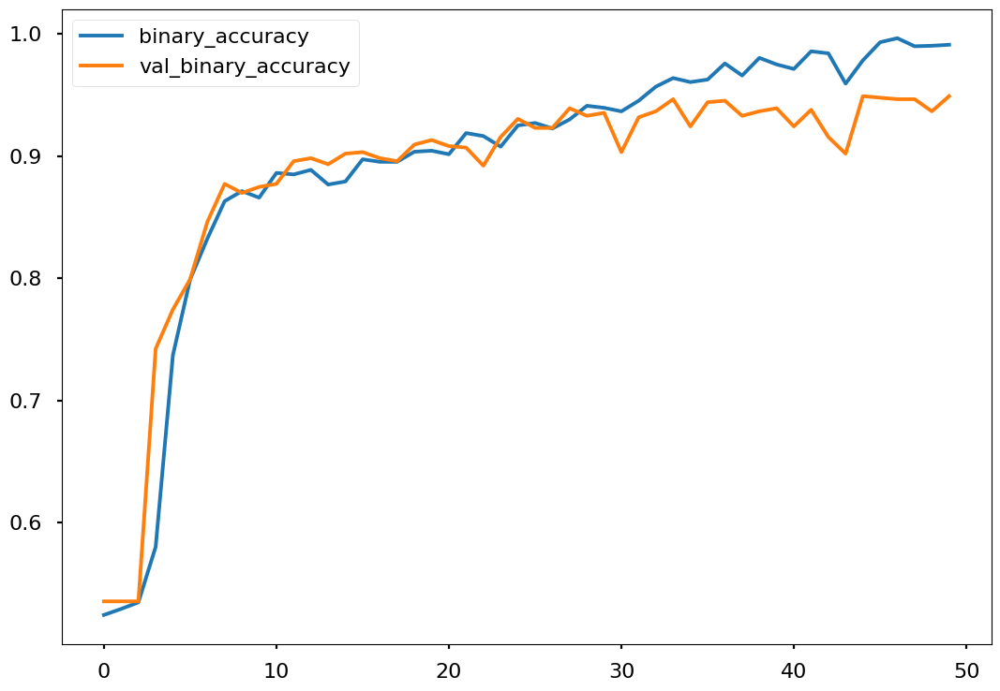

In [ ]:
# order 5 (4 - 45), AdamW, Notched 50Hz, Scalogram, 20 sec seg, z score

accuracy = []
precision = []
recall = []
spec = []
f1 = []

i = 1

for train_index, test_index in Skf.split(nspec_data_array, labels_array):
    optimizer1 = Adam(learning_rate=0.0001)
    optimizer2 = RMSprop(learning_rate=0.00001)
    optimizer3 = SGD(learning_rate=0.0001)
    optimizer4 = Adafactor(learning_rate=0.0001)
    optimizer5 = AdamW(learning_rate=0.0001)

    train_features, train_labels = nspec_data_array[train_index], labels_array[train_index]
    test_features, test_labels = nspec_data_array[test_index], labels_array[test_index]

    train_features, val_features, train_labels, val_labels = train_test_split(train_features, train_labels, test_size=0.25, stratify=train_labels)

    model = Vgg16_model((112, 112, 3))
    tmod = model[1]
    model = model[0]
    model.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])
    tmod.compile(optimizer5, loss='binary_crossentropy', metrics=['binary_accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), specificity, f1_m])

    history = model.fit(
        train_features, train_labels,
        epochs = 50,
        batch_size = 128,
        validation_data = (val_features,val_labels),
        #callbacks=[early_stopping]
    )

    res = model.evaluate(test_features,test_labels)

    pred_tmod = tmod.predict(test_features)

    tsne = TSNE(n_components=2)
    print(pred_tmod.shape)
    if len(pred_tmod.shape)==4:
        z = tsne.fit_transform(pred_tmod.reshape(pred_tmod.shape[0], pred_tmod.shape[1]*pred_tmod.shape[2]*pred_tmod.shape[3]))
    elif len(pred_tmod.shape)==3:
        z = tsne.fit_transform(pred_tmod.reshape(pred_tmod.shape[0], pred_tmod.shape[1]*pred_tmod.shape[2]))
    else:
        z = tsne.fit_transform(pred_tmod.reshape(pred_tmod.shape[0], pred_tmod.shape[1]))
    df = pd.DataFrame()
    df["y"] = test_labels
    df["comp-1"] = z[:,0]
    df["comp-2"] = z[:,1]

    sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
            palette=sns.color_palette("hls", 2),
            data=df).set(title="Sz data T-SNE projection")
    plt.show()

    y_pred = model.predict(test_features)
    y_test = test_labels.astype(int).tolist()
    y_pred = np.round(y_pred).tolist()

    cm = confusion_matrix(y_test, y_pred)
    plt.imshow(cm,cmap=plt.cm.Blues,interpolation='nearest')
    plt.colorbar()
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    tick_marks = np.arange(len(set(y_test))) # length of classes
    class_labels = ['0','1']
    tick_marks
    plt.xticks(tick_marks,class_labels)
    plt.yticks(tick_marks,class_labels)
    # plotting text value inside cells
    thresh = cm.max() / 2.
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,format(cm[i,j],'d'),horizontalalignment='center',color='white' if cm[i,j] >thresh else 'black')
    plt.show();

    accuracy.append(res[1])
    precision.append(res[2])
    recall.append(res[3])
    spec.append(res[4])
    f1.append(res[5])

    history_frame = pd.DataFrame(history.history)
    history_frame.loc[:, ['loss', 'val_loss']].plot()
    history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
    plt.show()

In [ ]:
print(sum(accuracy)/len(accuracy)), print(sum(precision)/len(accuracy)), print(sum(recall)/len(accuracy)), print(sum(spec)/len(accuracy)), print(sum(f1)/len(accuracy))

0.92683345079422
0.9321720361709595
0.9314814805984497
0.424313622713089
0.555945634841919


(None, None, None, None, None)